# Course Information
DDS8555 - Predictive Analysis<br>
Assignment 8<br>
Build & Evaluate Time Series Models.

By - Samuel Mbah Nde
Due Date and Time: Sunday March 16th 2025 at 11:59PM PST.

## Import the packages needed analyze data.
I will load all the packages needed in one place to keep my code organized.

In [2733]:
import math
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from collections import defaultdict
import seaborn as sns
from scipy import stats
from scipy.signal import periodogram
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing

from pmdarima import auto_arima
from scipy.stats import probplot
import re, os, json, requests, random
from datetime import datetime, timedelta, timezone
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, LogisticRegression, Lasso
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import  LinearDiscriminantAnalysis as LDA,       QuadraticDiscriminantAnalysis as QDA
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier, IsolationForest
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, LabelEncoder, OrdinalEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import cross_val_score, KFold, train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold


from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import (mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score,
                            accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, make_scorer)
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn import datasets
from ISLP import load_data, confusion_table
from ISLP.models import (summarize,
                         poly,
                         ModelSpec)
from functools import partial
from statsmodels.gam.api import BSplines
from statsmodels.stats.anova import anova_lm

import warnings
warnings.filterwarnings('ignore', category=RuntimeWarning)

## Set seed to ensure work is reproducible.

In [3]:
random.seed(6222)

## Question 3. San Francisco Crime Classification
Compete in the San Francisco Crime Classification competition (late submission) on Kaggle.com.  You will submit two tree models and one Support Vector Machine.  You must interpret your classification models, provide your code, and provide evidence of successful submission to Kaggle.com.   Investigate assumptions.  Interpret all of your findings.

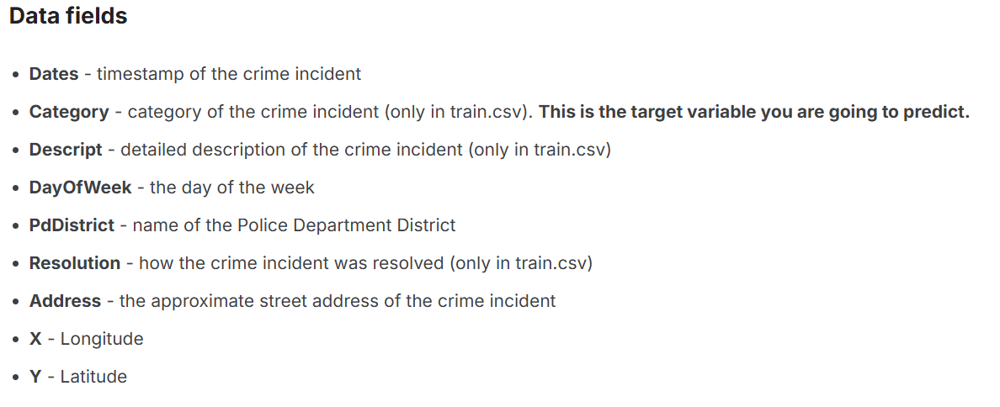

In [6]:
# Read and load data into a dataframe.
data_path = 'Data/SanFranciscoCrime/'
test = pd.read_csv(f"{data_path}test.csv", parse_dates= ['Dates'])
train = pd.read_csv(f"{data_path}train.csv", parse_dates= ['Dates'])
sample_submission = pd.read_csv(f"{data_path}sampleSubmission.csv")

In [7]:
test.shape, train.shape, sample_submission.shape

((884262, 7), (878049, 9), (884262, 40))

In [8]:
train.columns

Index(['Dates', 'Category', 'Descript', 'DayOfWeek', 'PdDistrict',
       'Resolution', 'Address', 'X', 'Y'],
      dtype='object')

In [9]:
test.columns

Index(['Id', 'Dates', 'DayOfWeek', 'PdDistrict', 'Address', 'X', 'Y'], dtype='object')

In [10]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [11]:
test.head()

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


## Exploratory Data Analysis

### Dropping of certain fields
From the data dictionary, I see that some fields like `Descript and Resolution` are populated only the training dataset.
It will not make sense to use such fields for analysis because those are not populated in the test dataset.
For this reason, I will drop these fields from the test training dataset.

Also, the `Id` column is only present in the test dataset and is not a feature of the dataset but rather a record identifier. So, I drop it from the test set.

In [22]:
raw_columns = list(test.columns.drop('Id'))
raw_columns

['Dates', 'DayOfWeek', 'PdDistrict', 'Address', 'X', 'Y']

In [24]:
test = test[raw_columns]
train = train[['Category'] +raw_columns]

In [26]:
test.head()

,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [28]:
train.head()

,Category,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,WARRANTS,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
1,OTHER OFFENSES,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
2,OTHER OFFENSES,2015-05-13 23:33:00,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873
4,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541


In [30]:
train.Category.value_counts()

Category
LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQ

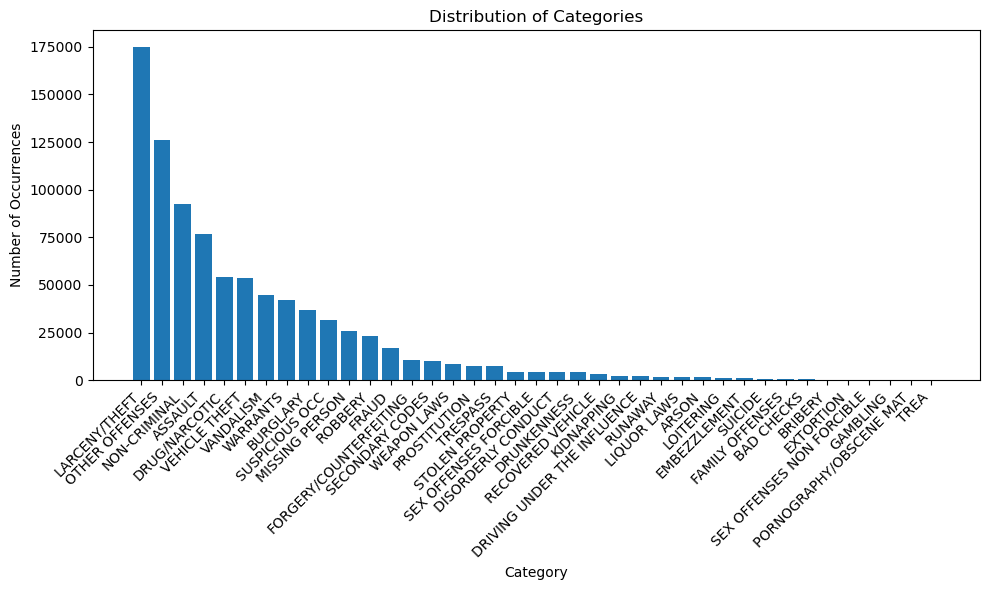

In [32]:
category_counts = train['Category'].value_counts()
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.bar(category_counts.index, category_counts.values)
plt.xlabel('Category')
plt.ylabel('Number of Occurrences')
plt.title('Distribution of Categories')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

### Observations from the bar graph of the distribution of Category (Target Variable).
From the bar graph, it is clear that we will suffer from the problem of imbalance data. Most of the data will be in 2 categories.


### Confirm that all the columns in sample submission are present in the train Categories

In [35]:
set(train.Category.unique()).difference(sample_submission.columns.drop('Id'))

set()

### Verify the distribution of crimes by Day of Week

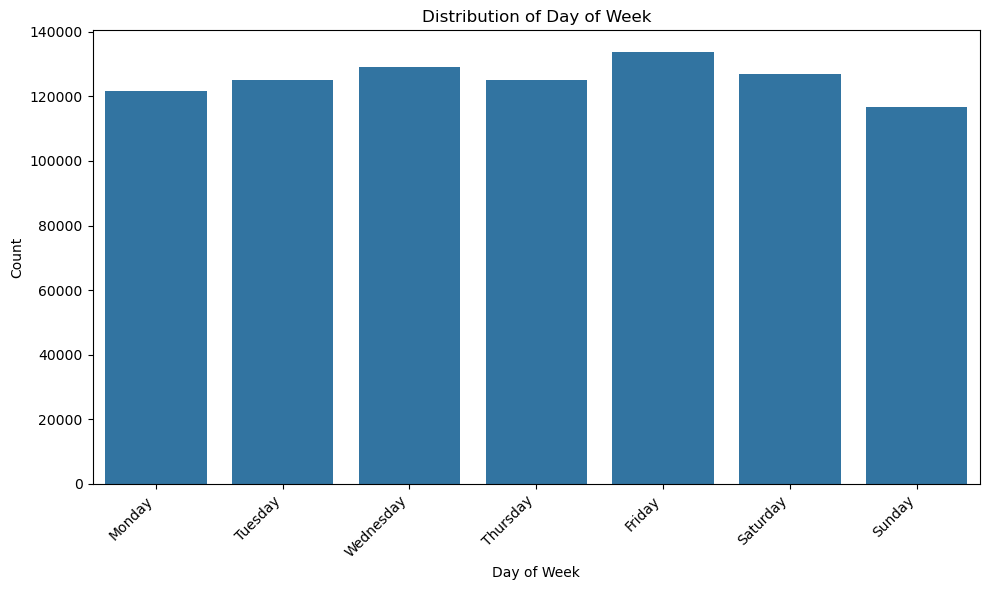

In [38]:
category_counts = train['DayOfWeek'].value_counts()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.figure(figsize=(10, 6))
sns.countplot(x='DayOfWeek', data=train, order=day_order)
plt.title('Distribution of Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Observations from the bar graph of the distribution Crime by Week Day.
From the bar graph,one can see that most crime happens on Wednesdays and Fridays and the least crime happens on Sunday. This may be related to the fact that the society generally sees Sunday as a holy day..

In [41]:
t = train['Dates'].dt.strftime('%Y-%m-%d')
aggs = t.value_counts()
aggs

Dates
2011-01-01    650
2013-11-01    626
2006-01-01    621
2004-04-01    563
2013-10-04    555
             ... 
2008-12-25    199
2013-12-23    187
2013-12-24    173
2013-12-25    152
2007-12-16      2
Name: count, Length: 2249, dtype: int64

In [42]:
agg_dates = pd.DataFrame(aggs).reset_index(drop=False)
agg_dates['Dates'] = pd.to_datetime(agg_dates['Dates'].values.tolist())
agg_dates.sort_values(by = 'Dates', inplace=True)
agg_dates.head()

,Dates,count
901,2003-01-06,400
602,2003-01-07,418
7,2003-01-08,528
613,2003-01-09,417
923,2003-01-10,399


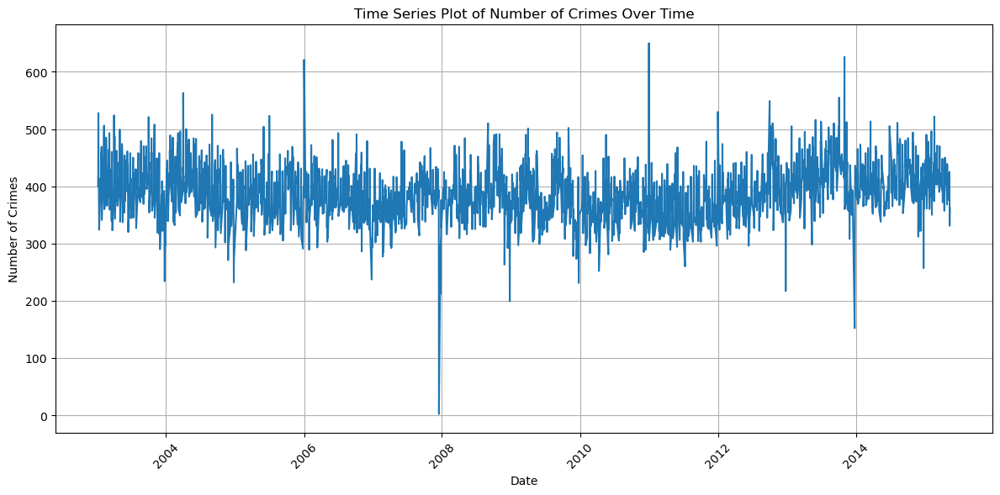

In [45]:
# Plot the time series data
plt.figure(figsize=(12, 6)) 
plt.plot(agg_dates['Dates'], agg_dates['count'], linestyle='-')

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Number of Crimes')
plt.title('Time Series Plot of Number of Crimes Over Time')
plt.grid(True)

plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

##  Observations from 
Note that there is no clear trend of crime. There are occational peaks and drops.

In [48]:
train.PdDistrict.value_counts()

PdDistrict
SOUTHERN      157182
MISSION       119908
NORTHERN      105296
BAYVIEW        89431
CENTRAL        85460
TENDERLOIN     81809
INGLESIDE      78845
TARAVAL        65596
PARK           49313
RICHMOND       45209
Name: count, dtype: int64

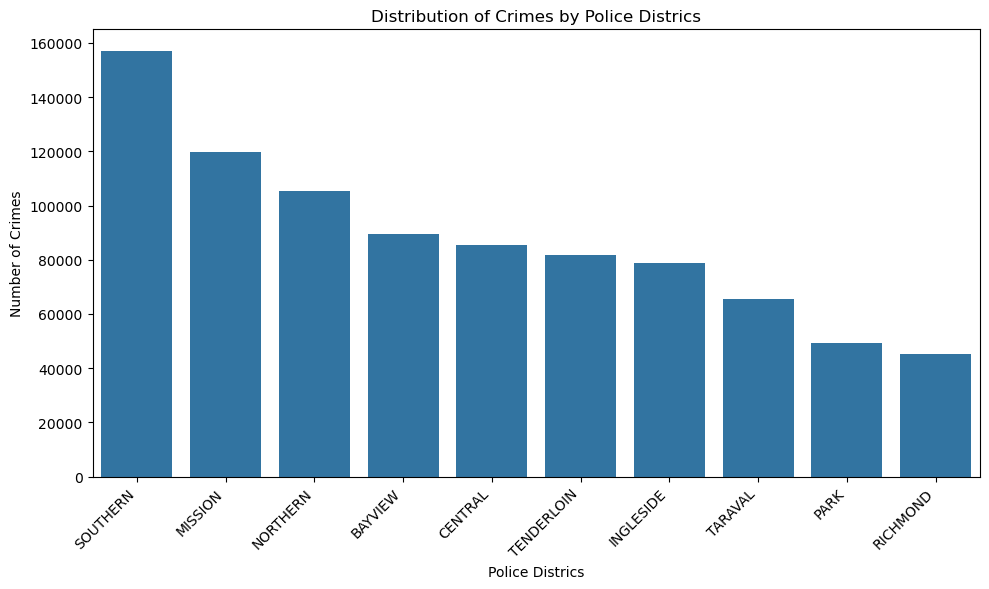

In [50]:
category_counts = train['PdDistrict'].value_counts()
plt.figure(figsize=(10, 6))
sns.countplot(x='PdDistrict', data=train, order = category_counts.index)
plt.title('Distribution of Crimes by Police Districs')
plt.xlabel('Police Districs')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [52]:
train.head()

,Category,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,WARRANTS,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
1,OTHER OFFENSES,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
2,OTHER OFFENSES,2015-05-13 23:33:00,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873
4,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541


## Plot the crime by Police District

Text(0.5, 1.0, 'Crime Distribution by District')

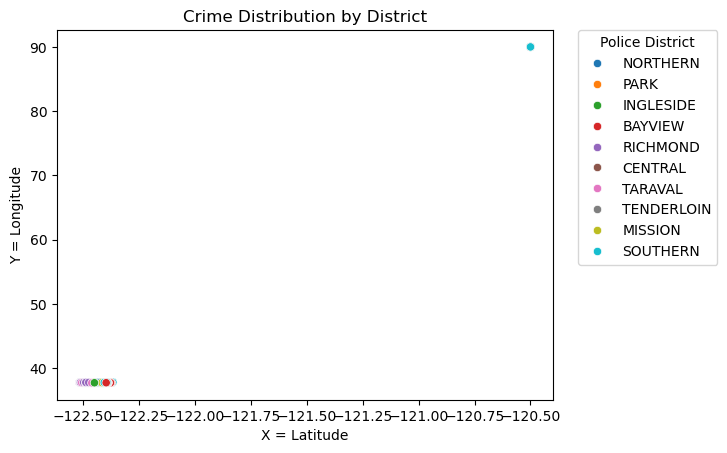

In [55]:
sns.scatterplot(
    data=train,
    x='X', 
    y='Y', 
    hue='PdDistrict'
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.0, title='Police District')
plt.xlabel('X = Latitude')
plt.ylabel('Y = Longitude')
plt.title('Crime Distribution by District')

## Observations from the plot.
The plot reveals that some of the records the presence of some outliers in the datase. 
Since LA is far below the latitde 90, these values are missing at random and we should delete them from the dataset.

In [318]:
train = train[train.Y < 80]

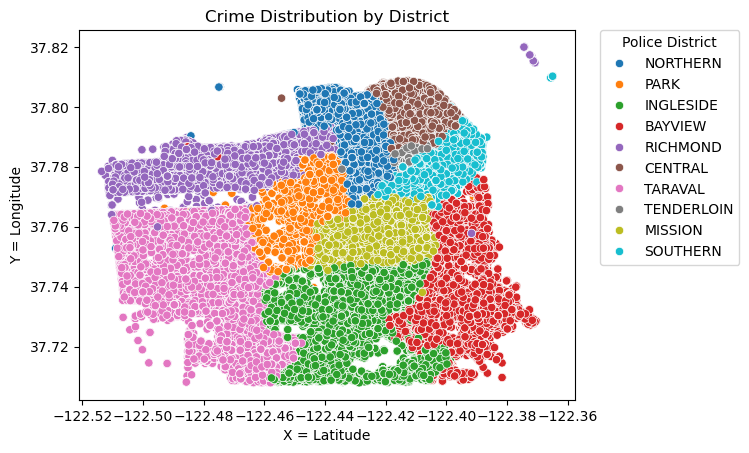

In [319]:
sns.scatterplot(
    data=train,
    x='X', 
    y='Y', 
    hue='PdDistrict'
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.0, title='Police District')
plt.xlabel('X = Latitude')
plt.ylabel('Y = Longitude')
plt.title('Crime Distribution by District')
#plt.legend();
plt.show()

## Features Extraction
From the view of the head of the dataframes, all but the features `X and y` are not numeric.
I dedicate the this section to converting these features into numerical features that can be consumed by a model.

In [56]:
addresses = train.Address.values.tolist()
n = len(addresses)
blocks, intersections = 0, 0
for address in addresses:
    
    if '/' in address:
        intersections += 1
    elif 'block of ' in address.lower():
        blocks += 1
n, blocks, intersections, blocks+intersections

(878049, 617231, 260818, 878049)

## Breakdown addresses
Note that from the above logic, we can break down each address as an intersection or a block.

We could further break down the data into the specific streets at the intersection or blocks as shown in the code below but this is not going to add more information since that information is already captured in the latitude and logitude.

In [57]:
train['IsIntersection'] = train.Address.apply(lambda x: 1 if '/' in x else 0)
test['IsIntersection'] = test.Address.apply(lambda x: 1 if '/' in x else 0)

## Extract Date Features
I will use the Year, Month, Day and Hour and minute from the date

In [59]:

train['Year'] = train.Dates.dt.year
train['Month'] = train.Dates.dt.month
train['Day'] = train.Dates.dt.day
train['Hour'] = train.Dates.dt.hour
train['dayofweek'] = train.Dates.dt.dayofweek

test['Year'] = test.Dates.dt.year
test['Month'] = test.Dates.dt.month
test['Day'] = test.Dates.dt.day
test['Hour'] = test.Dates.dt.hour
test['dayofweek'] = test.Dates.dt.dayofweek

In [60]:
train.head()

,Category,Dates,DayOfWeek,PdDistrict,Address,X,Y,IsIntersection,Year,Month,Day,Hour,dayofweek
0,WARRANTS,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,1,2015,5,13,23,2
1,OTHER OFFENSES,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,1,2015,5,13,23,2
2,OTHER OFFENSES,2015-05-13 23:33:00,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,1,2015,5,13,23,2
3,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,0,2015,5,13,23,2
4,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,0,2015,5,13,23,2


In [61]:
train.columns

Index(['Category', 'Dates', 'DayOfWeek', 'PdDistrict', 'Address', 'X', 'Y',
       'IsIntersection', 'Year', 'Month', 'Day', 'Hour', 'dayofweek'],
      dtype='object')

In [62]:
model_columns = ['PdDistrict', 'Address', 'X', 'Y', 'IsIntersection', 'Year', 'Month', 'Day', 'Hour', 'dayofweek']

In [63]:
sorted(test.PdDistrict.unique()) == sorted(train.PdDistrict.unique())

True

## Get Ordinal Encoding for Days of Addresses for DayOfWeek and PdDistrict and prepare Target variable.
There is some ordering in `['PdDistrict', 'Address', 'dayofweek']` because these are either locations which have a specific point or days of a week which follow a specific order. This is the motivation for using Ordinal Encoding.

## Prepare Target Variable.
Since we have multiple classes to predict, this will be a multiclass prediction. I will convert the string target variables into numeric variables using SKlearn's Label encoder.

In [72]:
district_encoder = OrdinalEncoder(
        unknown_value=-1, 
        handle_unknown='use_encoded_value')

address_encoder = OrdinalEncoder(
        unknown_value=-1, 
        handle_unknown='use_encoded_value')

category_encoder = LabelEncoder()

train['EncodedCategory']=category_encoder.fit_transform(train[['Category']])

train['EncodedDistrict']=district_encoder.fit_transform(train[['PdDistrict']])
test['EncodedDistrict']=district_encoder.transform(test[['PdDistrict']])

train['EncodedAddress']=address_encoder.fit_transform(train[['Address']])
test['EncodedAddress']=address_encoder.transform(test[['Address']])


test['EncodedAddress']=address_encoder.transform(test[['Address']])
test['EncodedDistrict']=district_encoder.transform(test[['PdDistrict']])

train['EncodedCategory'] = category_encoder.fit_transform(train['Category'])

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [76]:
test.head()

,Dates,DayOfWeek,PdDistrict,Address,X,Y,IsIntersection,Year,Month,Day,Hour,dayofweek,EncodedDistrict,EncodedAddress
0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051,0,2015,5,10,23,6,0.0,6420.0
1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432,1,2015,5,10,23,6,0.0,9760.0
2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212,0,2015,5,10,23,6,4.0,6349.0
3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412,0,2015,5,10,23,6,2.0,10656.0
4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412,0,2015,5,10,23,6,2.0,10656.0


In [78]:
train.head()

,Category,Dates,DayOfWeek,PdDistrict,Address,X,Y,IsIntersection,Year,Month,Day,Hour,dayofweek,EncodedCategory,EncodedDistrict,EncodedAddress
0,WARRANTS,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,1,2015,5,13,23,2,37,4.0,19790.0
1,OTHER OFFENSES,2015-05-13 23:53:00,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,1,2015,5,13,23,2,21,4.0,19790.0
2,OTHER OFFENSES,2015-05-13 23:33:00,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,1,2015,5,13,23,2,21,4.0,22697.0
3,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,0,2015,5,13,23,2,16,4.0,4266.0
4,LARCENY/THEFT,2015-05-13 23:30:00,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,0,2015,5,13,23,2,16,5.0,1843.0


In [80]:
training_columns = ['X', 'Y', 'IsIntersection', 'Year', 'Month', 'Day', 'Hour', 'dayofweek', 'EncodedDistrict', 'EncodedAddress']
print(training_columns)

['X', 'Y', 'IsIntersection', 'Year', 'Month', 'Day', 'Hour', 'dayofweek', 'EncodedDistrict', 'EncodedAddress']


In [82]:
y = train[['EncodedCategory']]

## Handle duplicate values
There are many duplicate values in the training dataset.
To clean this, I will drop all duplicates before splitting the data into training and test sets for modelling.


### Note
Keeping duplicate values will make tree models more computationally expensive and can potentially lead to overfitting and biased estimates.

In [84]:
train[training_columns].drop_duplicates().shape, train[training_columns].shape

((680371, 10), (878049, 10))

In [85]:
X = train[training_columns].drop_duplicates()
X1 = test[training_columns]
y = train[train.index.isin(X.index)]['EncodedCategory']

### Investigating multicolinearities and other relationships in the dataset.
The correlation matrix below shows the correlations between the variables to be used for training model.


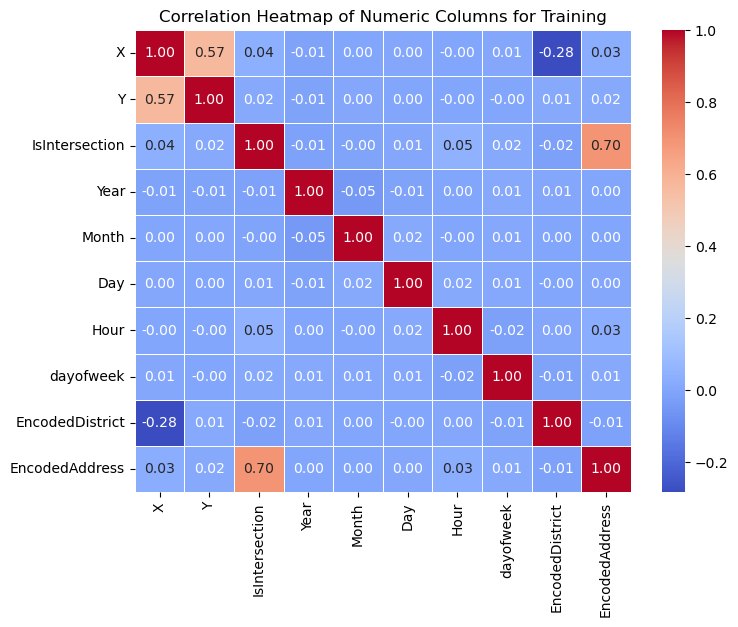

In [89]:
corr_matrix = X.corr()

# Create the heatmap
plt.figure(figsize=(8, 6))  # Adjust figure size as needed
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Numeric Columns for Training')
plt.show()


### Notice the moderate correlation between Encoded Address and IsIntersction.
This relationship is expected because both are derived columns, extracted from the address. Since the magnitude of the correlation is not more than 0.7, I will not be removing either of the variables from the training dataset.

### Inspecting the distribution of the variables.
Below, I plot a pair plot of the columns to be used for training the model. I inspect the diagonal density plot to see if there are significant skews in the data that may impact a decision of using any column in some algorithms.

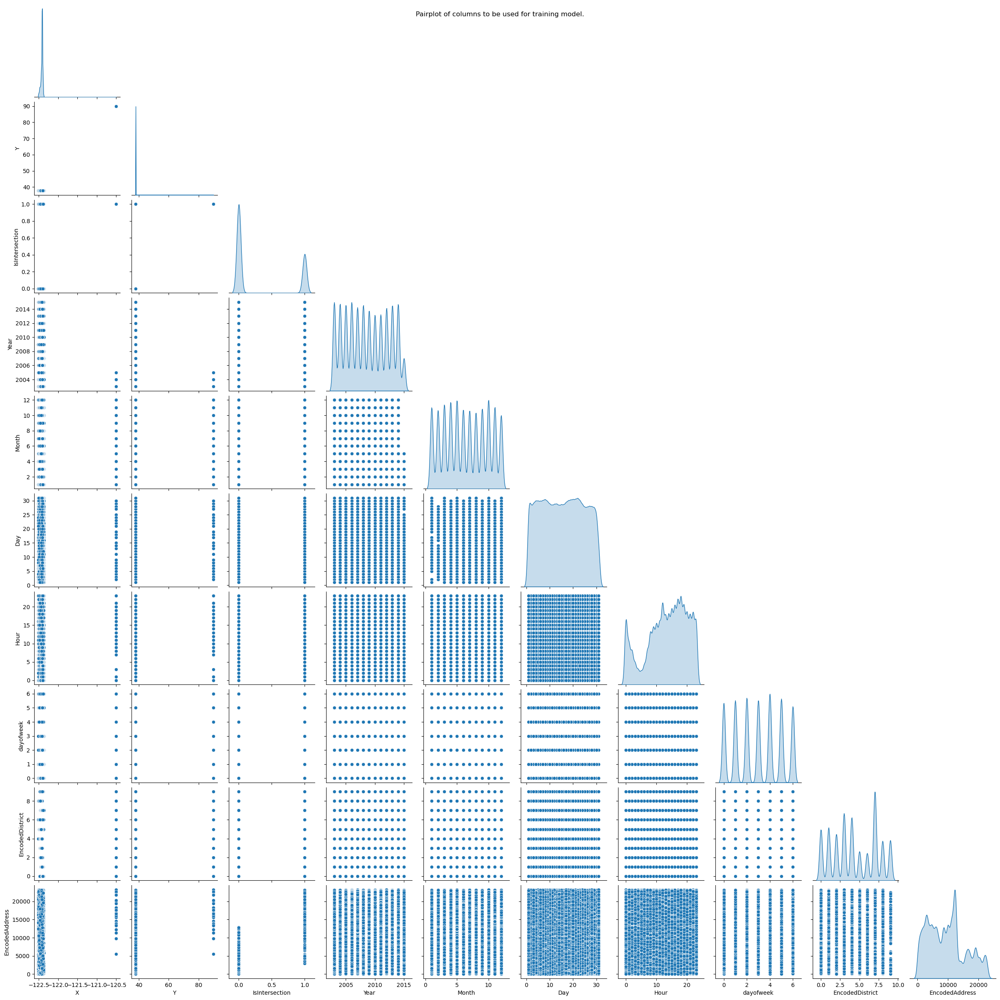

In [593]:
g = sns.pairplot(X, corner=True, diag_kind='kde')
# Set the title of the plot
g.fig.suptitle(f"Pairplot of columns to be used for training model.")
plt.show()

### Observation from pairplot.
It is interesting to note that most crime happen in the hours of the evening to learly morning. This suggests that crime is mostly committed at night.

## Splitting and Standardize the dataset for training model.
Some of the models I will be building are sensitive to distance but the features in the dataset are of differnt scales. For this reason, I will standardize the data before treaining model.

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=622, stratify=y)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Fitting Classification Models
First, I write a function to print classification report.

In [94]:
def visualize_classification_results(y_true, y_pred):
    """
    Visualizes the confusion matrix and classification report.

    Args:
        y_true: The true target values.
        y_pred: The predicted target values.
    """

    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Generate classification report
    cr = classification_report(y_true, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    # Print classification report
    print("Classification Report:\n", cr)

## Fitting Tree Models
### 1) Random Forest Model

For fitting the random forest model, I will loop through different tree depts to find the one with optimal fit.

In [505]:
x = []
test_scores = []
train_scores = []

for n in range(1, 21):
    print(f'step {n}')
    clf = RandomForestClassifier(n_estimators=n, n_jobs=-1, max_depth=3)
    clf.fit(X_train, y_train)
    
    test_scores.append(
    roc_auc_score(
        y_test, 
        clf.predict_proba(X_test), 
        multi_class='ovr'
    ))

    train_scores.append(
    roc_auc_score(
        y_train, 
        clf.predict_proba(X_train), 
        multi_class='ovr'
    ))
    
    x.append(n)
    score_diff = abs(test_scores[-1] - train_scores[-1])
    if score_diff > .2:
        print(f'n_estimators: {n}')
        print(f'scores train/test {train_scores[-1]:.2f}/{test_scores[-1]:2f}')
        break

step 1
step 2
step 3
step 4
step 5
step 6
step 7
step 8
step 9
step 10
step 11
step 12
step 13
step 14
step 15
step 16
step 17
step 18
step 19
step 20


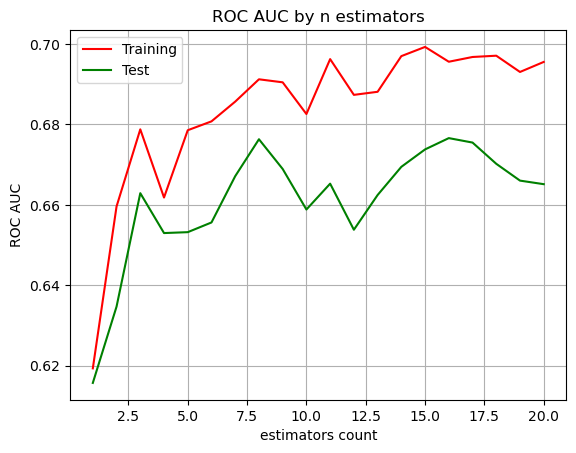

In [508]:
plt.plot(x, train_scores, color = 'r', label = 'Training')
plt.plot(x, test_scores, color = 'g', label = 'Test')
plt.grid()
plt.title('ROC AUC by n estimators')
plt.xlabel('estimators count')
plt.ylabel('ROC AUC')
plt.legend()
plt.show()

## Observations from AUC
From the AUC, we see that the training and test AUC increases with the number of estimators up to 8, from where increments in estimators only increases AUC for training set. This suggests that using trees with more than 8 depth is resulting in `overfitting`. For this reason, my final model will be based on tree dept of 8.


## Hyper parameter tuning.
To improve the model, I designed the function below to showcase how I would fine tune it but did not run it because of computation limited resources.


## Note about general grid search for parameters.
The approach used below would be valid for any of the three tree models which I will train below.

In [530]:

# def tune_random_forest(X_train, y_train, n_iter=50, cv_folds=5, random_state=42):
#     """
#     Tunes a Random Forest Classifier using RandomizedSearchCV and evaluates performance.

#     Args:
#         X_train: Training features.
#         y_train: Training labels.
#         n_iter: Number of parameter settings sampled.
#         cv_folds: Number of cross-validation folds.
#         random_state: Seed for reproducibility.

#     Returns:
#         tuple: Best model, best parameters, and cross-validation scores.
#     """

#     # Define the parameter grid
#     param_dist = {
#         'n_estimators': np.arange(50, 126, 25),
#         'max_depth': list(np.arange(4, 10, 2)),
#         'min_samples_split': np.arange(2, 7, 2),
#         'min_samples_leaf': np.arange(1, 10, 2),
#         'max_features': ['sqrt', 'log2'],
#         'class_weight': ['balanced']
#     }

#     # Create the Random Forest Classifier
#     rf = RandomForestClassifier(random_state=random_state)

#     # Use StratifiedKFold for cross-validation to handle class imbalance
#     cv = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=random_state)

#     # Define a custom scoring function for multiclass ROC AUC
#     def multiclass_roc_auc_scorer(y_true, y_proba):
#         try:
#             return roc_auc_score(y_true, y_proba, multi_class='ovr')  # one-vs-rest
#         except ValueError:
#             # Handle cases where only one class is present in a fold
#             return 0.5  # Return a neutral value

#     roc_auc_scorer = make_scorer(multiclass_roc_auc_scorer, needs_proba=True)

#     # Perform RandomizedSearchCV
#     random_search = RandomizedSearchCV(
#         estimator=rf,
#         param_distributions=param_dist,
#         n_iter=n_iter,
#         scoring=roc_auc_scorer,
#         cv=cv,
#         verbose=2,
#         random_state=random_state,
#         n_jobs=-1  # Use all available cores
#     )

#     random_search.fit(X_train, y_train)

#     # Get the best model, parameters, and scores
#     best_rf = random_search.best_estimator_
#     best_params = random_search.best_params_
#     cv_results = random_search.cv_results_

#     return best_rf, best_params, cv_results

# # Example Usage (replace with your data)
# best_rf, best_params, cv_results = tune_random_forest(X_train, y_train)
# print("Best Parameters:", best_params)
# print("Best ROC AUC:", cv_results['mean_test_score'].max())

# # Accessing other cross-validation results:
# print(cv_results) 
# print(cv_results['mean_test_score'])
# print(cv_results['std_test_score'])

### 1) Random Forest Classifier

In [96]:
rf_model = RandomForestClassifier(random_state=42, n_estimators = 8)
rf_model.fit(X_train, y_train)
test_preds_rf = rf_model.predict(X_test)
print("Random Classification Report:\n", classification_report(y_test, test_preds_rf))

Random Classification Report:
               precision    recall  f1-score   support

           0       0.03      0.02      0.02       261
           1       0.13      0.19      0.15     11106
           2       0.03      0.01      0.02        68
           3       0.00      0.00      0.00        22
           4       0.15      0.18      0.16      6491
           5       0.11      0.07      0.08       502
           6       0.04      0.02      0.03       312
           7       0.26      0.30      0.27      5657
           8       0.02      0.01      0.01       454
           9       0.05      0.02      0.03       195
          10       0.00      0.00      0.00        33
          11       0.07      0.03      0.04        73
          12       0.08      0.06      0.07      1653
          13       0.06      0.04      0.05      2299
          14       0.00      0.00      0.00        22
          15       0.01      0.01      0.01       199
          16       0.37      0.55      0.44     32

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### 2) Gradient Boosted Classifier

In [97]:
gb_model = GradientBoostingClassifier(n_estimators=8,
                                        max_depth=5,
                                        min_samples_split=5,
                                        min_samples_leaf=2,
                                        max_features='sqrt',
                                        learning_rate = 0.08,
                                        random_state=42)
gb_model.fit(X_train, y_train)
test_preds_gb = gb_model.predict(X_test)
print("GradientBoostingClassifier Classification Report:\n", classification_report(y_test, test_preds_gb))

GradientBoostingClassifier Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       261
           1       0.00      0.00      0.00     11106
           2       0.00      0.00      0.00        68
           3       0.02      0.05      0.03        22
           4       0.00      0.00      0.00      6491
           5       0.39      0.02      0.03       502
           6       0.00      0.00      0.00       312
           7       0.40      0.08      0.14      5657
           8       0.00      0.00      0.00       454
           9       0.00      0.00      0.00       195
          10       0.03      0.03      0.03        33
          11       0.00      0.00      0.00        73
          12       0.00      0.00      0.00      1653
          13       0.00      0.00      0.00      2299
          14       0.00      0.00      0.00        22
          15       0.00      0.00      0.00       199
          16       0.25      0

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [543]:
X_train.shape, X_train_scaled.shape

((544296, 10), (544296, 10))

### 3) Support Vector Machine Classifier

In [545]:
svm_model = LinearSVC(C=10, dual='auto', verbose=1, class_weight = 'balanced')
svm_model.fit(X_train_scaled, y_train)

y_pred_svm = svm_model.predict(X_test_scaled)

print("SVM Classification Report:\n", classification_report(y_test, y_pred_svm))

[LibLinear]SVM Classification Report:
               precision    recall  f1-score   support

           0       0.03      0.01      0.01       261
           1       0.00      0.00      0.00     11106
           2       0.00      0.03      0.00        68
           3       0.00      0.00      0.00        22
           4       0.08      0.05      0.06      6491
           5       0.00      0.00      0.00       502
           6       0.01      0.26      0.02       312
           7       0.11      0.19      0.14      5657
           8       0.00      0.00      0.00       454
           9       0.00      0.09      0.01       195
          10       0.00      0.09      0.00        33
          11       0.00      0.15      0.01        73
          12       0.03      0.02      0.03      1653
          13       0.11      0.00      0.00      2299
          14       0.00      0.05      0.00        22
          15       0.00      0.00      0.00       199
          16       0.35      0.11      0.1

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [579]:
all_categories = sorted(category_encoder.classes_)
def predict_with_scaling_pca(model, X, scaler, label_encoder, ids, output_file_path, all_categories =  all_categories, scale_data = False):
    """
    Predicts values using a trained model after scaling and PCA transformation.

    Args:
        model: A trained scikit-learn model (e.g., SVC, RandomForestClassifier).
        X: The unscaled input dataset (NumPy array or Pandas DataFrame).
        scaler: A trained StandardScaler object.
        label_encoder: A trained lable encoder for the categories
        ids: Id values for the predictions
        all_categories: List of strings of all categories expected in the predictions data

    Returns:
        predictions data frame.
    """
    
    ids_df = pd.DataFrame({"Id": ids})
    output = None
    
    if not scale_data:
        y_pred = model.predict_proba(X)
        classes = model.classes_
        class_names = label_encoder.inverse_transform(classes)
        predictions = pd.DataFrame(y_pred, columns = class_names)
        output = pd.concat(objs=[ids_df, predictions], axis = 1)
    else:
        # Scale the data
        X = scaler.transform(X)
        # Make predictions
        y_pred = model.predict(X)
        predicted_categories = label_encoder.inverse_transform(y_pred)
        pred_data = pd.get_dummies(predicted_categories, prefix="", prefix_sep='', drop_first=False, dtype='int')
        output = pd.concat(objs=[ids_df, pred_data], axis = 1)
        empty_columns = []
        print(f'Output columnes {output.columns}')
        for column in all_categories:
            if not column in output.columns:
                empty_columns.append(column)
                output[column] = 0
        output = output[['Id']+sorted(all_categories)]
        print(f'List of {len(empty_columns)} columns with no predictions {empty_columns}')
    output.to_csv(output_file_path, index = False)
    return output


In [575]:
rf_model.classes_

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38])

In [567]:

svm_predictions = predict_with_scaling_pca(svm_model, X1, scaler, category_encoder, test.index, f"{data_path}SupportVectorClassifierPredictions.csv", all_categories, scale_data=True )
svm_predictions.shape

Output columnes Index(['Id', 'ARSON', 'ASSAULT', 'BAD CHECKS', 'BRIBERY', 'BURGLARY',
       'DISORDERLY CONDUCT', 'DRIVING UNDER THE INFLUENCE', 'DRUG/NARCOTIC',
       'EMBEZZLEMENT', 'EXTORTION', 'FAMILY OFFENSES',
       'FORGERY/COUNTERFEITING', 'FRAUD', 'GAMBLING', 'KIDNAPPING',
       'LARCENY/THEFT', 'LIQUOR LAWS', 'LOITERING', 'MISSING PERSON',
       'NON-CRIMINAL', 'OTHER OFFENSES', 'PORNOGRAPHY/OBSCENE MAT',
       'PROSTITUTION', 'RECOVERED VEHICLE', 'RUNAWAY', 'SECONDARY CODES',
       'SEX OFFENSES FORCIBLE', 'SEX OFFENSES NON FORCIBLE', 'STOLEN PROPERTY',
       'SUICIDE', 'TREA', 'TRESPASS', 'VEHICLE THEFT'],
      dtype='object')
List of 6 columns with no predictions ['DRUNKENNESS', 'ROBBERY', 'SUSPICIOUS OCC', 'VANDALISM', 'WARRANTS', 'WEAPON LAWS']


(884262, 40)

In [581]:
random_forest_predictions = predict_with_scaling_pca(rf_model, 
                                                     X1, 
                                                     scaler, 
                                                     category_encoder, 
                                                     test.index, 
                                                     f"{data_path}RandomForestsPredictions.csv", 
                                                     all_categories, scale_data=False )
random_forest_predictions.shape

(884262, 40)

In [584]:
gb_model_predictions = predict_with_scaling_pca(gb_model,
                                                     X1, 
                                                     scaler, 
                                                     category_encoder, 
                                                     test.index, 
                                                     f"{data_path}GradientBoostingPredictions.csv",
                                                     all_categories, scale_data=False)
gb_model_predictions.shape

(884262, 40)

In [597]:
gb_model_predictions.shape

(884262, 40)

In [601]:
gb_model_predictions.head()

,Id,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,...,SEX OFFENSES NON FORCIBLE,STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
0,0,0.003518,0.101584,0.000300,0.000162,0.052859,0.002997,0.002608,0.033703,0.002894,...,0.000171,0.003321,0.000550,0.044162,0.000002,0.007010,0.073792,0.088559,0.033484,0.009619
1,1,0.002636,0.078425,0.000288,0.000156,0.027994,0.002572,0.003348,0.038227,0.002875,...,0.000142,0.002899,0.000037,0.034551,0.000002,0.004288,0.053863,0.069198,0.036705,0.009180
2,2,0.001735,0.074481,0.000337,0.000150,0.094564,0.002620,0.002166,0.025099,0.003216,...,0.000148,0.003237,0.000508,0.036158,0.000002,0.006567,0.058566,0.063138,0.024530,0.005784
3,3,0.002128,0.086980,0.000280,0.000172,0.047221,0.002989,0.002258,0.029074,0.002554,...,0.000188,0.002777,0.000512,0.037004,0.000002,0.005532,0.070869,0.112152,0.028996,0.008363
4,4,0.002128,0.086980,0.000280,0.000172,0.047221,0.002989,0.002258,0.029074,0.002554,...,0.000188,0.002777,0.000512,0.037004,0.000002,0.005532,0.070869,0.112152,0.028996,0.008363


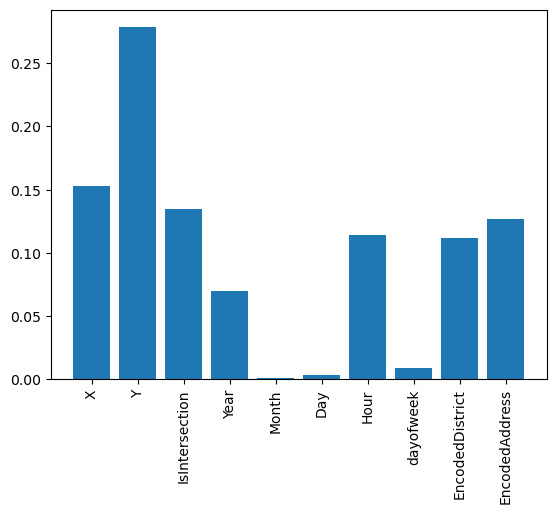

In [628]:
feature_importance = gb_model.feature_importances_
feature_names = gb_model.feature_names_in_
plt.bar(feature_names, feature_importance)
plt.xticks(rotation=90)
plt.show()

### Interpreting Feature Importance of Tree Models
The function below plots the feature importances for the random forests and gradient boosting classifier model.

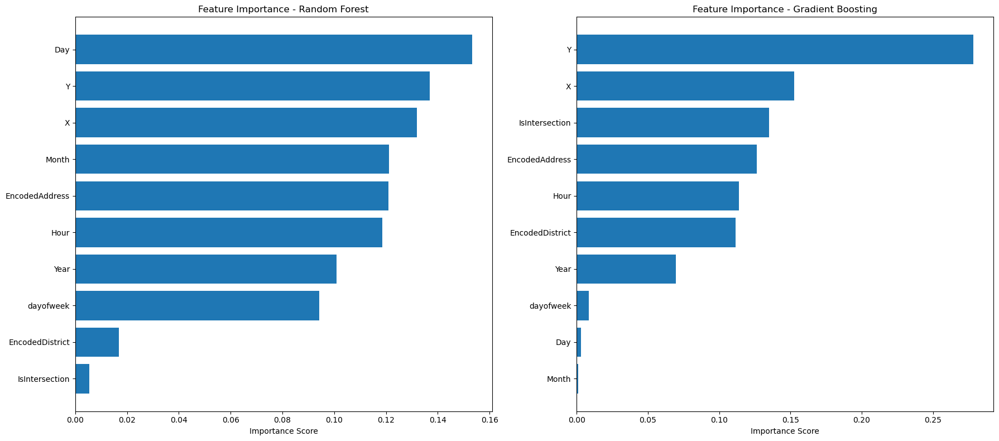

In [102]:
def plot_feature_importances_side_by_side(rf_model, gb_model):
    """
    Plots feature importances for RandomForest and GradientBoosting models side by side.

    Args:
        rf_model: Trained RandomForestClassifier model.
        gb_model: Trained GradientBoostingClassifier model.
        X_train: Training features (DataFrame).
    """

    # Feature Importance for RandomForest
    rf_importance = rf_model.feature_importances_
    rf_importance_df = pd.DataFrame({
        'Feature': rf_model.feature_names_in_,
        'Importance': rf_model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # Feature Importance for GradientBoosting
    gb_importance = gb_model.feature_importances_
    gb_importance_df = pd.DataFrame({
        'Feature': gb_model.feature_names_in_,
        'Importance': gb_model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))  # 1 row, 2 columns

    # Plot RandomForest feature importance
    axes[0].barh(rf_importance_df['Feature'], rf_importance_df['Importance'])
    axes[0].invert_yaxis()
    axes[0].set_title("Feature Importance - Random Forest")
    axes[0].set_xlabel("Importance Score")

    # Plot GradientBoosting feature importance
    axes[1].barh(gb_importance_df['Feature'], gb_importance_df['Importance'])
    axes[1].invert_yaxis()
    axes[1].set_title("Feature Importance - Gradient Boosting")
    axes[1].set_xlabel("Importance Score")

    plt.tight_layout()  # Adjust spacing between subplots
    plt.show()
plot_feature_importances_side_by_side(rf_model, gb_model)

### Interpretation of feature importance scores.
The side-by-side feature importance plots reveal distinct patterns in how Random Forest and Gradient Boosting models prioritize features for prediction. In the Random Forest model (left), "Day" and "Month" exhibit the highest importance, suggesting temporal patterns are crucial. Conversely, Gradient Boosting (right) emphasizes spatial features like "Y" and "X" coordinates, along with address-related information ("intersection," "EncodedAddress," "EncodedDistrict"). This indicates that while both models leverage similar features, they assign different weights, highlighting the varying ways these algorithms capture underlying data relationships. The discrepancies also suggest potential areas for feature engineering or model refinement, as understanding these differences can lead to improved predictive performance.

## Question 1 House Prices Advanced Regression Techniques
Compete in the [House Prices Advanced Regression Techniques](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques) competition (late submissions) on Kaggle.com.  You will submit two regression models for evaluation.  You will use dichotomous variables and interactions, polynomial terms.  You will investigate subsets using methods of the course, and you will evaluate transformations along with dimension reduction. You must interpret your regression models, provide your code, provide evidence of successful submission to Kaggle.com.   Investigate assumptions.  Interpret all of your findings.   

In [402]:
# Read and load data into a dataframe.
data_path = 'Data/HousePricesRegression/'
test = pd.read_csv(f"{data_path}test.csv")
train = pd.read_csv(f"{data_path}train.csv")
sample_submission = pd.read_csv(f"{data_path}sample_submission.csv")

## Exploratory Data Analysis.
The following section is dedicated to exploring the data and creating new features where possible.

In [115]:
train.shape, test.shape

((1460, 81), (1459, 80))

In [117]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [127]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [125]:
test.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
count,1459.000000,1459.000000,1455,1232.000000,1459.000000,1459,107,1459,1459,1457,...,1459.000000,1459.000000,3,290,51,1459.000000,1459.000000,1459.000000,1458,1459
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,1,...,NaN,NaN,2,4,3,NaN,NaN,NaN,9,6
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,...,NaN,NaN,Ex,MnPrv,Shed,NaN,NaN,NaN,WD,Normal
freq,NaN,NaN,1114,NaN,NaN,1453,70,934,1311,1457,...,NaN,NaN,2,172,46,NaN,NaN,NaN,1258,1204
mean,2190.000000,57.378341,NaN,68.580357,9819.161069,NaN,NaN,NaN,NaN,NaN,...,17.064428,1.744345,NaN,NaN,NaN,58.167923,6.104181,2007.769705,NaN,NaN
std,421.321334,42.746880,NaN,22.376841,4955.517327,NaN,NaN,NaN,NaN,NaN,...,56.609763,30.491646,NaN,NaN,NaN,630.806978,2.722432,1.301740,NaN,NaN
min,1461.000000,20.000000,NaN,21.000000,1470.000000,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,NaN,NaN,NaN,0.000000,1.000000,2006.000000,NaN,NaN
25%,1825.500000,20.000000,NaN,58.000000,7391.000000,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,NaN,NaN,NaN,0.000000,4.000000,2007.000000,NaN,NaN
50%,2190.000000,50.000000,NaN,67.000000,9399.000000,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,NaN,NaN,NaN,0.000000,6.000000,2008.000000,NaN,NaN
75%,2554.500000,70.000000,NaN,80.000000,11517.500000,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,NaN,NaN,NaN,0.000000,8.000000,2009.000000,NaN,NaN


## Observe that there are many missing values in the dataset.
This section I focus on filling those values. Some of the records may be missing at random like a house that has a garage but the garage area is null. But some values are missing because the features are not present in the home for example a home may have the pool area 0 because it does not have a pool. In such cases, I will fill the missing values with 0.

In [154]:
def compute_missing_values(df):
    nrows = df.shape[0]
    missing_data = pd.DataFrame(df.isna().sum()).reset_index(drop=False)
    missing_data.columns = 'ColumnName NumberOfNas'.split()
    missing_data.sort_values('NumberOfNas', ascending = False, inplace = True)
    missing_data['MissingPercentage' ] = missing_data.NumberOfNas.apply(lambda x: round(100* x/nrows, 2))
    return missing_data
compute_missing_values(train).head(20)

,ColumnName,NumberOfNas,MissingPercentage
24,MasVnrType,872,59.73
56,FireplaceQu,690,47.26
3,LotFrontage,259,17.74
63,GarageCond,81,5.55
58,GarageYrBlt,81,5.55
59,GarageFinish,81,5.55
62,GarageQual,81,5.55
57,GarageType,81,5.55
34,BsmtFinType2,38,2.60
31,BsmtExposure,38,2.60


## Delete `["PoolQC", "MiscFeature", "Alley", "Fence"]`
These features are missing more than 80% of the time. Keeping them will only contribute to a complex model.

In [404]:
drop_cols = ["PoolQC", "MiscFeature", "Alley", "Fence"]
train.drop(drop_cols, inplace = True, axis = 1)
test.drop(drop_cols, inplace = True, axis = 1)

In [152]:
test.shape, train.shape

((1459, 76), (1460, 77))

In [ ]:
train.sape

In [156]:
compute_missing_values(train).head(20)

,ColumnName,NumberOfNas,MissingPercentage
24,MasVnrType,872,59.73
56,FireplaceQu,690,47.26
3,LotFrontage,259,17.74
63,GarageCond,81,5.55
58,GarageYrBlt,81,5.55
59,GarageFinish,81,5.55
62,GarageQual,81,5.55
57,GarageType,81,5.55
34,BsmtFinType2,38,2.60
31,BsmtExposure,38,2.60


In [158]:
[c for c in train.columns if c.startswith('Mas')]

['MasVnrType', 'MasVnrArea']

## Dealing with MasVnrType and MasVnrArea

We can assume that Masonry veneer type is None if its area is 0


In [406]:
def fill_msaonary_missing(train):
    # Fill MasVnrType based on MasVnrArea
    train.loc[train['MasVnrArea'] == 0, 'MasVnrType'] = 'None'
    
    #Fill remaining MasVnrType with its mode.
    train['MasVnrType'] = train['MasVnrType'].fillna(train['MasVnrType'].mode()[0])
    train['MasVnrArea'] = train['MasVnrArea'].fillna(0)
    return train
train = fill_msaonary_missing(train)
test = fill_msaonary_missing(test)

In [181]:
compute_missing_values(train).head(20)

,ColumnName,NumberOfNas,MissingPercentage
56,FireplaceQu,690,47.26
3,LotFrontage,259,17.74
57,GarageType,81,5.55
63,GarageCond,81,5.55
58,GarageYrBlt,81,5.55
59,GarageFinish,81,5.55
62,GarageQual,81,5.55
34,BsmtFinType2,38,2.60
31,BsmtExposure,38,2.60
32,BsmtFinType1,37,2.53


In [183]:
[c for c in train.columns if 'fire' in c.lower()]

['Fireplaces', 'FireplaceQu']

In [187]:
train.Fireplaces.value_counts(dropna = False)

Fireplaces
0    690
1    650
2    115
3      5
Name: count, dtype: int64

## Note that the number of missing Fireplace Quality is equal to number of houses with no fireplace so set quality to 0

In [408]:
train.fillna({'FireplaceQu': 0}, inplace = True)
test.fillna({'FireplaceQu': 0}, inplace = True)

## Missing LotFrontage

In [191]:
[c for c in train.columns if 'lot' in c.lower()]

['LotFrontage', 'LotArea', 'LotShape', 'LotConfig']

In [196]:
train.LotFrontage.value_counts(dropna = False)

LotFrontage
NaN      259
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
137.0      1
38.0       1
33.0       1
150.0      1
46.0       1
Name: count, Length: 111, dtype: int64

In [198]:
train.LotConfig.value_counts(dropna = False)

LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: count, dtype: int64

In [200]:
train[train.LotFrontage.isna()].LotConfig.value_counts()

LotConfig
Inside     134
Corner      62
CulDSac     49
FR2         14
Name: count, dtype: int64

## Use Median lot frontage for the Neighborhood to fill missing value
Handle missing LotFrontage by neighborhood average

In [410]:
def get_single_mode(series):
    """
    Returns a single mode from a pandas Series. If multiple modes exist,
    it returns the first one. If the series is empty, it returns None.
    """
    mode = series.mode()
    if not mode.empty:
        return mode.iloc[0]
    else:
        return None 
train["LotFrontage"] = train.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(get_single_mode(x)))
test["LotFrontage"]  = test.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(get_single_mode(x)))

In [252]:
compute_missing_values(train).head(20)

,ColumnName,NumberOfNas,MissingPercentage
57,GarageType,81,5.55
58,GarageYrBlt,81,5.55
59,GarageFinish,81,5.55
62,GarageQual,81,5.55
63,GarageCond,81,5.55
34,BsmtFinType2,38,2.60
31,BsmtExposure,38,2.60
32,BsmtFinType1,37,2.53
29,BsmtQual,37,2.53
30,BsmtCond,37,2.53


In [264]:
train.GarageFinish.value_counts()

GarageFinish
Unf    605
RFn    422
Fin    352
Name: count, dtype: int64

## Handle Missing Garage Information
If Garage Area is 0, set
    GarageYrBlt = 1700,
    GarageType = 'None',
    GarageFinish = 'NotA',
    GarageCond = 'NotA',
    GarageQual = 'NotA'

In [255]:
train[train.GarageYrBlt.isna()].to_clipboard(index = False)

In [414]:
def fill_garage_missing(train):
    """
    Fills missing values in garage-related columns based on 'GarageArea'.
    
    Args:
    train: pandas DataFrame representing the training data.
    
    Returns:
    pandas DataFrame with filled missing values.
    """
    # Fill missing GarageArea with 0 first, to be able to use logic
    train['GarageArea'] = train['GarageArea'].fillna(0)
    train['GarageCars'] = train['GarageCars'].fillna(0)
    
    # Fill garage-related columns based on GarageArea
    train.loc[train['GarageArea'] == 0, 'GarageYrBlt'] = 1700
    train.loc[train['GarageArea'] == 0, 'GarageType'] = 'None'
    train.loc[train['GarageArea'] == 0, 'GarageFinish'] = 'NotA'
    train.loc[train['GarageArea'] == 0, 'GarageCond'] = 'NotA'
    train.loc[train['GarageArea'] == 0, 'GarageQual'] = 'NotA'
    
    # Fill remaining GarageYrBlt with median
    train['GarageYrBlt'] = train['GarageYrBlt'].fillna(train['GarageYrBlt'].median())
    
    #Fill remaining GarageType with mode
    train['GarageType'] = train['GarageType'].fillna(train['GarageType'].mode()[0])
    
    #Fill remaining GarageFinish with mode
    train['GarageFinish'] = train['GarageFinish'].fillna(train['GarageFinish'].mode()[0])
    
    #Fill remaining GarageCond with mode
    train['GarageCond'] = train['GarageCond'].fillna(train['GarageCond'].mode()[0])
    
    #Fill remaining GarageQual with mode
    train['GarageQual'] = train['GarageQual'].fillna(train['GarageQual'].mode()[0])   
    
    return train
    
train = fill_garage_missing(train)
test = fill_garage_missing(test)
compute_missing_values(train).head(10)

,ColumnName,NumberOfNas,MissingPercentage
31,BsmtExposure,38,2.60
34,BsmtFinType2,38,2.60
29,BsmtQual,37,2.53
30,BsmtCond,37,2.53
32,BsmtFinType1,37,2.53
41,Electrical,1,0.07
47,BsmtHalfBath,0,0.00
46,BsmtFullBath,0,0.00
48,FullBath,0,0.00
45,GrLivArea,0,0.00


In [416]:
def fill_basement_missing(train):
    """
    Fills missing values in basement-related columns based on 'BsmtFinSF1' and 'BsmtFinSF2'.
    
    Args:
    train: pandas DataFrame representing the training data.
    
    Returns:
    pandas DataFrame with filled missing values.
    """
    # Fill missing BsmtFinSF1 and BsmtFinSF2 with 0 first, to be able to use logic.
    train['BsmtFinSF1'] = train['BsmtFinSF1'].fillna(0)
    train['BsmtFinSF2'] = train['BsmtFinSF2'].fillna(0)
    train['TotalBsmtSF'] = train['TotalBsmtSF'].fillna(0)
    train['BsmtUnfSF'] = train['BsmtUnfSF'].fillna(0)
    
    # Fill basement-related columns based on BsmtFinSF1 and BsmtFinSF2
    train.loc[(train['BsmtFinSF1'] == 0) & (train['BsmtFinSF2'] == 0), 'BsmtQual'] = 'NotA'
    train.loc[(train['BsmtFinSF1'] == 0) & (train['BsmtFinSF2'] == 0), 'BsmtCond'] = 'NotA'
    train.loc[(train['BsmtFinSF1'] == 0) & (train['BsmtFinSF2'] == 0), 'BsmtExposure'] = 'NotA'
    train.loc[(train['BsmtFinSF1'] == 0) & (train['BsmtFinSF2'] == 0), 'BsmtFinType1'] = 'NotA'
    train.loc[(train['BsmtFinSF1'] == 0) & (train['BsmtFinSF2'] == 0), 'BsmtFinType2'] = 'NotA'
    
    # Fill remaining missing values with mode
    train['BsmtQual'] = train['BsmtQual'].fillna(train['BsmtQual'].mode()[0])
    train['BsmtCond'] = train['BsmtCond'].fillna(train['BsmtCond'].mode()[0])
    train['BsmtExposure'] = train['BsmtExposure'].fillna(train['BsmtExposure'].mode()[0])
    train['BsmtFinType1'] = train['BsmtFinType1'].fillna(train['BsmtFinType1'].mode()[0])
    train['BsmtFinType2'] = train['BsmtFinType2'].fillna(train['BsmtFinType2'].mode()[0])
    
    return train

train = fill_basement_missing(train)
test = fill_basement_missing(test)
compute_missing_values(train).head(10)

,ColumnName,NumberOfNas,MissingPercentage
41,Electrical,1,0.07
0,Id,0,0.00
49,HalfBath,0,0.00
56,FireplaceQu,0,0.00
55,Fireplaces,0,0.00
54,Functional,0,0.00
53,TotRmsAbvGrd,0,0.00
52,KitchenQual,0,0.00
51,KitchenAbvGr,0,0.00
50,BedroomAbvGr,0,0.00


In [274]:
train[train.Electrical.isna()].to_clipboard(index = False)

In [276]:
train.Electrical.value_counts()

Electrical
SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: count, dtype: int64

In [278]:
compute_missing_values(test).head(10)

,ColumnName,NumberOfNas,MissingPercentage
2,MSZoning,4,0.27
47,BsmtHalfBath,2,0.14
8,Utilities,2,0.14
54,Functional,2,0.14
46,BsmtFullBath,2,0.14
52,KitchenQual,1,0.07
22,Exterior1st,1,0.07
23,Exterior2nd,1,0.07
74,SaleType,1,0.07
45,GrLivArea,0,0.00


## Fill the few remainging missing values
Now that most of the missing values have been filled. I write a function to fill the few left over.


In [418]:
train["Electrical"] = train.groupby("Neighborhood")["Electrical"].transform(lambda x: x.fillna(get_single_mode(x)))
test["Electrical"]  = test.groupby("Neighborhood")["Electrical"].transform(lambda x: x.fillna(get_single_mode(x)))

compute_missing_values(train).head(10)

,ColumnName,NumberOfNas,MissingPercentage
0,Id,0,0.0
49,HalfBath,0,0.0
56,FireplaceQu,0,0.0
55,Fireplaces,0,0.0
54,Functional,0,0.0
53,TotRmsAbvGrd,0,0.0
52,KitchenQual,0,0.0
51,KitchenAbvGr,0,0.0
50,BedroomAbvGr,0,0.0
48,FullBath,0,0.0


In [420]:
final_missing = compute_missing_values(test)
for column in final_missing[final_missing.NumberOfNas>0].ColumnName.values.tolist():
    train[column] = train.groupby("Neighborhood")[column].transform(lambda x: x.fillna(get_single_mode(x)))
    test[column]  = test.groupby("Neighborhood")[column].transform(lambda x: x.fillna(get_single_mode(x)))

In [309]:
compute_missing_values(test).head(10)

,ColumnName,NumberOfNas,MissingPercentage
0,Id,0,0.0
48,FullBath,0,0.0
55,Fireplaces,0,0.0
54,Functional,0,0.0
53,TotRmsAbvGrd,0,0.0
52,KitchenQual,0,0.0
51,KitchenAbvGr,0,0.0
50,BedroomAbvGr,0,0.0
49,HalfBath,0,0.0
47,BsmtHalfBath,0,0.0


## Create composite features in place of partial features.

Assumption for creating total bathrooms, 2 half baths equal 1 full bath.

In [481]:
train["BsmtFinSF"]  = train.BsmtFinSF1 + train.BsmtFinSF2
test["BsmtFinSF"]  = test.BsmtFinSF1 + test.BsmtFinSF2

train["TotalBath"] = train["FullBath"] + 0.5 * train["HalfBath"]    + train["BsmtFullBath"]    + 0.5 * train["BsmtHalfBath"]
test["TotalBath"] = test["FullBath"] + 0.5 * test["HalfBath"] + test["BsmtFullBath"]  + 0.5 * test["BsmtHalfBath"]

train["TotalSqFt"] = train["GrLivArea"] + train["TotalBsmtSF"] + train["GarageArea"]
test["TotalSqFt"]  = test["GrLivArea"] + test["TotalBsmtSF"] + test["GarageArea"]

### Create ordinal encoding for the quality columns

In [425]:
quality_map = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, 'NotA': 0}
for col in ["KitchenQual", "HeatingQC", "GarageQual", "BsmtQual", "ExterQual"]:
    if col in train.columns:
        train[f"Ordinal_{col}"] = train[col].map(quality_map)
        test[f"Ordinal_{col}"]  = test[col].map(quality_map)

In [427]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,YrSold,SaleType,SaleCondition,TotalBath,TotalSqFt,Ordinal_KitchenQual,Ordinal_HeatingQC,Ordinal_GarageQual,Ordinal_BsmtQual,Ordinal_ExterQual
0,1461,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,...,2010,WD,Normal,1.0,2508.0,3,3,3,3,3
1,1462,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,...,2010,WD,Normal,1.5,2970.0,4,3,3,3,3
2,1463,60,RL,74.0,13830,Pave,IR1,Lvl,AllPub,Inside,...,2010,WD,Normal,2.5,3039.0,3,4,3,4,3
3,1464,60,RL,78.0,9978,Pave,IR1,Lvl,AllPub,Inside,...,2010,WD,Normal,2.5,3000.0,4,5,3,3,3
4,1465,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,...,2010,WD,Normal,2.0,3066.0,4,5,3,4,4


## Add House Age, remodelled Age

In [430]:

train['HouseAge'] = 2025 - train.YearBuilt
train['RemodelledAge'] = train.YearBuilt - train.YearRemodAdd

test['HouseAge'] = 2025 - test.YearBuilt
test['RemodelledAge'] = test.YearBuilt - test.YearRemodAdd

train['YearSinceSold'] = 2025-train.YrSold
test['YearSinceSold'] = 2025-test.YrSold


train['YearSinceGarageWasBuilt'] = 2025-train.GarageYrBlt
test['YearSinceGarageWasBuilt'] = 2025-test.GarageYrBlt

## Create an ordinal Scale for the neighborhood.
This will help capture the fact that prices within each neighborhood are usually similar.

In [458]:
neighborhood = train.groupby(by = 'Neighborhood').agg({"SalePrice": 'median'}).reset_index(drop=False).sort_values(by = 'SalePrice').reset_index(drop=True)
neighborhood

,Neighborhood,SalePrice
0,MeadowV,88000.0
1,IDOTRR,103000.0
2,BrDale,106000.0
3,OldTown,119000.0
4,Edwards,121750.0
5,BrkSide,124300.0
6,Sawyer,135000.0
7,Blueste,137500.0
8,SWISU,139500.0
9,NAmes,140000.0


In [462]:
neighborhood_index = {n:index+1 for index, n in enumerate(neighborhood.Neighborhood.values.tolist())}
neighborhood_index

{'MeadowV': 1,
 'IDOTRR': 2,
 'BrDale': 3,
 'OldTown': 4,
 'Edwards': 5,
 'BrkSide': 6,
 'Sawyer': 7,
 'Blueste': 8,
 'SWISU': 9,
 'NAmes': 10,
 'NPkVill': 11,
 'Mitchel': 12,
 'SawyerW': 13,
 'Gilbert': 14,
 'NWAmes': 15,
 'Blmngtn': 16,
 'CollgCr': 17,
 'ClearCr': 18,
 'Crawfor': 19,
 'Veenker': 20,
 'Somerst': 21,
 'Timber': 22,
 'StoneBr': 23,
 'NoRidge': 24,
 'NridgHt': 25}

In [464]:
train['NeighborhoodIndex'] = train.Neighborhood.map(neighborhood_index)
test['NeighborhoodIndex'] = test.Neighborhood.map(neighborhood_index)

In [816]:
## Create columns for modelling.
model_columns = sorted(train.select_dtypes(include=['number']).columns.drop(['Id', 'SalePrice']).tolist())
model_columns

['1stFlrSF',
 '2ndFlrSF',
 '3SsnPorch',
 'BedroomAbvGr',
 'BsmtFinSF',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtFullBath',
 'BsmtHalfBath',
 'BsmtUnfSF',
 'EnclosedPorch',
 'Fireplaces',
 'FullBath',
 'GarageArea',
 'GarageCars',
 'GarageYrBlt',
 'GrLivArea',
 'HalfBath',
 'HouseAge',
 'KitchenAbvGr',
 'LotArea',
 'LotFrontage',
 'LowQualFinSF',
 'MSSubClass',
 'MasVnrArea',
 'MiscVal',
 'MoSold',
 'NeighborhoodIndex',
 'OpenPorchSF',
 'Ordinal_BsmtQual',
 'Ordinal_ExterQual',
 'Ordinal_GarageQual',
 'Ordinal_HeatingQC',
 'Ordinal_KitchenQual',
 'OverallCond',
 'OverallQual',
 'PoolArea',
 'RemodelledAge',
 'ScreenPorch',
 'TotRmsAbvGrd',
 'TotalBath',
 'TotalBsmtSF',
 'TotalSqFt',
 'WoodDeckSF',
 'YearBuilt',
 'YearRemodAdd',
 'YearSinceGarageWasBuilt',
 'YearSinceSold',
 'YrSold']

## Remove columns that are already included in other columns such as `['FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'GrLivArea', 'TotalBsmtSF', 'GarageArea']`

In [818]:
model_columns= sorted([col for col in model_columns if not col in ['YearRemodAdd',  'YearBuilt', 'BsmtFinSF1', 'BsmtFinSF2', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'GrLivArea', 'TotalBsmtSF', 'GarageArea', 'YrSold', 'GarageYrBlt']])
model_columns

['1stFlrSF',
 '2ndFlrSF',
 '3SsnPorch',
 'BedroomAbvGr',
 'BsmtFinSF',
 'BsmtUnfSF',
 'EnclosedPorch',
 'Fireplaces',
 'GarageCars',
 'HouseAge',
 'KitchenAbvGr',
 'LotArea',
 'LotFrontage',
 'LowQualFinSF',
 'MSSubClass',
 'MasVnrArea',
 'MiscVal',
 'MoSold',
 'NeighborhoodIndex',
 'OpenPorchSF',
 'Ordinal_BsmtQual',
 'Ordinal_ExterQual',
 'Ordinal_GarageQual',
 'Ordinal_HeatingQC',
 'Ordinal_KitchenQual',
 'OverallCond',
 'OverallQual',
 'PoolArea',
 'RemodelledAge',
 'ScreenPorch',
 'TotRmsAbvGrd',
 'TotalBath',
 'TotalSqFt',
 'WoodDeckSF',
 'YearSinceGarageWasBuilt',
 'YearSinceSold']

In [820]:
X = train[model_columns + ['SalePrice']]
X1 = test[model_columns]
y = train[['SalePrice']]

## Create a summary table of metrics to compare.
Below, I compute summary statistics on train and test sets and merge them to compare. This approach will help with quickly spotting any columns that are unevenly distributed in the test and training sets.

## Notice the prense of outliers in some of the columns
With TotalBath having up to 26% outliers, this is reflexive of the fact that one off high end homes or low value homes may be spread within some neighborhoods. Also, 4.18% of the SalePrice is outliers. This means that we have to be choicy not to use a model sensitive to outliers.

In [826]:
len(model_columns)

36

## Visuallize the correlation Matrix of the numeric columns that can be used for training model.

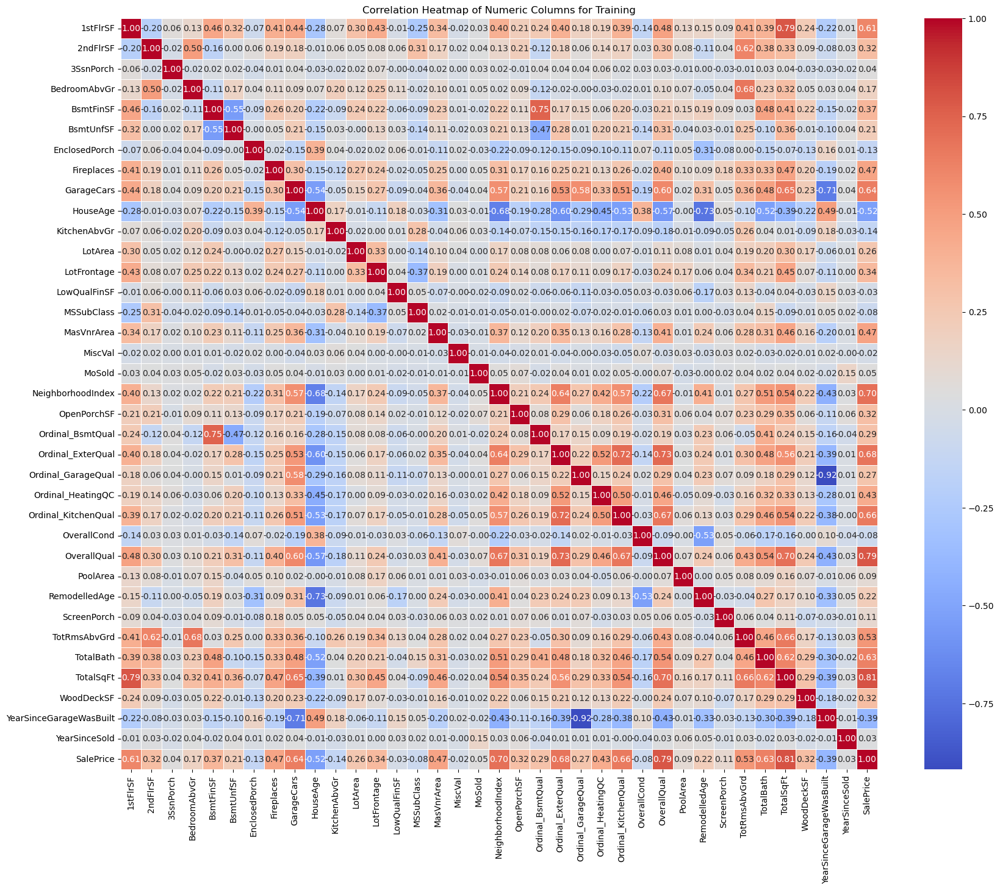

In [828]:
corr_matrix = train[model_columns + ['SalePrice']].corr()

# Create the heatmap
plt.figure(figsize=(20, 16))  # Adjust figure size as needed
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Numeric Columns for Training')
plt.show()


## Notice that some of the columns are highly correlated and some may even need to be removed from the model
**Approach** Use a combination of correlation value between feature pairs and low correlation with SalePrice and Variance Inflation Factor to select features for modelling.

In [947]:
def find_high_correlation_pairs(df, threshold=0.8, min_target_cor_thresh = 0.075, target='SalePrice'):
    """
    Finds pairs of columns with correlation values greater than a threshold.

    Args:
        df: pandas DataFrame.
        threshold: Correlation threshold (default: 0.8).

    Returns:
        list: List of tuples, where each tuple contains (column1, column2, correlation).
    """
    correlation_matrix = df.corr().abs()  # Absolute correlation to find both positive and negative strong correlations.
    high_correlation_pairs = []
    low_correlation_with_sale = set()

    for column in correlation_matrix.columns:
        for index in correlation_matrix.index:
            correlation_value = abs(correlation_matrix.loc[index, column])
            if (column != index and correlation_value > threshold and target not in [index, column]):
                high_correlation_pairs.append(list(sorted([index, column])) + [correlation_value])
            elif (target in [column, index] and correlation_value < min_target_cor_thresh):
                low_correlation_with_sale.add(column if column != target else index)
    high_cors = pd.DataFrame(high_correlation_pairs, columns = 'Column1 Column2 Cor'.split())
    high_cors.drop_duplicates(inplace = True, subset='Column1	Column2	Cor'.split())
    high_cors.sort_values(by = ['Cor'], ascending = False, inplace = True)
    low_correlation_pairs = sorted(low_correlation_with_sale)
    print(f"Low Correlation Pairs {low_correlation_pairs}")
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    def get_vif(column, vif_data):
        return vif_data[vif_data.feature == column]['VIF'].values.tolist()[0]
    high_cors['VIF1'] = high_cors.Column1.apply(lambda column: get_vif(column, vif_data))
    high_cors['VIF2'] = high_cors.Column2.apply(lambda column: get_vif(column, vif_data))
    
    
    high_cors['Cor1WithSale'] = high_cors.Column1.apply(lambda column: correlation_matrix.loc[target, column])
    high_cors['Cor2WithSale'] = high_cors.Column2.apply(lambda column: correlation_matrix.loc[target, column])
    return high_cors, sorted(low_correlation_with_sale)

high_corr_pairs, low_correlation_pairs = find_high_correlation_pairs(train[model_columns + ['SalePrice']], threshold=0.7)
high_corr_pairs

Low Correlation Pairs ['3SsnPorch', 'LowQualFinSF', 'MiscVal', 'MoSold', 'YearSinceSold']


,Column1,Column2,Cor,VIF1,VIF2,Cor1WithSale,Cor2WithSale
7,Ordinal_GarageQual,YearSinceGarageWasBuilt,0.918409,109.452646,16.900910,0.273839,0.387229
0,1stFlrSF,TotalSqFt,0.793806,259.511785,1212.044396,0.605852,0.807518
1,BsmtFinSF,Ordinal_BsmtQual,0.747423,75.669276,7.733165,0.366328,0.293325
3,HouseAge,RemodelledAge,0.733896,28.758075,4.663363,0.522897,0.217503
6,Ordinal_ExterQual,OverallQual,0.726278,105.206880,81.668143,0.682639,0.790982
5,Ordinal_ExterQual,Ordinal_KitchenQual,0.716122,105.206880,76.979095,0.682639,0.659600
2,GarageCars,YearSinceGarageWasBuilt,0.706485,40.360746,16.900910,0.640409,0.387229


## Observation from correlated features.
### Low correlations features
- Since the low correlation variables do not repeat themselves, I will just remove them.
- This sets up the following columns for removal `['3SsnPorch', 'LowQualFinSF', 'MiscVal', 'MoSold', 'YearSinceSold']`.


### High correlations features
- **Note** A variance inflation factor of more than 10 is generally an indication of high multicollinearities.
- Based on the correlation value between the SalePrice and the highly correlated values together with Variance Inflation factor, the following variables
- `['YearSinceGarageWasBuilt', 'Ordinal_ExterQual', 'RemodelledAge', 'Ordinal_BsmtQual', '1stFlrSF']`

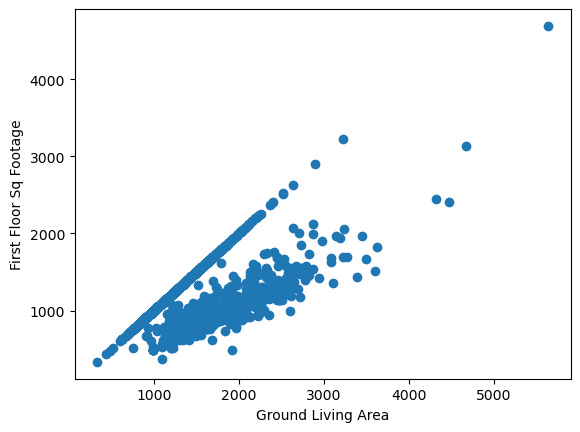

In [563]:
plt.scatter(train['GrLivArea'], train['1stFlrSF'])
plt.xlabel('Ground Living Area')
plt.ylabel('First Floor Sq Footage')
plt.show()

In [990]:
columns_to_remove = ['3SsnPorch', 'LowQualFinSF', 'MiscVal', 'MoSold', 'YearSinceSold', 'YearSinceGarageWasBuilt', 'Ordinal_ExterQual', 'RemodelledAge', 'Ordinal_BsmtQual', '1stFlrSF']
model_columns = [col for col in model_columns if not col in columns_to_remove]

In [992]:
X = train[model_columns]
X1 = test[model_columns]
y = train[['SalePrice']]

In [994]:
len(model_columns), '3SsnPorch' in model_columns

(26, False)

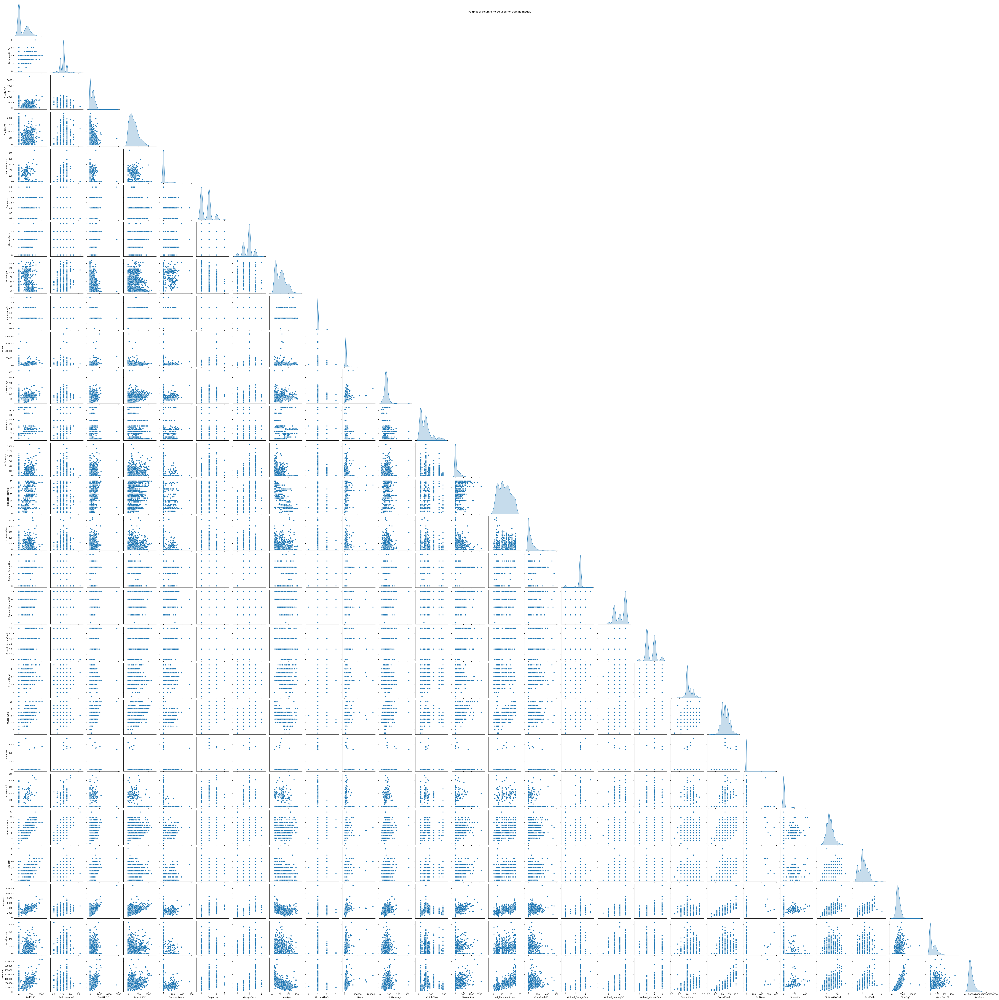

In [996]:
g = sns.pairplot(train[model_columns + ['SalePrice']], corner=True, diag_kind='kde')
# Set the title of the plot
g.fig.suptitle(f"Pairplot of columns to be used for training model.")
g.fig.savefig(f"{data_path}Pairplot.png")
plt.show()

## Divide the dataset into training and test sets.
Sample 80% of the data for a training set stratifying on the `Sex` dummy column.

In [1051]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=622, stratify=X['OverallQual'.split()])

## Scale the dataset.
Use standard scaler to scale the dataset before building model.

In [1053]:
reg_scaler = StandardScaler(with_mean=True,  with_std=True)

X_train_scaled = reg_scaler.fit_transform(X_train)
X_test_scaled = reg_scaler.transform(X_test)

In [1020]:
linreg = LinearRegression()
linreg.fit(X_train_scaled, y_train)
linreg_preds = linreg.predict(X_test_scaled)

## Set function for computing Metrics on test and training set.

In [1023]:
def adjusted_r2(y_true, y_pred, n, p):
    """
    Calculates the adjusted R-squared value.

    Parameters:
        y_true: True target values.
        y_pred: Predicted target values.
        n: Number of data points.
        p: Number of independent variables.
    """
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * ((n - 1) / (n - p - 1))

def compute_and_print_mean_errors(y,yhat, params, title=None): 
    n_records = len(y)
    ME=np.round(np.mean(y-yhat),3) 
    MPE=np.round(np.mean((y-yhat)/y),3) 
    myMAE=np.round(mean_absolute_error(y,yhat),3) 
    myMSE=np.round(mean_squared_error(y,yhat),3) 
    myMAPE=np.round(mean_absolute_percentage_error(y,yhat),3)
    myRMSLogError = np.sqrt(np.average(np.square(np.log(1+np.abs(yhat)) - np.abs(1 + np.log(y)))))
    myR2 = r2_score(y, yhat)
    adjR2 = 1 - (1 - myR2) * ((n_records - 1) / (n_records - params - 1))
    if title:
        l = len(title) + 1
        print(f'\n{title}')
        print('-'*l)
    print("\n","ME:", np.round(ME,3),"\n","MPE:",MPE,"\n", "MAE:",  myMAE,"\n", "MSE:", myMSE,"\n","MAPE:",myMAPE,"\n myRMSLogError:", myRMSLogError,"\n R2:", myR2,"\n adjR2:", adjR2)
    return [ME, MPE, myMAE, myMSE, myMAPE, myRMSLogError, myR2, adjR2]

In [1025]:
compute_and_print_mean_errors(y_test, linreg_preds, params=linreg.n_features_in_-1)


 ME: -288.282 
 MPE: -0.011 
 MAE: 19613.733 
 MSE: 871724777.066 
 MAPE: 0.115 
 myRMSLogError: 1.0174478440945274 
 R2: 0.8620231488239363 
 adjR2: 0.8490553996532536


[-288.282,
 -0.011,
 19613.733,
 871724777.066,
 0.115,
 1.0174478440945274,
 0.8620231488239363,
 0.8490553996532536]

In [1290]:
#valila_linreg_predictions = np.ravel(linreg.predict(reg_scaler.transform(X1)))
linreg_preds_df = pd.DataFrame({"Id": test.Id, "SalePrice": valila_linreg_predictions})
linreg_preds_df.to_csv(f"{data_path}PredictionsWithLinearRegressionNoPolynomialTers.csv", index = False)

linreg_preds_df.head()

,Id,SalePrice
0,1461,131656.118274
1,1462,169262.599337
2,1463,170587.772392
3,1464,204830.381719
4,1465,214434.069413


In [1037]:
X_train_scaled.shape, X_test_scaled.shape

((1168, 26), (292, 26))

In [1055]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=622, stratify=X['OverallQual'.split()])
X_train_scaled = reg_scaler.transform(X_train)
X_test_scaled = reg_scaler.transform(X_test)

### Linear Regression with Polynomial Interactions

In [1057]:
results = {}
for degree in range(1,4):
    
    poly = PolynomialFeatures(degree = degree, interaction_only=True, include_bias=True)
    print(X_train_scaled.shape)
    X_train1 = poly.fit_transform(X_train_scaled)
    X_test1 = poly.transform(X_test_scaled)
    
    # Fit the linear regression model
    model1 = LinearRegression()
    model1.fit(X_train1, y_train)
    r2 = model1.score(X_test1, y_test)
    params = model1.n_features_in_ - 1
    y_pred_test1 = model1.predict(X_test1)
    print(f'The coefficient of determination is {r2}')
    results[f'Polynomial(degree = {degree})'] = compute_and_print_mean_errors(y_test, y_pred_test1, params)


    poly2 = PolynomialFeatures(degree = degree, interaction_only=True, include_bias=True)
    X_train2 = poly2.fit_transform(X_train_scaled)
    X_test2 = poly2.transform(X_test_scaled)
    
    # Fit the linear regression model
    model2 = LinearRegression()
    model2.fit(X_train2, y_train)
    r2 = model2.score(X_test2, y_test)
    params2 = model2.n_features_in_ - 1
    y_pred_test2 = model2.predict(X_test2)
    print(f'The coefficient of determination is {r2}')
    results[f'Polynomial(degree = {degree})'] = compute_and_print_mean_errors(y_test, y_pred_test2, params2)


(1022, 26)
The coefficient of determination is 0.8272255180124766

 ME: 845.268 
 MPE: -0.004 
 MAE: 21011.751 
 MSE: 1096536358.631 
 MAPE: 0.124 
 myRMSLogError: 1.026231627399106 
 R2: 0.8272255180124766 
 adjR2: 0.8162957454293243
The coefficient of determination is 0.8272255180124766

 ME: 845.268 
 MPE: -0.004 
 MAE: 21011.751 
 MSE: 1096536358.631 
 MAPE: 0.124 
 myRMSLogError: 1.026231627399106 
 R2: 0.8272255180124766 
 adjR2: 0.8162957454293243
(1022, 26)
The coefficient of determination is -1.9003092998175493e+18

 ME: -5247431886083.2 
 MPE: -39189185.12 
 MAE: 5247431907939.809 
 MSE: 1.2060567138876143e+28 
 MAPE: 39189185.24 
 myRMSLogError: 1.4987061956647236 
 R2: -1.9003092998175493e+18 
 adjR2: -9.656222837444989e+18
The coefficient of determination is -1.9003092998175493e+18

 ME: -5247431886083.2 
 MPE: -39189185.12 
 MAE: 5247431907939.809 
 MSE: 1.2060567138876143e+28 
 MAPE: 39189185.24 
 myRMSLogError: 1.4987061956647236 
 R2: -1.9003092998175493e+18 
 adjR2: -

### Data size limits
Note that because of limits on the dataset size (small number of rows), adding more features make it difficult to train the model.
You can see the effect of this with the R2 on the test set increasing.

## Computation limits prevent performing polynomial regression with all the features 
Since I run out of memory to perform the linear regression with polynomial features for the entier dataset, I switch to using PCA to get a certain amount of variation from the data and use it for training.

## Principal Component for Regression.

To use principal components for Regression, I will follow the following steps:
- standardize the data.
- Use Grid search to find the best number of principal components.
- Fit a model based on the optimal number of components determined in the previous step.

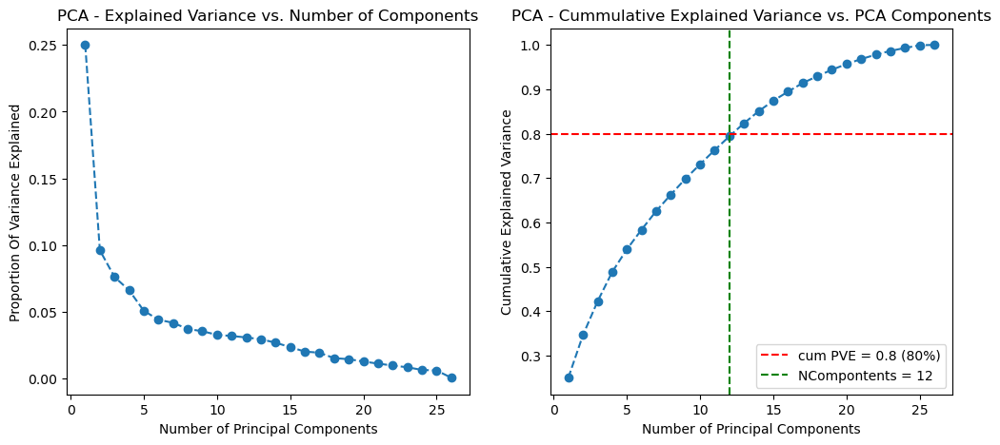

In [1067]:
# Perform PCA
pca = PCA() 
pca_data = pca.fit_transform(reg_scaler.transform(X))

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance.cumsum()

# Create the plot
ig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
axes[0].set_xlabel("Number of Principal Components")
axes[0].set_ylabel("Proportion Of Variance Explained")
axes[0].set_title("PCA - Explained Variance vs. Number of Components")

n_components = len([val for val in cumulative_explained_variance if val<0.8])
axes[1].plot(range(1, len(explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
axes[1].axhline(y=0.80, color='r', linestyle='--', label='cum PVE = 0.8 (80%)')
axes[1].axvline(x=n_components, color='g', linestyle='--', label=f'NCompontents = {n_components}')
axes[1].set_xlabel("Number of Principal Components")
axes[1].set_ylabel("Cumulative Explained Variance")
axes[1].set_title("PCA - Cummulative Explained Variance vs. PCA Components")
axes[1].legend(loc='lower right')



## Choosing the optimal Number of components.
The graph of Explained Variance vs Number Of Principal components does not show a crear point from which the addition of more components results in a significant fall in increment of Explained variation.

Choosing 80% will capture most of the variation in the data.

In [1069]:
pca = PCA(n_components=12)
linreg = LinearRegression()

pipe = Pipeline([('pca', pca),
                 ('linreg', linreg)])
pipe.fit(reg_scaler.transform(X), y)
pipe.named_steps['linreg'].coef_

array([[27526.60612834,  -442.69224223,  2613.36411659, -1452.45681312,
         4944.58872424, -4356.93658143,  4860.93560534,  1947.67885566,
         6309.62322247, -7282.58983314,  2198.15367832,  1996.19017909]])

In [1071]:
param_grid = {'pca__n_components': range(1, X.shape[1])}
K=10
kfold = KFold(K,
                  random_state=0,
                  shuffle=True)
grid = GridSearchCV(pipe,
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
grid.fit(reg_scaler.transform(X), y)


GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA(n_components=12)),
                                       ('linreg', LinearRegression())]),
             param_grid={'pca__n_components': range(1, 26)},
             scoring='neg_mean_squared_error')

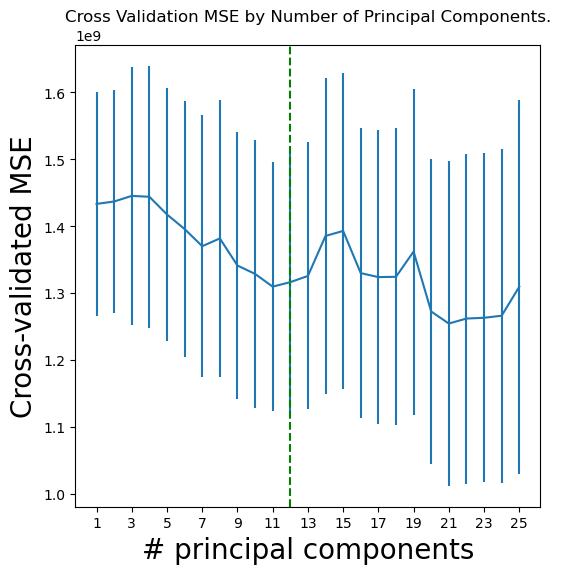

In [1073]:
pcr_fig, ax = plt.subplots(figsize=(6,6))
n_comp = param_grid['pca__n_components']
ax.errorbar(n_comp,
            -grid.cv_results_['mean_test_score'],
            grid.cv_results_['std_test_score'] / np.sqrt(K))
ax.set_ylabel('Cross-validated MSE', fontsize=20)
ax.set_xlabel('# principal components', fontsize=20)
ax.axvline(x=12, color='g', linestyle='--', label=f'NCompontents = {n_components}')
ax.set_xticks(n_comp[::2])
ax.set_title("Cross Validation MSE by Number of Principal Components.");

## Grid search results of Parameter Search.
The cross validation MSE also indicates that using 16 components will capture the trend in the data.

In [1076]:
pipe.named_steps['pca'].explained_variance_ratio_.cumsum()

array([0.25001795, 0.34616809, 0.42236016, 0.48854653, 0.539426  ,
       0.58363797, 0.62548692, 0.6627443 , 0.69830084, 0.73114809,
       0.76314303, 0.79403437])

In [1078]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=622, stratify=X['OverallQual'.split()])

In [1084]:
results = {}

X_train_pca =pipe.named_steps['pca'].transform(X_train)
X_test_pca = pipe.named_steps['pca'].transform(X_test)
for degree in range(1,4):
    
    poly1 = PolynomialFeatures(degree = degree, interaction_only=False, include_bias=True)

    X_train1 = poly1.fit_transform(X_train_pca)
    X_test1 = poly1.transform(X_test_pca)
    
    if X_test1.shape[1] < X_test_pca.shape[0]:
    
        # Fit the linear regression model
        model1 = LinearRegression()
        model1.fit(X_train1, y_train)
        r2 = model1.score(X_test1, y_test)
        params = model1.n_features_in_ - 1
        y_pred_test1 = model1.predict(X_test1)
        print(f'The coefficient of determination is {r2}')
        results[f'Polynomial(degree = {degree})'] = compute_and_print_mean_errors(y_test, y_pred_test1, params)
    else:
        print(f'breaking at degree = {degree}')
        break

    poly2 = PolynomialFeatures(degree = degree, interaction_only=True, include_bias=True)
    X_train2 = poly2.fit_transform(X_train1)
    X_test2 = poly2.transform(X_test1)
    if X_test1.shape[1] < X_test_pca.shape[0]:
        # Fit the linear regression model
        model2 = LinearRegression()
        model2.fit(X_train2, y_train)
        r2 = model2.score(X_test2, y_test)
        params2 = model2.n_features_in_ - 1
        y_pred_test2 = model2.predict(X_test2)
        print(f'The coefficient of determination is {r2}')
        results[f'Polynomial(degree = {degree}+InteractionsOnly)'] = compute_and_print_mean_errors(y_test, y_pred_test2, params2)
    else:
        print(f'breaking at degree = {degree}')
        break

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


The coefficient of determination is 0.7342898294590094

 ME: 1324.119 
 MPE: -0.017 
 MAE: 25878.164 
 MSE: 1686365136.244 
 MAPE: 0.148 
 myRMSLogError: 1.027183619604378 
 R2: 0.7342898294590094 
 adjR2: 0.7267874246437345
The coefficient of determination is 0.7342898294590119

 ME: 1324.119 
 MPE: -0.017 
 MAE: 25878.164 
 MSE: 1686365136.244 
 MAPE: 0.148 
 myRMSLogError: 1.0271836196043769 
 R2: 0.7342898294590119 
 adjR2: 0.7261430553622363
The coefficient of determination is 0.5741172432073185

 ME: 894.836 
 MPE: -0.018 
 MAE: 23391.773 
 MSE: 2702921878.076 
 MAPE: 0.136 
 myRMSLogError: 1.0136996388853958 
 R2: 0.5741172432073185 
 adjR2: 0.46365773856368353
The coefficient of determination is -40830.91982914989

 ME: -551978.741 
 MPE: -3.386 
 MAE: 3075716.597 
 MSE: 259145240491088.25 
 MAPE: 13.714 
 myRMSLogError: 1.6355407260934784 
 R2: -40830.91982914989 
 adjR2: 4760.548937140171
breaking at degree = 3


In [1086]:
pd.DataFrame.from_dict(results, orient='index', columns = 'ME, MPE, myMAE, myMSE, myMAPE, myRMSLogError, myR2, adjR2'.split(', '))

,ME,MPE,myMAE,myMSE,myMAPE,myRMSLogError,myR2,adjR2
Polynomial(degree = 1),1324.119,-0.017,25878.164,1.686365e+09,0.148,1.027184,0.734290,0.726787
Polynomial(degree = 1+InteractionsOnly),1324.119,-0.017,25878.164,1.686365e+09,0.148,1.027184,0.734290,0.726143
Polynomial(degree = 2),894.836,-0.018,23391.773,2.702922e+09,0.136,1.013700,0.574117,0.463658
Polynomial(degree = 2+InteractionsOnly),-551978.741,-3.386,3075716.597,2.591452e+14,13.714,1.635541,-40830.919829,4760.548937


### Polynomial of Degree 2 is constraint by the amount of data we have.
Using Polynomial regression may fit the situation but we are constrained by the amount of data available for training the model.

### Available options.
- 1) I could proceed to training the polynomial models on the dataset without having to split it into test and training sets but this will present challenges to evaluating the model.
- 2) Use Lasso feature importance to choose features. I persue this second option below.

### Using Lasso feature importance to select features.

                Feature    Importance
0             TotalSqFt  31974.128478
1           OverallQual  17905.871802
2     NeighborhoodIndex  14438.279528
3             BsmtUnfSF  10406.594978
4          TotRmsAbvGrd   8744.057879
5   Ordinal_KitchenQual   7844.337337
6            MSSubClass   6485.657164
7          BedroomAbvGr   6048.930377
8    Ordinal_GarageQual   5512.839505
9             BsmtFinSF   5173.410867
10          OverallCond   4933.594199
11           MasVnrArea   4874.740461
12           GarageCars   4462.349099
13            TotalBath   3617.987263
14              LotArea   3543.081098
15           WoodDeckSF   3115.370642
16          ScreenPorch   2906.268448
17           Fireplaces   2818.501371
18         KitchenAbvGr   2556.562772
19          LotFrontage   2324.224367
20             HouseAge   2052.609190
21    Ordinal_HeatingQC   1531.600144
22             2ndFlrSF   1325.696410
23          OpenPorchSF    199.177435
24             PoolArea    195.545762
25        En

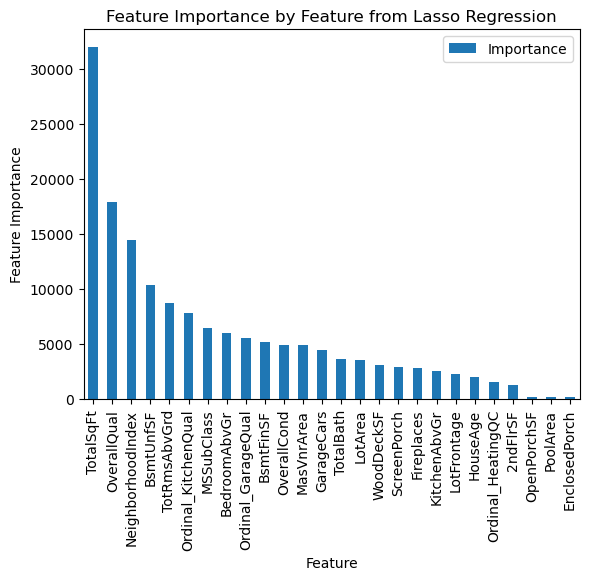

In [1136]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=622, stratify=X['OverallQual'.split()])
def lasso_feature_importance(X, y, alpha=0.01):
    """
    Trains a Lasso regression model and returns feature importance.

    Args:
        X: Features (pandas DataFrame or NumPy array).
        y: Target variable (pandas Series or NumPy array).
        alpha: Regularization strength (default: 0.01).

    Returns:
        pandas Series: Feature importance (absolute coefficients).
    """
    model = Lasso(alpha=alpha)
    model.fit(X, y)
    feature_importance = pd.Series(abs(model.coef_), index=X.columns)
    return feature_importance.sort_values(ascending=False)

sc = StandardScaler()
scaled = sc.fit_transform(X)
lasso_data = pd.DataFrame(scaled, columns = X.columns)
feature_importance = lasso_feature_importance(lasso_data, y)
feature_importance = pd.DataFrame(feature_importance).reset_index(drop= False)
feature_importance.columns = 'Feature Importance'.split()
print(feature_importance)
feature_importance.plot(x = 'Feature', y='Importance', kind='bar', title = 'Feature Importance by Feature from Lasso Regression')
plt.ylabel('Feature Importance')
plt.show()

## Select features that contribute up to 80% of the importance

In [1141]:

def calculate_cumulative_importance(feature_importance_df):
    """
    Calculates cumulative importance for a feature importance DataFrame.

    Args:
        feature_importance_df: pandas DataFrame with 'Feature' and 'Importance' columns,
                                sorted by 'Importance' in descending order.

    Returns:
        pandas DataFrame: DataFrame with 'Feature', 'Importance', and 'Cumulative Importance' columns.
    """

    total_importance = feature_importance_df['Importance'].sum()
    cumulative_importance = feature_importance_df['Importance'].cumsum() / total_importance

    feature_importance_df['CumulativeImportance'] = cumulative_importance
    return feature_importance_df

# Calculate cumulative importance:
feature_importance_with_cumulative = calculate_cumulative_importance(feature_importance)
print(feature_importance_with_cumulative)

                Feature    Importance  CumulativeImportance
0             TotalSqFt  31974.128478              0.206058
1           OverallQual  17905.871802              0.321452
2     NeighborhoodIndex  14438.279528              0.414500
3             BsmtUnfSF  10406.594978              0.481565
4          TotRmsAbvGrd   8744.057879              0.537917
5   Ordinal_KitchenQual   7844.337337              0.588470
6            MSSubClass   6485.657164              0.630266
7          BedroomAbvGr   6048.930377              0.669249
8    Ordinal_GarageQual   5512.839505              0.704776
9             BsmtFinSF   5173.410867              0.738117
10          OverallCond   4933.594199              0.769911
11           MasVnrArea   4874.740461              0.801327
12           GarageCars   4462.349099              0.830084
13            TotalBath   3617.987263              0.853400
14              LotArea   3543.081098              0.876234
15           WoodDeckSF   3115.370642   

In [3099]:
feature_importance_with_cumulative

,Feature,Importance,CumulativeImportance
0,TotalSqFt,31974.128478,0.206058
1,OverallQual,17905.871802,0.321452
2,NeighborhoodIndex,14438.279528,0.414500
3,BsmtUnfSF,10406.594978,0.481565
4,TotRmsAbvGrd,8744.057879,0.537917
5,Ordinal_KitchenQual,7844.337337,0.588470
6,MSSubClass,6485.657164,0.630266
7,BedroomAbvGr,6048.930377,0.669249
8,Ordinal_GarageQual,5512.839505,0.704776
9,BsmtFinSF,5173.410867,0.738117


In [1145]:
param_grid_lasso = {"alpha": [1, 10]}
grid_lasso = GridSearchCV(Lasso(), param_grid_lasso, scoring="neg_root_mean_squared_error", cv=5)
grid_lasso.fit(scaled, y)
best_lasso = grid_lasso.best_estimator_

lasso_scores = cross_val_score(best_lasso, scaled, y, scoring="neg_root_mean_squared_error", cv=5)
lasso_rmse = -np.mean(lasso_scores)
print(f"[Lasso] CV RMSE: {lasso_rmse:.4f}")

[Lasso] CV RMSE: 33961.2701


In [1151]:
best_lasso.coef_
feature_importance = pd.Series(abs(best_lasso.coef_), index=X.columns)
feature_importance.sort_values(ascending=False, inplace = True)
feature_importance

TotalSqFt              31557.176023
OverallQual            17911.946515
NeighborhoodIndex      14448.357069
BsmtUnfSF              10070.743832
TotRmsAbvGrd            8765.313781
Ordinal_KitchenQual     7858.993974
MSSubClass              6457.567468
BedroomAbvGr            6017.589582
Ordinal_GarageQual      5472.408186
OverallCond             4908.751551
MasVnrArea              4872.451915
BsmtFinSF               4799.180706
GarageCars              4520.004276
TotalBath               3614.329937
LotArea                 3530.193951
WoodDeckSF              3115.139717
ScreenPorch             2890.807402
Fireplaces              2822.935648
KitchenAbvGr            2542.311988
LotFrontage             2287.173902
HouseAge                1989.583655
Ordinal_HeatingQC       1531.951734
2ndFlrSF                1452.098223
PoolArea                 183.471075
OpenPorchSF              177.476826
EnclosedPorch            158.299144
dtype: float64

In [1210]:
all_features = feature_importance_with_cumulative['Feature'].tolist()
current_features = []
results = []
cv = 5
best_adjusted_r2 = -np.inf  # Initialize outside the loop

while len(current_features) < len(all_features):
    temp_best = []
    for feature in all_features:
        if feature not in current_features:
            current_features_for_use = current_features + [feature]
            X_current = lasso_data[current_features_for_use]

            model = LinearRegression()
            scores = cross_val_score(model, X_current, y, scoring='r2', cv=cv)
            r2 = np.mean(scores)
            n = len(X_current)
            p = len(current_features_for_use)
            adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

            if adjusted_r2 > best_adjusted_r2:
                best_adjusted_r2 = adjusted_r2
                temp_best = [current_features_for_use, best_adjusted_r2, len(current_features_for_use)] #Corrected the best feature length.

    if temp_best:  # Check if any improvement was made
        current_features = temp_best[0]
        results.append(temp_best)
        print(f"Features: {current_features}, Adjusted R-squared: {best_adjusted_r2:.4f}") #Corrected the print statement.
    else:
        break  # Stop if no improvement was found

print(f"\nBest Features: {current_features}") #Corrected best features.
print(f"Best Adjusted R-squared: {best_adjusted_r2:.4f}")

Features: ['TotalSqFt'], Adjusted R-squared: 0.6420
Features: ['TotalSqFt', 'OverallQual'], Adjusted R-squared: 0.7452
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex'], Adjusted R-squared: 0.7759
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF'], Adjusted R-squared: 0.7862
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'Ordinal_KitchenQual'], Adjusted R-squared: 0.7948
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'Ordinal_KitchenQual', 'MSSubClass'], Adjusted R-squared: 0.7981
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'Ordinal_KitchenQual', 'MSSubClass', 'TotRmsAbvGrd'], Adjusted R-squared: 0.8020
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'Ordinal_KitchenQual', 'MSSubClass', 'TotRmsAbvGrd', 'Fireplaces'], Adjusted R-squared: 0.8042
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'Ordinal_KitchenQual', 'MSSubClass'

In [1218]:
result = pd.DataFrame(results, columns = 'Columns AdjustedR2 NFeatures'.split())
result['Columns'] = result.Columns.apply(lambda x: ', '.join(x))
result

,Columns,AdjustedR2,NFeatures
0,TotalSqFt,0.641966,1
1,"TotalSqFt, OverallQual",0.745180,2
2,"TotalSqFt, OverallQual, NeighborhoodIndex",0.775883,3
3,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.786228,4
4,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.794768,5
5,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.798051,6
6,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.802049,7
7,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.804173,8
8,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.805628,9
9,"TotalSqFt, OverallQual, NeighborhoodIndex, Bsm...",0.806917,10


In [1182]:
def incremental_feature_selection(df, y, feature_importance_df, cv=5):
    """
    Performs incremental feature selection using adjusted R-squared.

    Args:
        df: pandas DataFrame.
        feature_importance_df: DataFrame with 'Feature' and 'Importance' columns,
                                sorted by 'Importance' in descending order.
        cv: Number of cross-validation folds.

    Returns:
        tuple: Best features and best adjusted R-squared.
    """

    features = feature_importance_df['Feature'].tolist()
    best_features = features[:1]
    best_adjusted_r2 = -np.inf
    best_features_history = [best_features]
    best_r2_history = [-np.inf]

    X_base = df[best_features]

    model = LinearRegression()
    scores = cross_val_score(model, X_base, y, scoring='r2', cv=cv)
    r2 = np.mean(scores)
    n = len(df)
    p = len(best_features)
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

    best_adjusted_r2 = adjusted_r2
    best_r2_history[0] = best_adjusted_r2
    results = [','.join(best_features), best_adjusted_r2, len(best_features)]
 
    for i in range(1, len(features)):
        current_features = features[:i + 1]
        X_current = df[current_features]

        model = LinearRegression()
        scores = cross_val_score(model, X_current, y, scoring='r2', cv=cv)
        r2 = np.mean(scores)
        n = len(df)
        p = len(current_features)
        adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

        if adjusted_r2 > best_adjusted_r2:
            best_adjusted_r2 = adjusted_r2
            best_features = current_features
            best_features_history.append(best_features)
            best_r2_history.append(best_adjusted_r2)
            results.append([','.join(best_features), best_adjusted_r2, len(best_features)])
        else:
            # Stopping criterion: Stop if adjusted R-squared does not improve
            break

        print(f"Features: {current_features}, Adjusted R-squared: {adjusted_r2:.4f}")

    print(f"\nBest Features: {best_features}")
    print(f"Best Adjusted R-squared: {best_adjusted_r2:.4f}")

    return best_features, best_adjusted_r2, best_features_history, best_r2_history

best_features, best_adjusted_r2, feature_history, r2_history = incremental_feature_selection(lasso_data, y, feature_importance_with_cumulative)

print("\nFeature Selection History:")
for i in range(len(feature_history)):
    print(f"Iteration {i+1}: Features {feature_history[i]}, Adjusted R-squared {r2_history[i]:.4f}")

Features: ['TotalSqFt', 'OverallQual'], Adjusted R-squared: 0.7452
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex'], Adjusted R-squared: 0.7759
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF'], Adjusted R-squared: 0.7862
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'TotRmsAbvGrd'], Adjusted R-squared: 0.7885
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'TotRmsAbvGrd', 'Ordinal_KitchenQual'], Adjusted R-squared: 0.7977
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'TotRmsAbvGrd', 'Ordinal_KitchenQual', 'MSSubClass'], Adjusted R-squared: 0.8020
Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'TotRmsAbvGrd', 'Ordinal_KitchenQual', 'MSSubClass', 'BedroomAbvGr'], Adjusted R-squared: 0.8026

Best Features: ['TotalSqFt', 'OverallQual', 'NeighborhoodIndex', 'BsmtUnfSF', 'TotRmsAbvGrd', 'Ordinal_KitchenQual', 'MSSubClass', 'BedroomAbvGr']
Best Adjusted R

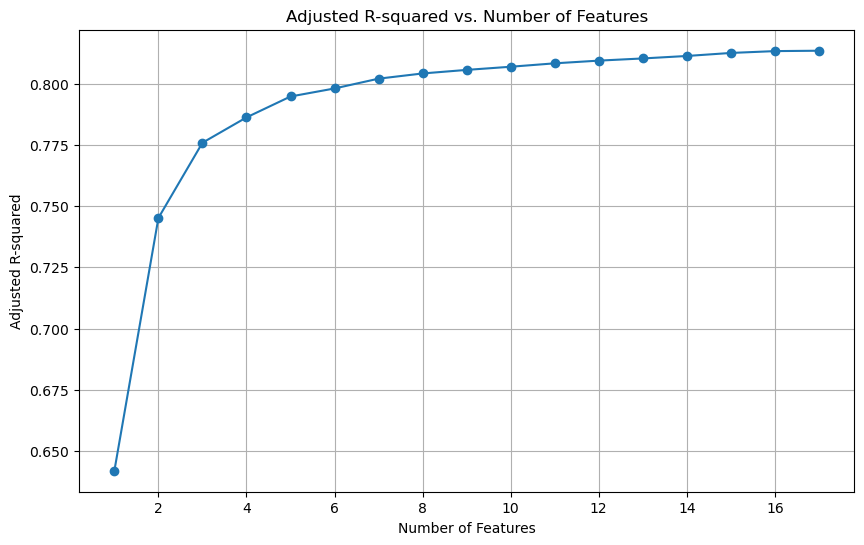

In [1222]:
def plot_adjusted_r2_vs_n_features(result_df):
    """
    Plots Adjusted R-squared vs. Number of Features from a result DataFrame.

    Args:
        result_df: pandas DataFrame with 'AdjustedR2' and 'NFeatures' columns.
    """

    plt.figure(figsize=(10, 6))
    plt.plot(result_df['NFeatures'], result_df['AdjustedR2'], marker='o')
    plt.title('Adjusted R-squared vs. Number of Features')
    plt.xlabel('Number of Features')
    plt.ylabel('Adjusted R-squared')
    plt.grid(True)
    plt.show()

# Call the plotting function:
plot_adjusted_r2_vs_n_features(result)

### Optimal Number of Features
Note that from 6 features onwards

In [1232]:
optimal_features = result.Columns.values.tolist()[5]
print(optimal_features)

TotalSqFt, OverallQual, NeighborhoodIndex, BsmtUnfSF, Ordinal_KitchenQual, MSSubClass


In [1246]:
X_train, X_test, y_train, y_test = train_test_split(lasso_data[optimal_features.split(', ')], y, test_size=0.30, random_state=622, stratify=X['OverallQual'.split()])

results = {}
for degree in range(1,6):
    
    poly = PolynomialFeatures(degree = degree, interaction_only=True, include_bias=True)
    
    X_train1 = poly.fit_transform(X_train)
    X_test1 = poly.transform(X_test)
    
    # Fit the linear regression model
    model1 = LinearRegression()
    model1.fit(X_train1, y_train)
    r2 = model1.score(X_test1, y_test)
    params = model1.n_features_in_ - 1
    y_pred_test1 = model1.predict(X_test1)
    print(f'The coefficient of determination is {r2}')
    results[f'Polynomial(degree = {degree})'] = compute_and_print_mean_errors(y_test, y_pred_test1, params)


The coefficient of determination is 0.8166354936924562

 ME: 1301.585 
 MPE: -0.002 
 MAE: 21784.298 
 MSE: 1163747364.401 
 MAPE: 0.13 
 myRMSLogError: 1.0364217847179413 
 R2: 0.8166354936924562 
 adjR2: 0.8140828555536042
The coefficient of determination is 0.868290724825067

 ME: 753.826 
 MPE: -0.016 
 MAE: 19862.204 
 MSE: 835910531.097 
 MAPE: 0.118 
 myRMSLogError: 1.0094980440086792 
 R2: 0.868290724825067 
 adjR2: 0.8616419392994092
The coefficient of determination is 0.8699197288518011

 ME: 1590.86 
 MPE: -0.006 
 MAE: 18605.953 
 MSE: 825571839.161 
 MAPE: 0.109 
 myRMSLogError: 1.0203379533607217 
 R2: 0.8699197288518011 
 adjR2: 0.8564518219904977
The coefficient of determination is 0.850986457373625

 ME: 564.867 
 MPE: -0.016 
 MAE: 18880.739 
 MSE: 945734378.935 
 MAPE: 0.111 
 myRMSLogError: 1.012089699076661 
 R2: 0.850986457373625 
 adjR2: 0.8290842043891709
The coefficient of determination is 0.8601600350416995

 ME: 1045.855 
 MPE: -0.01 
 MAE: 18485.299 
 MSE: 8

In [1254]:
data = pd.DataFrame.from_dict(results, orient='index', columns = 'ME, MPE, myMAE, myMSE, myMAPE, myRMSLogError, myR2, adjR2'.split(', '))
data

,ME,MPE,myMAE,myMSE,myMAPE,myRMSLogError,myR2,adjR2
Polynomial(degree = 1),1301.585,-0.002,21784.298,1.163747e+09,0.130,1.036422,0.816635,0.814083
Polynomial(degree = 2),753.826,-0.016,19862.204,8.359105e+08,0.118,1.009498,0.868291,0.861642
Polynomial(degree = 3),1590.860,-0.006,18605.953,8.255718e+08,0.109,1.020338,0.869920,0.856452
Polynomial(degree = 4),564.867,-0.016,18880.739,9.457344e+08,0.111,1.012090,0.850986,0.829084
Polynomial(degree = 5),1045.855,-0.010,18485.299,8.875130e+08,0.109,1.010611,0.860160,0.837040


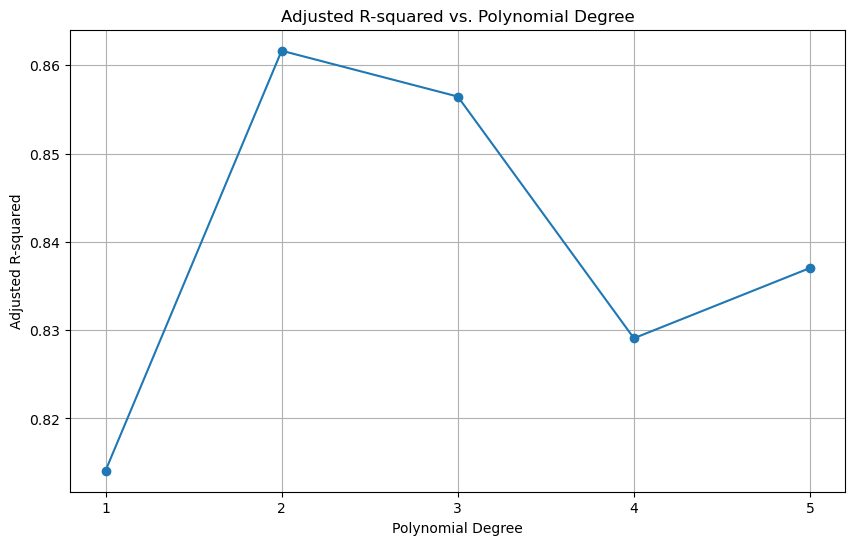

In [1256]:
degrees = [1, 2, 3, 4, 5]
adj_r2 = data.adjR2.values.tolist()
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(degrees, adj_r2, marker='o', linestyle='-')

# Add labels and title
plt.title('Adjusted R-squared vs. Polynomial Degree')

plt.xlabel('Polynomial Degree')
plt.ylabel('Adjusted R-squared')

# Add grid for better readability
plt.grid(True)

# Show the plot
plt.xticks(degrees)  # Ensure x-axis ticks are at the degree values
plt.show()

In [1459]:
poly = PolynomialFeatures(degree = 2, interaction_only=True, include_bias=True)
training_data= poly.fit_transform(lasso_data[optimal_features.split(', ')])


# Fit the linear regression model
polynomial_model = LinearRegression()
polynomial_model.fit(training_data, y)

LinearRegression()

In [1461]:
test_scaled = pd.DataFrame(sc.transform(X1), columns = X1.columns)
test_scaled.head()

,2ndFlrSF,BedroomAbvGr,BsmtFinSF,BsmtUnfSF,EnclosedPorch,Fireplaces,GarageCars,HouseAge,KitchenAbvGr,LotArea,...,Ordinal_HeatingQC,Ordinal_KitchenQual,OverallCond,OverallQual,PoolArea,ScreenPorch,TotRmsAbvGrd,TotalBath,TotalSqFt,WoodDeckSF
0,-0.795163,-1.062465,0.255938,-0.672923,-0.359325,-0.951226,-1.026858,0.340077,-0.211454,0.110763,...,-1.193952,-0.771091,0.381743,-0.795151,-0.068692,1.882709,-0.934130,-1.541932,-0.560748,0.365179
1,-0.795163,0.163779,0.909381,-0.365032,-0.359325,-0.951226,-1.026858,0.439440,-0.211454,0.375850,...,-1.193952,0.735994,0.381743,-0.071836,-0.068692,-0.270208,-0.318683,-0.905095,-0.079100,2.384400
2,0.811239,0.163779,0.632035,-0.974021,-0.359325,0.600495,0.311725,-0.852269,-0.211454,0.332053,...,-0.151386,-0.771091,-0.517200,-0.795151,-0.068692,-0.270208,-0.318683,0.368581,-0.007166,0.939819
3,0.758532,0.163779,0.234926,-0.550672,-0.359325,0.600495,0.311725,-0.885390,-0.211454,-0.054002,...,0.891179,0.735994,0.381743,-0.071836,-0.068692,-0.270208,0.296763,0.368581,-0.047824,2.121024
4,-0.795163,-1.062465,-0.477348,1.018211,-0.359325,-0.951226,0.311725,-0.686666,-0.211454,-0.552407,...,0.891179,0.735994,-0.517200,1.374795,-0.068692,2.313293,-0.934130,-0.268257,0.020983,-0.752176


In [1463]:
polynomial_preds = polynomial_model.predict(poly.transform(test_scaled[optimal_features.split(', ')]))


In [1465]:
train_preds = polynomial_model.predict(training_data)
residuals = (y - train_preds).SalePrice.values
dw_test = durbin_watson(residuals)
print(f"Durbin-Watson statistic: {dw_test}")

Durbin-Watson statistic: 1.9297012883407492


27956.725824745005 83870.17747423501


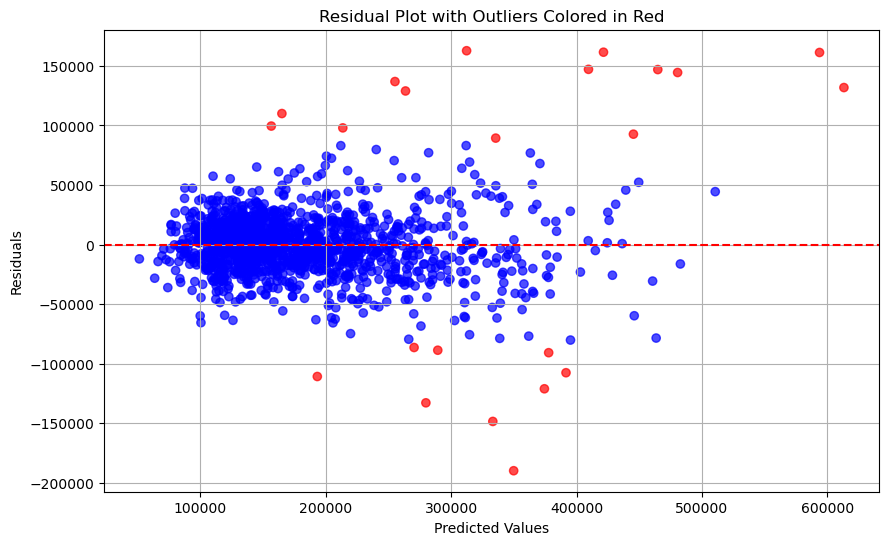

In [1467]:
def plot_residual_plot(y_predicted, y_true, residuals, outlier_threshold = 3):
    """
    Plots a residual plot.

    Args:
        y_predicted: Array of predicted target values.
        residuals: Array of residuals (y_true - y_predicted).
    """
    std_residuals = np.std(residuals)
    threshold_value = outlier_threshold * std_residuals
    print(std_residuals, threshold_value)
    # Identify outliers
    colors = ['red' if np.abs(value) > threshold_value else 'blue' for value in residuals]

    percentile_25 = np.percentile(y_true, 25)
    percentile_75 = np.percentile(y_true, 75)
    iqr = percentile_75 - percentile_25
    lower_bound = percentile_25 - 1.5 * iqr
    upper_bound = percentile_75 + 1.5 * iqr
    outliers = ['red' if (value > upper_bound or value < lower_bound) else 'blue' for value in np.ravel(y_true)]
    plt.figure(figsize=(10, 6))
    plt.scatter(y_predicted, residuals, alpha=0.7, c=colors)  # Scatter plot of residuals vs. predicted values
    plt.axhline(y=0, color='r', linestyle='--')  # Horizontal line at y=0
    plt.title('Residual Plot with Outliers Colored in Red')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.grid(True)
    plt.show()

plot_residual_plot(train_preds, y, residuals)

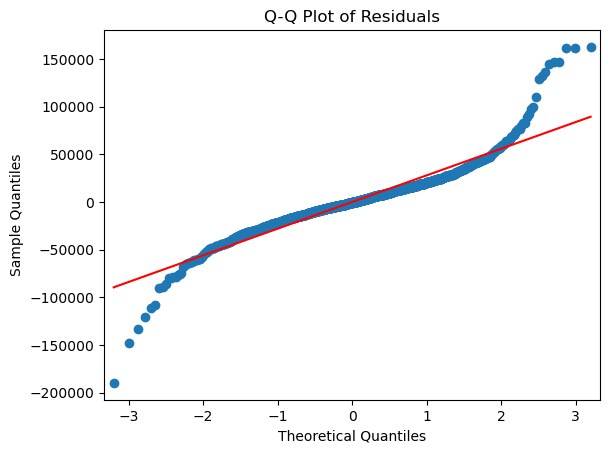

In [1469]:
sm.qqplot(residuals.flatten(), line='s')
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()

In [1474]:
polynomial_preds_data = pd.DataFrame({'Id': test.Id, 'SalePrice': np.ravel(polynomial_preds)})
polynomial_preds_data.head()

,Id,SalePrice
0,1461,135535.740529
1,1462,174304.119689
2,1463,170039.441475
3,1464,179971.155571
4,1465,210771.261785


In [1476]:
polynomial_preds_data.to_csv(f'{data_path}PolynomialPredictionsLinearReg.csv', index = False)

## Interpretation of Model
### Feature Importance

In [1493]:
features_names = poly.get_feature_names_out(optimal_features.split(', '))
features_names = ['Intercept'] + list(features_names)[1:]
features_names

['Intercept',
 'TotalSqFt',
 'OverallQual',
 'NeighborhoodIndex',
 'BsmtUnfSF',
 'Ordinal_KitchenQual',
 'MSSubClass',
 'TotalSqFt OverallQual',
 'TotalSqFt NeighborhoodIndex',
 'TotalSqFt BsmtUnfSF',
 'TotalSqFt Ordinal_KitchenQual',
 'TotalSqFt MSSubClass',
 'OverallQual NeighborhoodIndex',
 'OverallQual BsmtUnfSF',
 'OverallQual Ordinal_KitchenQual',
 'OverallQual MSSubClass',
 'NeighborhoodIndex BsmtUnfSF',
 'NeighborhoodIndex Ordinal_KitchenQual',
 'NeighborhoodIndex MSSubClass',
 'BsmtUnfSF Ordinal_KitchenQual',
 'BsmtUnfSF MSSubClass',
 'Ordinal_KitchenQual MSSubClass']

In [1499]:
polynomial_model.coef_

array([[    0.        , 39428.71969064, 20286.48359034, 14139.73490959,
        -9604.45361289,  7532.07073551, -2039.832204  , -4706.94428568,
        21140.36738683,   -46.12017331,  1748.15289598,  1553.55457684,
         -565.85782415,  4674.66331878,  7772.49276201,  -429.03140139,
        -6207.70577899, -6172.05435731,   826.78622789,  -653.12482475,
          933.30067801, -1932.68156206]])

In [1505]:
feature_importance_poly = pd.DataFrame({'Feature': features_names, "Importance": polynomial_model.coef_[0], "ImportanceAbs": np.abs(polynomial_model.coef_[0])})
feature_importance_poly.sort_values(by = ['ImportanceAbs'], ascending = False, inplace = True)
feature_importance_poly

,Feature,Importance,ImportanceAbs
1,TotalSqFt,39428.719691,39428.719691
8,TotalSqFt NeighborhoodIndex,21140.367387,21140.367387
2,OverallQual,20286.483590,20286.483590
3,NeighborhoodIndex,14139.734910,14139.734910
4,BsmtUnfSF,-9604.453613,9604.453613
14,OverallQual Ordinal_KitchenQual,7772.492762,7772.492762
5,Ordinal_KitchenQual,7532.070736,7532.070736
16,NeighborhoodIndex BsmtUnfSF,-6207.705779,6207.705779
17,NeighborhoodIndex Ordinal_KitchenQual,-6172.054357,6172.054357
7,TotalSqFt OverallQual,-4706.944286,4706.944286


<Figure size 1200x1000 with 0 Axes>

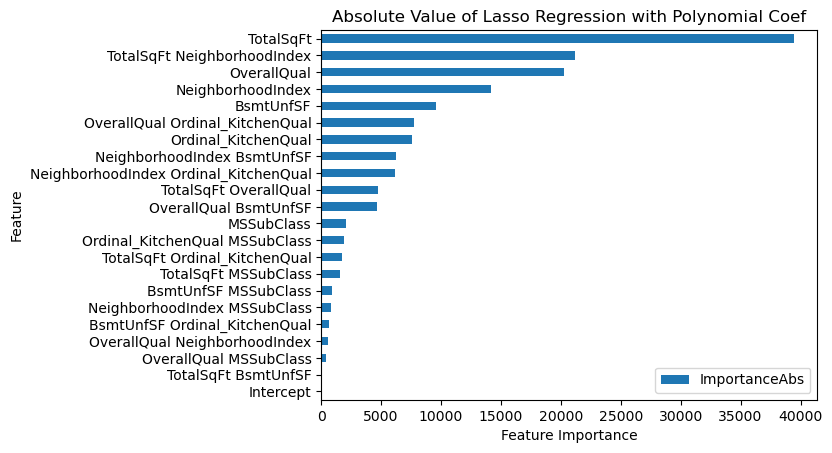

In [1517]:
plt.figure(figsize=(12, 10))
feature_importance_poly.sort_values(by=['ImportanceAbs'], ascending =True).plot(x = 'Feature', y='ImportanceAbs', kind='barh', title = 'Absolute Value of Lasso Regression with Polynomial Coef')
plt.ylabel('Feature')
plt.xlabel('Feature Importance')
plt.legend(loc='lower right')
plt.show()

In [1489]:
X_poly_df = pd.DataFrame(training_data, columns=features_names)
vif_data = pd.DataFrame()
vif_data["Feature"] = X_poly_df.columns
vif_data["VIF"] = [variance_inflation_factor(X_poly_df.values, i) for i in range(len(X_poly_df.columns))]
vif_data.sort_values(by = ['VIF'], ascending = False, inplace = True)
vif_data.head()

,Feature,VIF
10,TotalSqFt Ordinal_KitchenQual,7.230351
7,TotalSqFt OverallQual,6.868404
13,OverallQual BsmtUnfSF,5.172699
12,OverallQual NeighborhoodIndex,4.580126
14,OverallQual Ordinal_KitchenQual,3.919301


<Figure size 1200x1000 with 0 Axes>

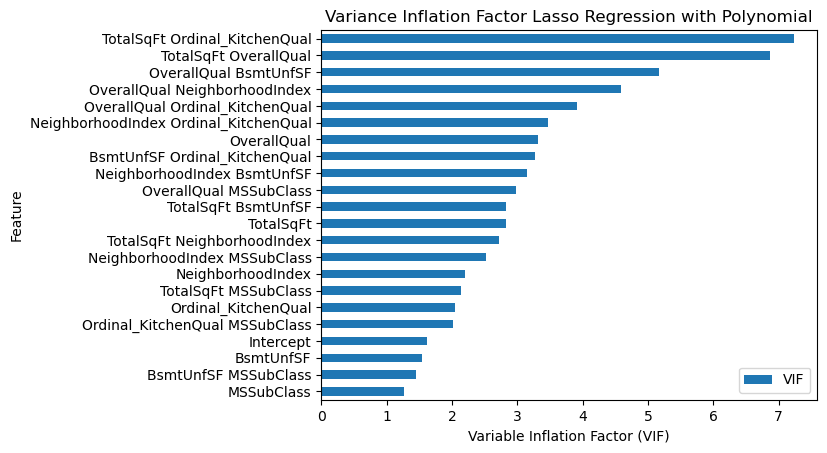

In [1521]:
plt.figure(figsize=(12, 10))
vif_data.sort_values(by=['VIF'], ascending =True).plot(x = 'Feature', y='VIF', kind='barh', title = 'Variance Inflation Factor Lasso Regression with Polynomial')
plt.ylabel('Feature')
plt.xlabel('Variable Inflation Factor (VIF)')
plt.legend(loc='lower right')
plt.show()

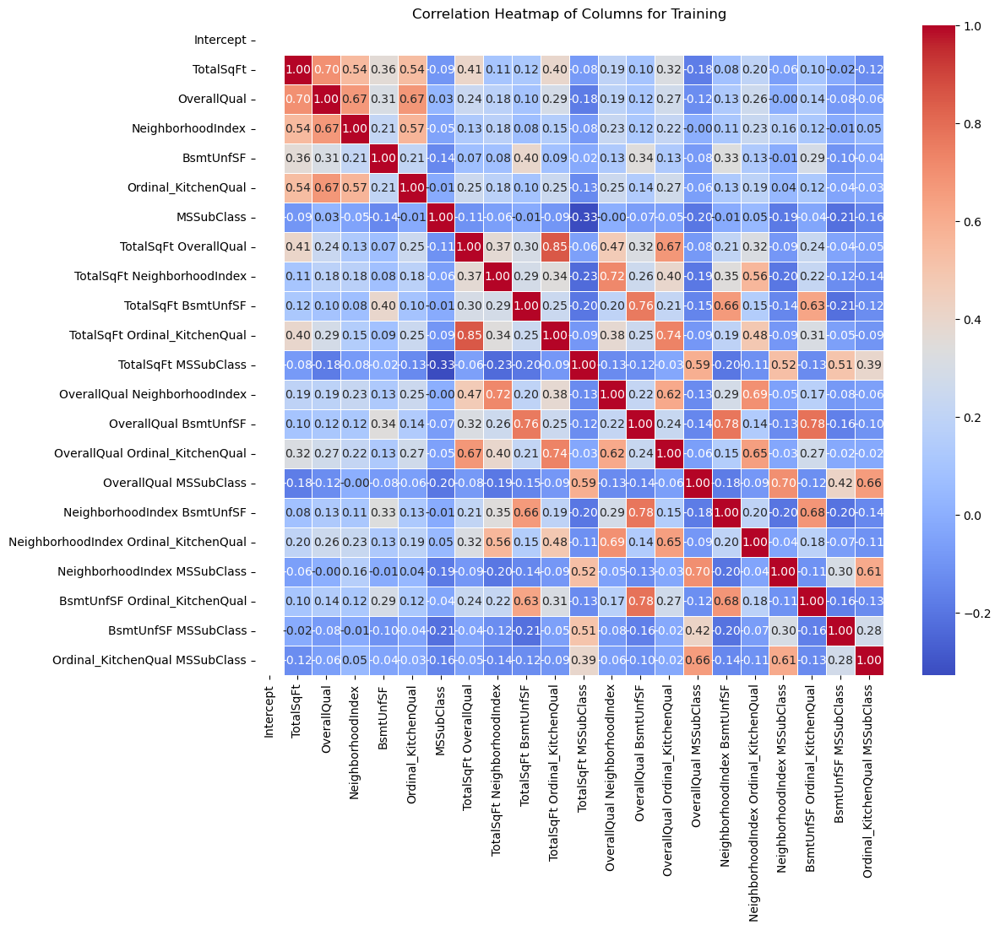

In [1487]:
corr_matrix = X_poly_df.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))  # Adjust figure size as needed
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Columns for Training')
plt.show()

## Investigation of Model Assumptions.
- **Check for multicollinearity**
    The Variable Inflation factor for the dataset shows a score of less than 10 for all the variables in the dataset. Any VIF more than 10 is generally considered problematic.
- **Test for Independence**
    The Durbin-Watson Test for independence produced a test statistic of 1.93 which is very close to 2 - an indication that there is no auto correlation and the features are independent.
- **Normallity of Residuals**
    - **Generally Normal**: The residuals mostly follow the diagonal line, suggesting reasonable normality.
    - **Light Left Tail**: The left tail deviates below the line, indicating a slightly lighter left tail than a perfect normal distribution.
    - **Heavy Right Tail**: The right tail deviates above the line, indicating a slightly heavier right tail.
    - **Outliers Present**: Some points deviate significantly, especially at the tails, suggesting possible outliers.
    - **Central Normality**: The center of the distribution aligns well with the line, indicating good normality in that region.

### Looking forward and improvements.
- **Address Tail Deviations:** The plot shows deviations from normality at both tails. Investigate if transformations of the target or features could improve normality.
- **Investigate Outliers:** The plot highlights potential outliers. Examine these data points to determine if they are errors or genuine data points that need special handling.
    - We might need to remove the outliers or
    - Transform the data so that the outliers become less influencing.
- **Consider Non-Linearity:** While the central portion is good, the tail deviations might indicate uncaptured non-linear relationships. It would be interesting to see what some non parametric models like Random Forest models can perform on the dataset.
- **Heteroscedasticity is Present:**  The residual plot clearly shows heteroscedasticity with the prediction spreading towards the right of the dataset. This may may be influenced by the outliers in the dataset. It needs to be investigated and addressed to improve the reliability and accuracy of your model. Some options for addressing this issue include.
    - **Transform the Target Variable:** Common transformations like taking the logarithm or square root of the target variable (SalePrice in your case) can often stabilize the variance.
    - **Weighted Least Squares (WLS):** WLS is a technique that assigns weights to data points based on their variance. This can give more weight to data points with lower variance and less weight to data points with higher variance.
- **Feature Engineering**: Refine or add features to potentially better capture the underlying patterns and reduce residual deviations. This may also help with the Heteroscedasticity issue.

# QUESTION 1)
Compete in the [Store Sales Time Series Forecasting](https://www.kaggle.com/competitions/store-sales-time-series-forecasting/overview) competition (rolling submissions) on Kaggle.com.  You will build one ETS and one ARIMA  model.  You will submit them for evaluation.  You must interpret your time series models, provide your code, provide evidence of successful submission to Kaggle.com.   Investigate assumptions.  Interpret all of your findings.   

In [1589]:
# data_path = 'Data/StoreSalesTimeSeriesForecasting/'
# metadata_file_path =  f"{data_path}/metadata.txt"
# with open(metadata_file_path, 'w') as metadata_file:
#     for file in os.listdir(data_path):
#         if file.endswith('.csv'):  # Only process CSV files
#             file_path = os.path.join(data_path, file)
#             fn = file.split('.')[0]
#             a,b = list('{}')
#             print(f"{fn} = pd.read_csv(f'{a}data_path{b}{file}', parse_dates= ['date'])")
#             tem = pd.read_csv(file_path)
#             nas = tem.isna().sum().values.sum()
#             meta_data = f"Metadata(filePath={file_path}, columns={tem.columns.tolist()}, numberOfRows={tem.shape[0]}, has_nas={nas > 0})\n"
#             metadata_file.write(meta_data)

#             sample_5_rows = tem.sample(5, replace=False)
#             metadata_file.write(sample_5_rows.to_csv(index=False)) #Write sample rows to the metadata file.
#             metadata_file.write("\n") #Add a new line after each sample.


In [1591]:
holidays_events = pd.read_csv(f'{data_path}holidays_events.csv', parse_dates= ['date'])
oil = pd.read_csv(f'{data_path}oil.csv', parse_dates= ['date'])
sample_submission = pd.read_csv(f'{data_path}sample_submission.csv')
stores = pd.read_csv(f'{data_path}stores.csv')
test = pd.read_csv(f'{data_path}test.csv', parse_dates= ['date'])
train = pd.read_csv(f'{data_path}train.csv', parse_dates= ['date'])
transactions = pd.read_csv(f'{data_path}transactions.csv', parse_dates= ['date'])

In [1593]:
holidays_events.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [1619]:

transactions.date.value_counts()

date
2017-08-15    54
2017-06-02    54
2017-05-21    54
2017-05-22    54
2017-05-23    54
              ..
2016-01-04    14
2014-01-01     2
2017-01-01     1
2015-01-01     1
2013-01-01     1
Name: count, Length: 1682, dtype: int64

In [1609]:
holidays_events.shape

(350, 6)

In [1595]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [1613]:
stores.type.value_counts()

type
D    18
C    15
A     9
B     8
E     4
Name: count, dtype: int64

In [1597]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [1599]:
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [1601]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [1605]:
train.shape, test.shape

((3000888, 6), (28512, 5))

In [1607]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [1621]:
family_sales = (
    train
    .groupby(['family', 'date'])
    .mean() 
    .unstack('family')
    .loc['2017', ['sales', 'onpromotion']]
)
family_sales

sales                                              \
family     AUTOMOTIVE BABY CARE     BEAUTY    BEVERAGES     BOOKS   
date                                                                
2017-01-01   0.092593  0.037037   0.055556    74.222222  0.000000   
2017-01-02  11.481481  0.259259  11.648148  6208.055556  0.481481   
2017-01-03   8.296296  0.296296   7.185185  4507.814815  0.814815   
2017-01-04   6.833333  0.333333   6.888889  3911.833333  0.759259   
2017-01-05   6.333333  0.351852   5.925926  3258.796296  0.407407   
...               ...       ...        ...          ...       ...   
2017-08-11   8.166667  0.129630   6.500000  3502.055556  0.000000   
2017-08-12   7.462963  0.055556   6.833333  3376.259259  0.000000   
2017-08-13   8.907407  0.166667   8.018519  3747.296296  0.018519   
2017-08-14   5.407407  0.166667   6.240741  3237.629630  0.000000   
2017-08-15   6.240741  0.148148   6.277778  3162.462963  0.000000   

                                                                           \
family     BREAD/BAKERY CELEBRATION     CLEANING        DAIRY        DELI   
date                                                                        
2017-01-01     9.084685    0.129630     7.500000    11.518519    3.629167   
2017-01-02   844.836296   14.203704  2233.648148  1545.000000  539.114833   
2017-01-03   665.124111   10.629630  1711.907407  1204.203704  404.300074   
2017-01-04   594.160611   11.185185  1508.037037  1107.796296  309.397685   
2017-01-05   495.511611   12.444444  1241.833333   829.277778  260.776500   
...                 ...         ...          ...          ...         ...   
2017-08-11   522.305296   16.111111  1031.148148   831.648148  345.934963   
2017-08-12   507.473111   15.722222  1072.870370   793.592593  290.553574   
2017-08-13   615.976981   10.074074  1143.648148   928.000000  325.801371   
2017-08-14   518.564019   11.000000  1019.111111   797.222222  271.532241   
2017-08-15   539.966574   11.055556  1082.851852   753.833333  276.582463   

            ... onpromotion                                        \
family      ...   MAGAZINES      MEATS PERSONAL CARE PET SUPPLIES   
date        ...                                                     
2017-01-01  ...         0.0   0.018519      0.111111     0.018519   
2017-01-02  ...         0.0   0.462963     10.592593     0.537037   
2017-01-03  ...         0.0   0.481481      9.722222     0.444444   
2017-01-04  ...         0.0   0.370370     12.037037     0.444444   
2017-01-05  ...         0.0   8.981481      5.666667     0.000000   
...         ...         ...        ...           ...          ...   
2017-08-11  ...         0.0  22.925926      9.000000     0.000000   
2017-08-12  ...         0.0   0.000000      8.703704     0.000000   
2017-08-13  ...         0.0   0.000000      9.240741     0.000000   
2017-08-14  ...         0.0   0.000000      8.722222     0.000000   
2017-08-15  ...         0.0   0.000000      8.814815     0.000000   

                                                                          \
family     PLAYERS AND ELECTRONICS    POULTRY PREPARED FOODS     PRODUCE   
date                                                                       
2017-01-01                0.000000   0.000000       0.037037    0.129630   
2017-01-02                0.000000   0.259259       1.166667    5.629630   
2017-01-03                0.000000   0.388889       1.351852   56.296296   
2017-01-04                0.000000   0.296296       5.444444  101.277778   
2017-01-05                0.000000   0.296296       0.907407    5.018519   
...                            ...        ...            ...         ...   
2017-08-11                0.000000  27.407407       0.537037    6.000000   
2017-08-12                0.018519   0.111111       0.277778    6.000000   
2017-08-13                0.000000   0.185185       0.222222    5.907407   
2017-08-14                0.000000   0.129630       0.148148    6.018519   
2017-08-15     

In [3028]:
train.groupby(by = ['date', 'family']).agg({'sales':'sum'}).reset_index(drop= False)

,date,family,sales
0,2013-01-01,AUTOMOTIVE,0.000000
1,2013-01-01,BABY CARE,0.000000
2,2013-01-01,BEAUTY,2.000000
3,2013-01-01,BEVERAGES,810.000000
4,2013-01-01,BOOKS,0.000000
...,...,...,...
55567,2017-08-15,POULTRY,17586.709986
55568,2017-08-15,PREPARED FOODS,4641.522980
55569,2017-08-15,PRODUCE,125108.971000
55570,2017-08-15,SCHOOL AND OFFICE SUPPLIES,2530.000000


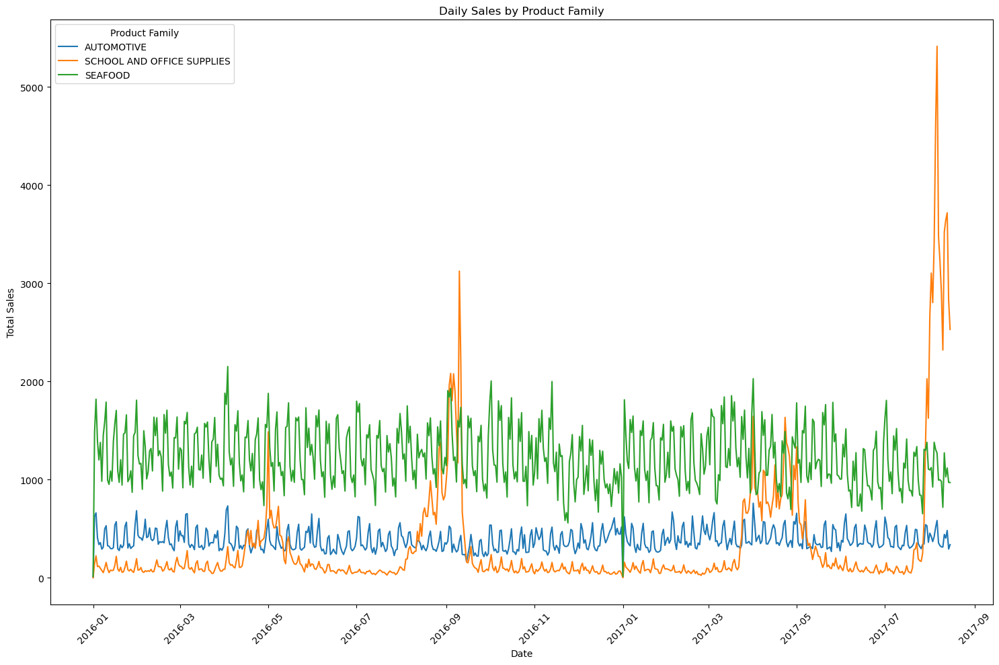

In [3068]:
def visualize_daily_sales_by_product(data, by_products = True):
    """
    Visualizes daily sales for each product family or store name.

    Args:
        data (pd.DataFrame): DataFrame with columns 'date', ('family' or 'store_nbr'), and 'sales'.
    """

    # Convert 'date' to datetime if it's not already
    data['date'] = pd.to_datetime(data['date'])

    # Create a figure and axes
    plt.figure(figsize=(15, 10))

    # Use seaborn to create line plots for each family
    sns.lineplot(data=data, x='date', y='sales', hue='family' if by_products else 'store_nbr')

    # Customize the plot
    title_word = 'Product Family' if by_products else 'Store Number'
    plt.title(f'Daily Sales by {title_word}')
    plt.xlabel('Date')
    plt.ylabel('Total Sales')
    plt.legend(title=title_word, loc='upper left')  # Move legend outside

    # Rotate date labels for better readability
    plt.xticks(rotation=45)

    # Improve layout
    plt.tight_layout()

    # Show the plot
    plt.show()

# Call the visualization function
family_sales = train[(train.date.dt.year.isin([2016,2017])) & (train.family.isin(['AUTOMOTIVE', 'SEAFOOD', 'SCHOOL AND OFFICE SUPPLIES']))].groupby(by = ['date', 'family']).agg({'sales':'sum'}).reset_index(drop= False)
visualize_daily_sales_by_product(family_sales, True)


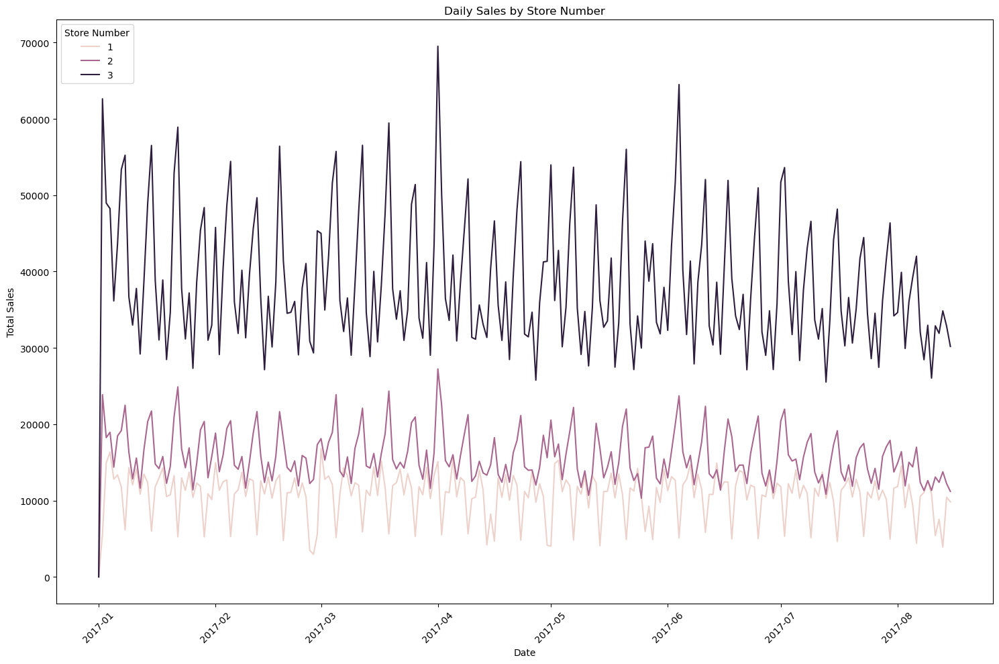

In [3074]:
store_sales = train[(train.date.dt.year.isin([2017])) & (train.store_nbr.isin([1,2,3]))].groupby(by = ['date', 'store_nbr']).agg({'sales':'sum'}).reset_index(drop= False)
visualize_daily_sales_by_product(store_sales, False)

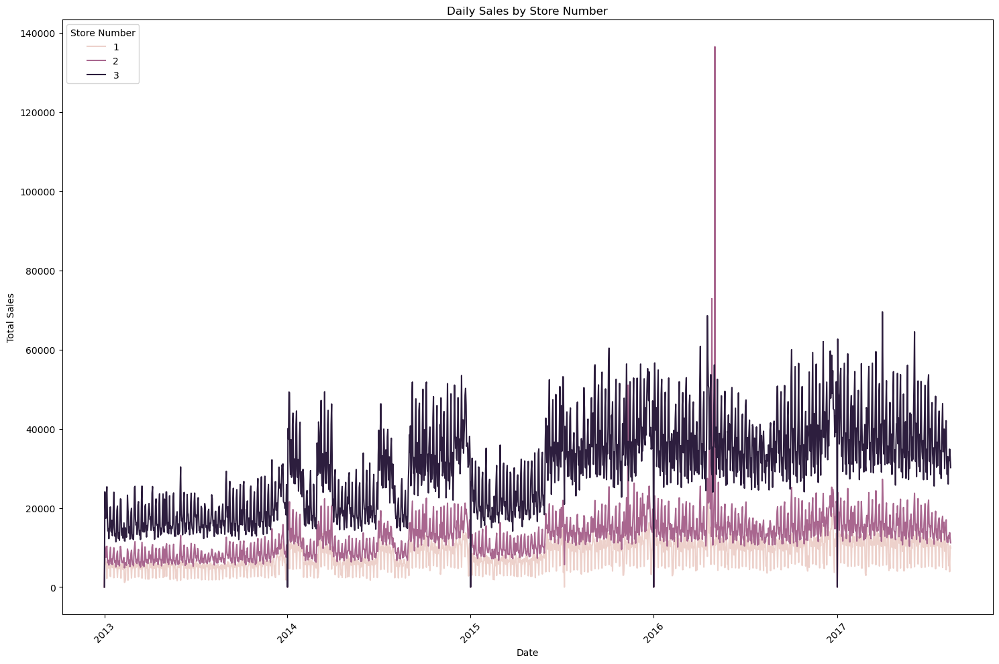

In [3076]:
store_sales = train[(train.store_nbr.isin([1,2,3]))].groupby(by = ['date', 'store_nbr']).agg({'sales':'sum'}).reset_index(drop= False)
visualize_daily_sales_by_product(store_sales, False)

## Enrich Train and test datasets with columns from transactions, oil and stores and holiday_events


In [1741]:
# Merge train and test with transactions on [date, store_nbr]
train = train.merge(transactions, on=['date', 'store_nbr'], how='left')
test = test.merge(transactions, on=['date', 'store_nbr'], how='left')

# Merge train and test with stores on store_nbr to add [city, state, type, cluster]
train = train.merge(stores, on='store_nbr', how='left')
test = test.merge(stores, on='store_nbr', how='left')

# # Merge train and test with oil on date to add [dcoilwtico]
train = train.merge(oil, on='date', how='left')
test = test.merge(oil, on='date', how='left')

holidays_by_date = pd.DataFrame(
    holidays_events[holidays_events.transferred == False].groupby('date')
    .apply(lambda x: {locale: set(x.loc[x['locale'] == locale, 'locale_name']) for locale in x['locale'].unique()}).reset_index(drop=False)

)
holidays_by_date.columns = 'date locale_info'.split()

train = train.merge(holidays_by_date, on='date', how='left')
test = test.merge(holidays_by_date, on='date', how='left')


# # Display first few rows to confirm the merge
train.head()

C:\Users\snde\AppData\Local\Temp\ipykernel_8704\1192041981.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: {locale: set(x.loc[x['locale'] == locale, 'locale_name']) for locale in x['locale'].unique()}).reset_index(drop=False)


,id,date,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,dcoilwtico,locale_info
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
1,1,2013-01-01,1,BABY CARE,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
2,2,2013-01-01,1,BEAUTY,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
3,3,2013-01-01,1,BEVERAGES,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
4,4,2013-01-01,1,BOOKS,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}


In [1757]:
train.head()

,id,date,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,dcoilwtico,locale_info
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
1,1,2013-01-01,1,BABY CARE,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
2,2,2013-01-01,1,BEAUTY,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
3,3,2013-01-01,1,BEVERAGES,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}
4,4,2013-01-01,1,BOOKS,0.0,0,NaN,Quito,Pichincha,D,13,NaN,{'National': {'Ecuador'}}


In [1805]:
def get_local_holiday_flag(locale_info, local_or_regional, value):
    if not pd.isna(locale_info):
        if local_or_regional in locale_info:
            values = locale_info[local_or_regional]
            return 1 if value in values else 0
    return 0
def enrich_holiday_info(dataframe):
    dataframe['IsNationalHoliday'] = dataframe.locale_info.apply(lambda x: 1 if not pd.isna(x) and 'National' in x else 0)
    dataframe['IsLocalHoliday'] = dataframe.apply(lambda x: get_local_holiday_flag(x['locale_info'], 'Local', x['city']), axis = 1)
    dataframe['IsRegionalHoliday'] = dataframe.apply(lambda x: get_local_holiday_flag(x['locale_info'], 'Regional', x['state']), axis = 1)
    
    dataframe['day_of_week'] = dataframe['date'].dt.dayofweek
    dataframe['month'] = dataframe['date'].dt.month
    dataframe['year'] = dataframe['date'].dt.year
    dataframe['is_weekend'] = dataframe['day_of_week'].isin([5, 6]).astype(int)
    return dataframe
train = enrich_holiday_info(train)
test = enrich_holiday_info(test)

In [1855]:
test.head()

,id,date,store_nbr,family,onpromotion,transactions,city,state,type,cluster,dcoilwtico,IsNationalHoliday,IsLocalHoliday,IsRegionalHoliday,day_of_week,month,year,is_weekend
0,3000888,2017-08-16,1,AUTOMOTIVE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
1,3000889,2017-08-16,1,BABY CARE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
2,3000890,2017-08-16,1,BEAUTY,2,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
3,3000891,2017-08-16,1,BEVERAGES,20,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
4,3000892,2017-08-16,1,BOOKS,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0


In [1861]:
train.IsRegionalHoliday.value_counts()

IsRegionalHoliday
0    2999865
1       1023
Name: count, dtype: int64

<Figure size 1200x600 with 0 Axes>

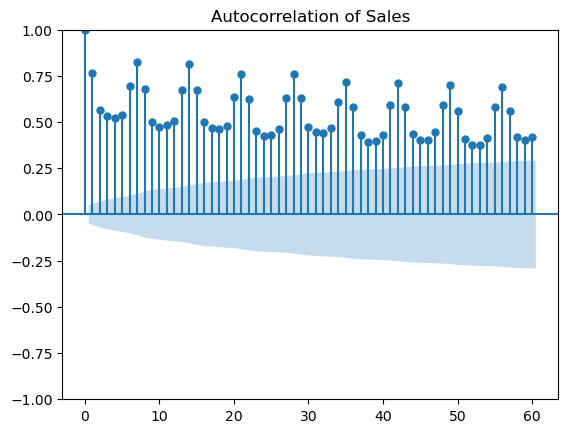

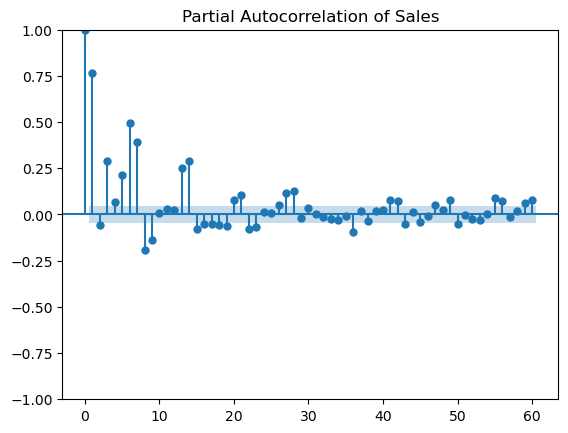

In [1869]:
all_sales = train.groupby('date')['sales'].sum()

# Plot ACF and PACF for initial analysis
plt.figure(figsize=(12, 6))
plot_acf(all_sales, lags=60, title="Autocorrelation of Sales")
plot_pacf(all_sales, lags=60, title="Partial Autocorrelation of Sales")
plt.show()

## Observations from Auto correlation plots.
**Strong Positive Autocorrelation at Lag 1:**
    - High correlation at lag 1 indicates that sales on one day are highly correlated with sales on the previous day. This suggests that the sales data is **highly persistent or exhibits strong temporal dependence**.

**Seasonal Pattern at Lag 7:**
    - Peaks at lag 7, 14, 21, and multiples of 7 indicate a **weekly seasonality.** This suggests that sales patterns repeat approximately every 7 days, consistent with weekly shopping behavior.
    
**Gradual Decay of Correlation:**
    - A gradual decline in autocorrelation indicates that the influence of past observations diminishes over time, but still retains some correlation over a 30–40 day period.
    
**Seasonal Peaks Beyond 30 Lags:**
    - There are secondary peaks after lag 30, suggesting the possibility of monthly or longer seasonal cycles in addition to the weekly pattern.rrelations.



## Autocorrelation (ACF) Plot Interpretation.
**High Partial Autocorrelation at Lag 1:**
    - A large spike at lag 1 suggests a **strong AR(1) process**, meaning that sales are strongly influenced by the previous day's sales.

**Significant Correlation at Lag 7:**
    - The notable spike at lag 7 indicates that a **7-day lag (weekly lag)** has a significant direct impact on sales, supporting the hypothesis of **weekly seasonality.**

**Rapid Decay After Lag 7:**
    - After the initial lags (1 and 7), partial autocorrelation quickly drops, suggesting that additional lags beyond these points contribute less to direct correlations.

In [1994]:
def print_formatted_text(text):
    for i in text.split('\n'):
        if i.strip()!= '':
            if i.strip().endswith(':'):
                print(f"**{i}**")
            else:
                print(f"- {i}\n")

## Seasonallity Decomposition.
Now, I break down the time series into seasons.

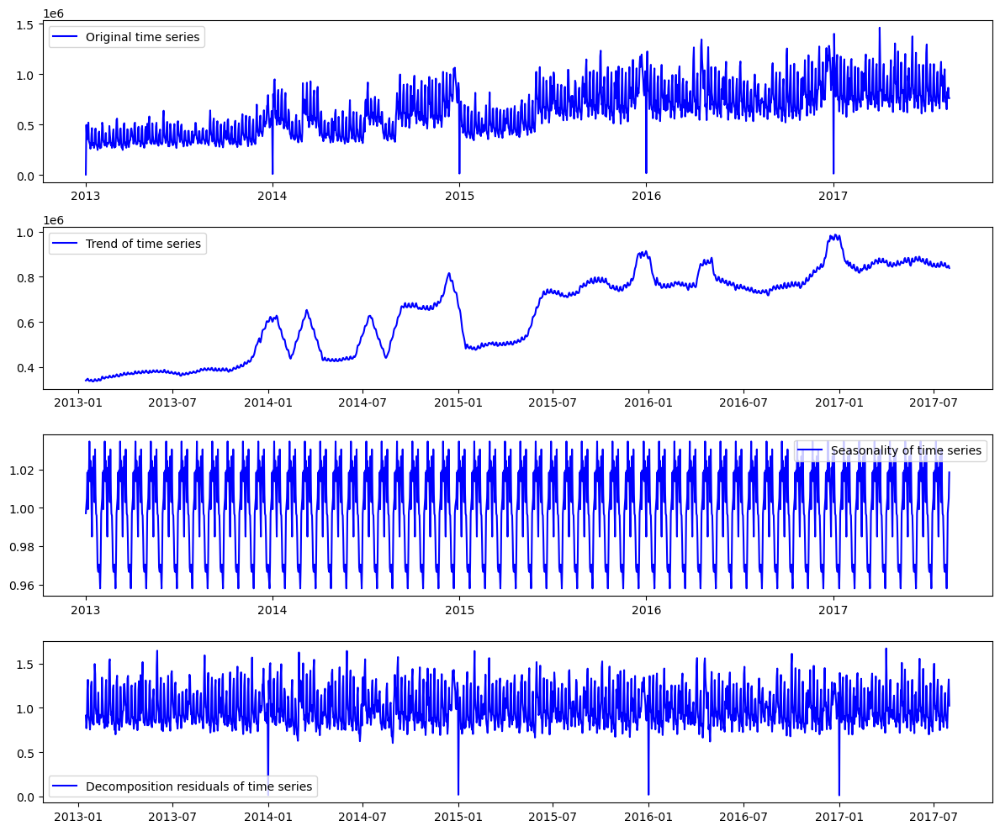

In [3082]:
nationalHolidaysOf2017 = holidays_events[(holidays_events.date.dt.year == 2017) & (holidays_events.date.dt.month <= 8) & (holidays_events.locale== 'National') & (holidays_events.transferred == False)].date
nationalHolidays = holidays_events[(holidays_events.locale== 'National') & (holidays_events.transferred == False)].date
def decompose_and_plot_time_series(time_series, model, period, national_holidays = []):
    decompose_result = seasonal_decompose(time_series, model=model, period=period)
    trend_estimate = decompose_result.trend
    periodic_estimate = decompose_result.seasonal
    residual = decompose_result.resid
    
    plt.figure(figsize=(12,10))
    plt.subplot(411)
    plt.plot(time_series, label='Original time series', color='blue')
    for holiday in national_holidays:
        plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.7)
    plt.legend(loc='best')
    
    plt.subplot(412)
    plt.plot(trend_estimate, label='Trend of time series', color='blue')
    for holiday in national_holidays:
        plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.7)
    plt.legend(loc='best')
    
    plt.subplot(413)
    plt.plot(periodic_estimate, label='Seasonality of time series', color='blue')
    for holiday in national_holidays:
        plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.7)
    plt.legend(loc='best')
    
    plt.subplot(414)
    plt.plot(residual, label='Decomposition residuals of time series', color='blue')
    for holiday in national_holidays:
        plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.7)
    plt.legend(loc='best')
    
    plt.tight_layout()
    plt.show()# plt.savefig('decomposition.png')
decompose_and_plot_time_series(all_sales, 'multiplicative', 30)

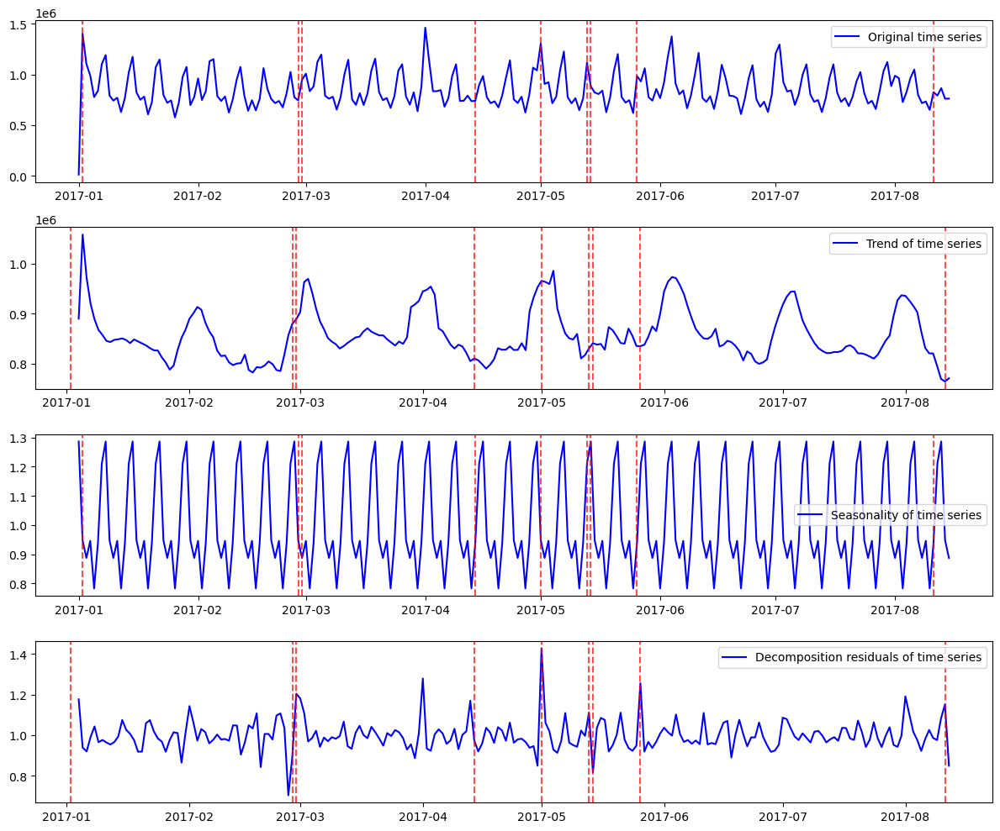

In [2050]:
year2017_data = all_sales[all_sales.index.year == 2017]
decompose_and_plot_time_series(year2017_data, 'multiplicative', 7, national_holidays=nationalHolidaysOf2017)

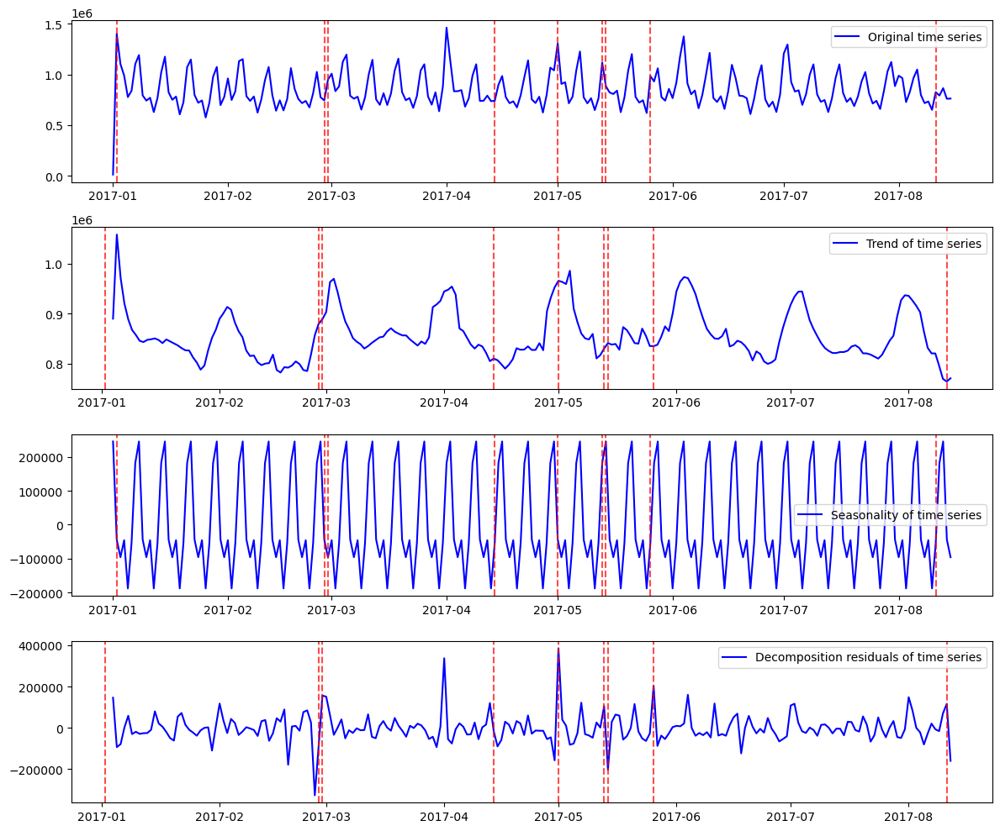

In [2057]:

decompose_and_plot_time_series(year2017_data, 'additive', 7, national_holidays=nationalHolidaysOf2017)

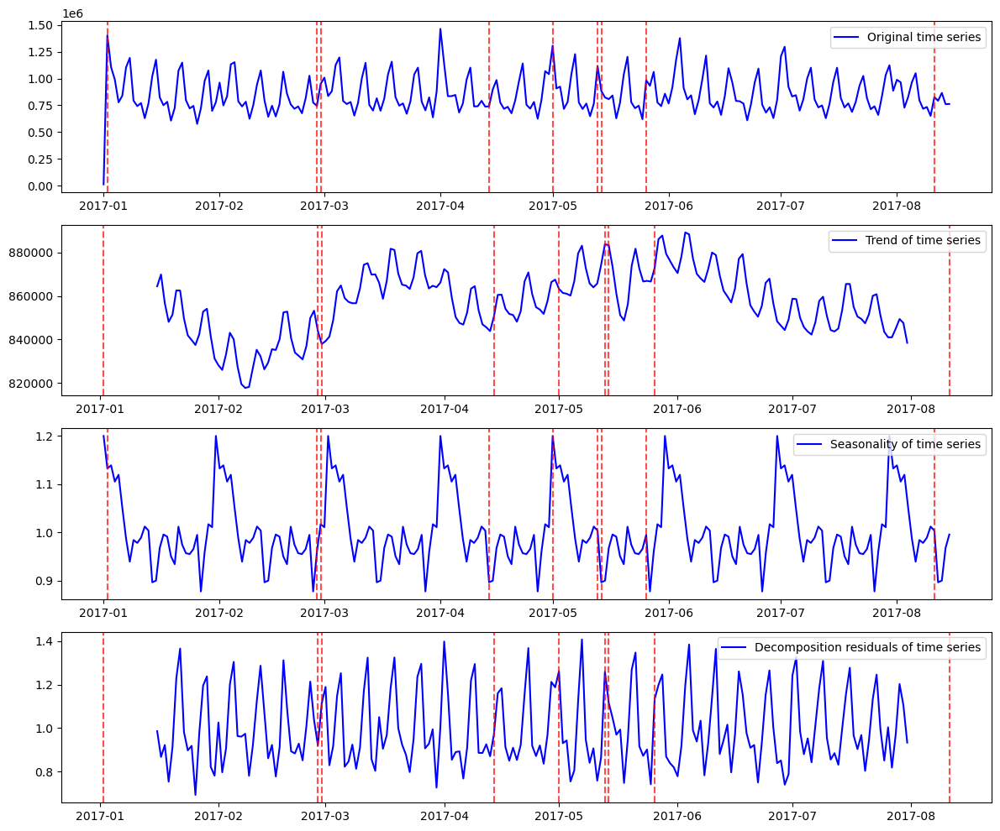

In [2059]:

decompose_and_plot_time_series(year2017_data, 'multiplicative', 30, national_holidays=nationalHolidaysOf2017)

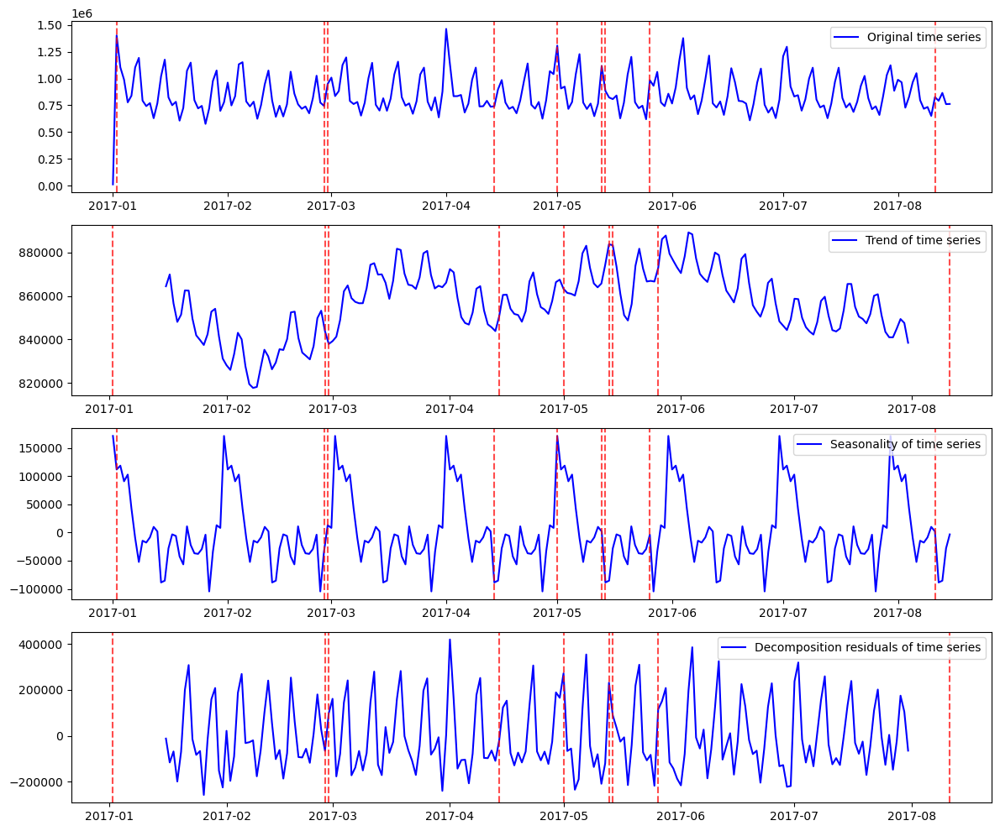

In [2111]:
decompose_and_plot_time_series(year2017_data, 'additive', 30, national_holidays=nationalHolidaysOf2017)

## Decomposition of Time series
### 1) Trend Analysis
**30-Day Period:**
- The trend exhibits a gradual increase in sales over the years (2013 to 2017), with a noticeable growth starting mid-2014

- There are some sharp dips (likely reflecting holidays, promotions, or external factors such as the April 2016 earthquak).

- Seasonally adjusted, the trend suggests higher sales periods during mid-year and year-end, likely driven by holidays and events.

**7-Day Period:**
- The trend for 2017 (January to August) reveals cyclical patterns, with fluctuations that align with promotional events, holidays, or payday ffects.

- Similar peaks and troughs appear with short-term weekly patterns, reflecting predictable weekly purchasing



### 2) Seasonality Analysis
**30-Day Period:**
- Strong weekly seasonal patterns are evident in the data, with distinct repetitive peaks and troughs aligned with days of the week

- The amplitude of the seasonal component increases with time, suggesting that seasonal effects have become more pronounced over the yeas.

- Highs likely correspond to weekends or days preceding holidays when people tend to stock up.

**7-Day Period:**
- Consistent weekly patterns, with strong peaks every 7 days, suggesting sales increase on specific days (potentially wekends).

- Seasonality within a week is relatively stable and aligns with expected short-term patterns, reinforcing the importance of including lag variables of 7, 14, an


### 3) Resisual Analysis
**30-Day Period:**
- Residuals are relatively scattered around zero, indicating that the model captures most of the trend and seasonal effects.
- However, notable spikes in residuals around early 2015 and mid-2016 suggest that certain unexpected factors (likely promotions, change of political power, naural disasters, or unmodeled effects) influenced sales.

**7-Day Period:**
- Residuals remain more stable in the shorter-term period, but spikes indicate occasional events or promotions affecting short-term sales.
- Anomalies during March 2017 and July 2017 suggest irregularities that may need special treatment, possibly related to specific store-level events or macroeconomic factors.factors.d 21 days. behavior.

## Estimate Optimal Lag Periods
### Seasonal Period Estimation Using Periodogram
Below, I use a periodogram to detect dominant frequencies in a time series, helping determine periodicity.

C:\Users\snde\AppData\Local\Temp\ipykernel_8704\2225978268.py:6: RuntimeWarning: divide by zero encountered in divide
  plt.plot(1 / freqs, spectrum)


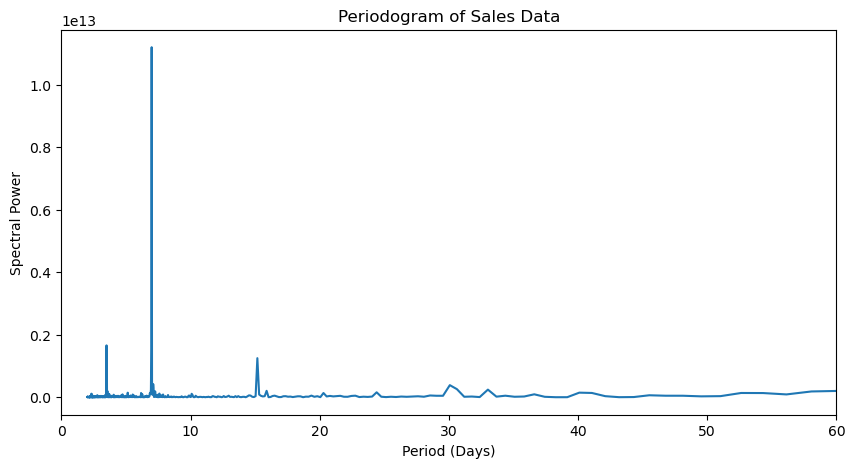

In [2280]:
# Compute periodogram
freqs, spectrum = periodogram(all_sales, detrend='linear')

# Plot periodogram
plt.figure(figsize=(10, 5))
plt.plot(1 / freqs, spectrum)
plt.title('Periodogram of Sales Data')
plt.xlabel('Period (Days)')
plt.ylabel('Spectral Power')
plt.xlim([0, 60])  # Focus on reasonable period range
plt.show()

In [2308]:
new_data = train[train.family=='AUTOMOTIVE'].groupby("date")["sales"].sum()
new_data

date
2013-01-01      0.0
2013-01-02    255.0
2013-01-03    161.0
2013-01-04    169.0
2013-01-05    342.0
              ...  
2017-08-11    441.0
2017-08-12    403.0
2017-08-13    481.0
2017-08-14    292.0
2017-08-15    337.0
Name: sales, Length: 1684, dtype: float64

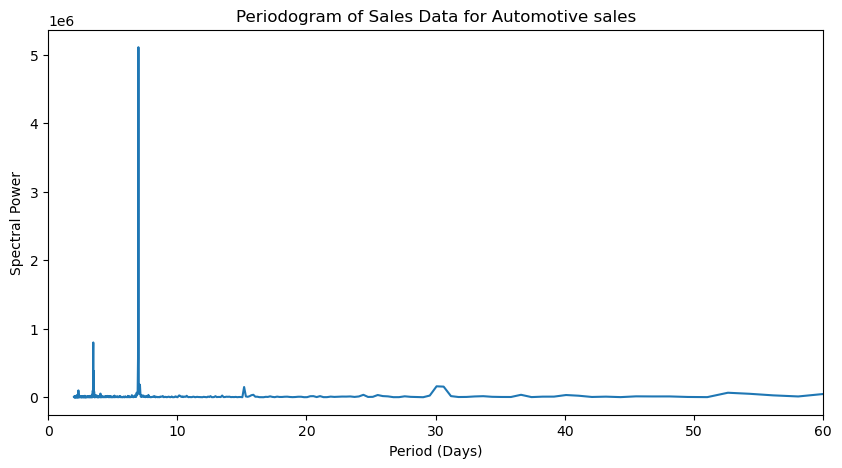

[(1684.0, 132463.95450870186, 1), (842.0, 144200.98393807473, 2)]

In [3086]:
def get_pendiogram(data):
    f, spec = periodogram(data, detrend='linear')
    values = list(zip(1/f, spec, np.arange(len(spec))))[1:]
    values.sort(key = lambda x: x[0], reverse = True)
    plt.figure(figsize=(10, 5))
    plt.plot(1 / f, spec)
    plt.title('Periodogram of Sales Data for Automotive sales')
    plt.xlabel('Period (Days)')
    plt.ylabel('Spectral Power')
    plt.xlim([0, 60])  # Focus on reasonable period range
    plt.show()
    return values, values[:2]
_, vals = get_pendiogram(new_data)
vals

In [2320]:
_, vals = get_pendiogram(all_sales)
vals

C:\Users\snde\AppData\Local\Temp\ipykernel_8704\3158308061.py:3: RuntimeWarning: divide by zero encountered in divide
  values = list(zip(1/f, spec, np.arange(len(spec))))


[(6.987551867219917, 11206959958390.875, 241),
 (280.66666666666663, 2155147725267.6125, 6)]

In [2323]:
14000*618

8652000

## Periodogram of Sales
**Dominant Peak at Approximately 7 Days**
-  The most prominent feature of your periodogram is the very high peak around a period of 7 days. This indicates a strong weekly seasonality in your sales data. This means that you are seeing a very strong pattern that repeats every 7 days.

**Secondary Peak at Approximately 14 Days**
-  There is a smaller, but still noticeable, peak at approximately 14 days. This suggests a potential bi-weekly pattern or a harmonic of the 7-day cycle.

**Minor Peaks**
-  There are a few other minor peaks scattered throughout the periodogram. These may indicate other, weaker periodicities in your data. However, the 7-day and 14-day peaks are clearly the most significant.

**Low Power at Higher Periods**
-  Beyond 14 days, the spectral power is relatively low, suggesting that there are no strong periodicities with longer periods in your data.


### Harmonics
The peak at 14 and 21 days could be a harmonic of the 7-day cycle. Harmonics are multiples of a fundamental frequency or period.

## Selecting the appropriate model
### 1) Exponential Smoothing State Space Model (ETS)
**Summary of Findings Informing ETS Configuration**

- **Trend:** Decomposition shows a clear upward trend over the years, which suggests the need to model a trend component.
- **Seasonality:** Strong seasonality at **7 days (weekly pattern)** with harmonics at 14 and 21 days, confirmed by the periodogram and ACF/PACF analysis.
- **Residuals:** Residuals show some noise, but no obvious pattern, suggesting a basic error model may be appropriate.

In [ ]:
# fit in statsmodels 
model = ETSModel(mytrain, error="add", trend="add", seasonal="add", damped_trend=True, seasonal_periods=7,) 
fit = model.fit() 
pred = fit.get_prediction(start="2013-03-01", end="2015-12-01") 
df = pred.summary_frame(alpha=0.05) 
df['test']=mytest 
austourists.plot(label="Y") 
plt.ylabel("Australian Tourists") 
fit.fittedvalues.plot(label="ETS(AAA)") 
df['test'].plot(label='Test y') 
df['mean'].plot(label='Forecast y') 
plt.legend() 

In [2075]:
stats.__file__

'C:\\Users\\snde\\AppData\\Local\\anaconda3\\Lib\\site-packages\\scipy\\stats\\__init__.py'

In [ ]:
ed = ExponentialSmoothing()

In [2077]:
test.head()

,id,date,store_nbr,family,onpromotion,transactions,city,state,type,cluster,dcoilwtico,IsNationalHoliday,IsLocalHoliday,IsRegionalHoliday,day_of_week,month,year,is_weekend
0,3000888,2017-08-16,1,AUTOMOTIVE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
1,3000889,2017-08-16,1,BABY CARE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
2,3000890,2017-08-16,1,BEAUTY,2,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
3,3000891,2017-08-16,1,BEVERAGES,20,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
4,3000892,2017-08-16,1,BOOKS,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0


In [2091]:
test.family.value_counts().shape

(33,)

In [ ]:
pd.Series()

In [2166]:
train.sort_values(by=['store_nbr', 'date'], inplace = True)

In [2354]:
family_sales_data

date
2013-01-01      0.0
2013-01-02    255.0
2013-01-03    161.0
2013-01-04    169.0
2013-01-05    342.0
              ...  
2017-08-11    441.0
2017-08-12    403.0
2017-08-13    481.0
2017-08-14    292.0
2017-08-15    337.0
Name: sales, Length: 1684, dtype: float64

In [2356]:
family_sales_data +3

date
2013-01-01      3.0
2013-01-02    258.0
2013-01-03    164.0
2013-01-04    172.0
2013-01-05    345.0
              ...  
2017-08-11    444.0
2017-08-12    406.0
2017-08-13    484.0
2017-08-14    295.0
2017-08-15    340.0
Name: sales, Length: 1684, dtype: float64

In [2380]:
family_sales_data.values

array([  0., 255., 161., ..., 481., 292., 337.])

In [2412]:
start, end = min(test.date), max(test.date)
def get_numpy_range(arr):
    return np.max(arr) - np.min(arr)

for product_family, stores_sales_by_family in stores_sales.groupby('family'):
    print(product_family)
    #print(product_family, store_number)
    family_sales_data = train[train.family==product_family].groupby("date")["sales"].sum()
    
    # print(sales.head(2))
    # sales_data = pd.Series(data = 1 + sales['sales'], index = sales['date'])
    # print(sales_data.shape)
    # print(sales_data)
    # sales_data['sales'] = sales_data['sales'].apply(lambda x: x+1)
    # sales_data = pd.Series(data = sales['sales'], index = pd.date_range("2013-01-01", "2017-08-15", freq="1D"))
    # print(sales_data)
    # print(min(sales_data), max(sales_data), len(sales_data))
    decompose_result1 = seasonal_decompose(5+ family_sales_data, model='multiplicative', period=7)
    decompose_result2 = seasonal_decompose(family_sales_data, model='additive', period=7)
    
    trend_estimate_mul = decompose_result1.trend
    periodic_estimate_mul = decompose_result1.seasonal
    residual_mul = decompose_result1.resid

    trend_estimate_add = decompose_result2.trend
    periodic_estimate_add = decompose_result2.seasonal
    residual_add = decompose_result2.resid
    error, trend, seasonal = 'add', 'add', 'add'
    if get_numpy_range(trend_estimate_mul) < get_numpy_range(trend_estimate_add):
        trend = 'mul'
    if get_numpy_range(periodic_estimate_mul) < get_numpy_range(periodic_estimate_add):
        periodic = 'mul'
    if get_numpy_range(residual_mul) < get_numpy_range(residual_add):
        error = 'mul'
    
    
    #ets_model = ETSModel(family_sales_data, error="add", trend="add", seasonal="add", seasonal_periods=7)
    ets_model = None
    if 'mul' in [error, trend, seasonal]:
        # print('mul', temp)
        data = 5+ family_sales_data.values
        index = np.arange(len(data))
        mult_data = pd.Series(data, index = index)
        ets_model = ETSModel(mult_data, error=error, trend=trend, seasonal=seasonal, seasonal_periods=7)
        ets_fit = ets_model.fit()
        # print('Successfully fitted')
        # Generate forecasts
        try:
            start, end = min(family_sales_data.index), max(test.date)
            forecast_ets = ets_fit.get_prediction(start = 0, end = 100)
            # print(forecast_ets.summary_frame(alpha=0.95).head())
        except Exception as e:
            print('Inside exception')
            print(e)
    else:
        temp = family_sales_data.head()
        print('add', temp)
        ets_model = ETSModel(family_sales_data, error=error, trend=trend, seasonal=seasonal, seasonal_periods=7)
        
        ets_fit = ets_model.fit()
        
        # Generate forecasts
        # forecast_ets = ets_fit.get_prediction(steps=16)
        # forecast_ets.summary_frame(alpha=0.95).head()
    #break

#forecast_ets.summary_frame(alpha=0.95).head(40)

AUTOMOTIVE
BABY CARE
BEAUTY
BEVERAGES
BOOKS
BREAD/BAKERY
CELEBRATION
CLEANING
DAIRY
DELI
EGGS
FROZEN FOODS
GROCERY I
GROCERY II
HARDWARE


C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\exponential_smoothing\ets.py:1230: RuntimeWarning: invalid value encountered in divide
  return (data - yhat) / yhat
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\exponential_smoothing\ets.py:1163: RuntimeWarning: invalid value encountered in log
  logL = -self.nobs / 2 * (np.log(2 * np.pi * np.mean(res ** 2)) + 1)
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\exponential_smoothing\ets.py:1170: RuntimeWarning: invalid value encountered in less_equal
  yhat[yhat <= 0] = 1 / (1e-8 * (1 + np.abs(yhat[yhat <= 0])))
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\exponential_smoothing\ets.py:1171: RuntimeWarning

HOME AND KITCHEN I
HOME AND KITCHEN II
HOME APPLIANCES
HOME CARE
LADIESWEAR
LAWN AND GARDEN
LINGERIE
LIQUOR,WINE,BEER
MAGAZINES
MEATS
PERSONAL CARE
PET SUPPLIES
PLAYERS AND ELECTRONICS
POULTRY
PREPARED FOODS
PRODUCE
SCHOOL AND OFFICE SUPPLIES
SEAFOOD


In [2891]:
start, end = min(test.date), max(test.date)
def get_numpy_range(arr):
    return np.max(arr) - np.min(arr)

def prepare_forecast(actual_data, predicted_data, date_index):
    df = pd.DataFrame(data = {'actual': list(actual_data) + [np.nan]*(len(predicted_data)-len(actual_data)), 'predicted': predicted_data})
    df.index = date_index
    return df

errors = defaultdict(list)
current_store_nbr = 0
for store_nbr, stores_sales in train.groupby('store_nbr'):
    for product_family, stores_sales_by_family in stores_sales.groupby(['family']):
        product_family = product_family[0]

        family_sales_data = train[(train.family==product_family) & (train.store_nbr == store_nbr)].groupby("date")["sales"].sum()
        family_sales_data.sort_index(inplace = True)

        decompose_result1 = seasonal_decompose(5+ family_sales_data, model='multiplicative', period=7)
        decompose_result2 = seasonal_decompose(family_sales_data, model='additive', period=7)
        
        trend_estimate_mul = decompose_result1.trend
        periodic_estimate_mul = decompose_result1.seasonal
        residual_mul = decompose_result1.resid
    
        trend_estimate_add = decompose_result2.trend
        periodic_estimate_add = decompose_result2.seasonal
        residual_add = decompose_result2.resid
        error, trend, seasonal = 'add', 'add', 'add'
        if get_numpy_range(trend_estimate_mul) < get_numpy_range(trend_estimate_add):
            trend = 'mul'
        if get_numpy_range(periodic_estimate_mul) < get_numpy_range(periodic_estimate_add):
            periodic = 'mul'
        if get_numpy_range(residual_mul) < get_numpy_range(residual_add):
            error = 'mul'
        
        last_time_date = max(family_sales_data.index)
        additional_days = (pd.to_datetime('2017-08-31 12:30') - max(family_sales_data.index)).days
        ets_model = None
        date_index = pd.concat([pd.Series(family_sales_data.index.values), pd.Series(pd.date_range(start = '2017-08-15', end = '2017-08-31', freq = '1D'))], axis = 0)
        forecast_df = None
        try:
            ## since multiplicative treands do not work with 0 data, I transformed the data by adding 5 to each sales value.
            ## The 5 is subtracted from the prediction, renormallizing the data.
            data = 5+ family_sales_data.values
            index = np.arange(len(data))
            mult_data = pd.Series(data, index = index)
            ets_model = ExponentialSmoothing(mult_data, trend=trend, seasonal=seasonal, seasonal_periods=7)
            #ets_model = ETSModel(mult_data, error=error, trend=trend, seasonal=seasonal, seasonal_periods=7)
            ets_fit = ets_model.fit()
            # Generate forecasts
            #forecast_ets = ets_fit.get_prediction(start = 0, end = len(data)+additional_days-1)
            forecast_ets = ets_fit.predict(start = 0, end = len(data)+additional_days)
            # forecast_df = forecast_ets.summary_frame(alpha=0.95)
            forecast_df = prepare_forecast(actual_data = data-5, predicted_data= forecast_ets.values-5, date_index = date_index)
            output_path = 'Data/StoreSalesTimeSeriesForecasting/Forecasts/'
            output_file_path = f"{output_path}{store_nbr}__{product_family.replace(' ', '__').replace(',', '_').replace('/', '-')}.csv"
            #print(output_file_path)
            forecast_df.to_csv(output_file_path, index = True)
        except Exception as e:
            print(e)
            errors[store_nbr].append({'family':product_family, 'error': str(e)})


#forecast_ets.summary_frame(alpha=0.95).head(40)

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmode

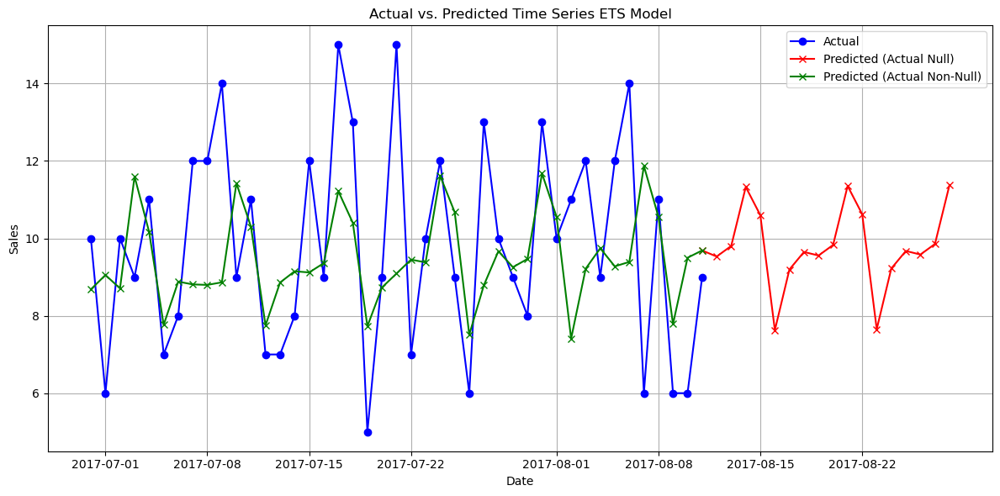

In [3092]:
def plot_actual_vs_predicted(df):
    """
    Plots the 'actual' and 'predicted' columns of a DataFrame with a date index.
    Null 'actual' values are plotted in red.

    Args:
        df (pd.DataFrame): DataFrame with 'actual' and 'predicted' columns and a DatetimeIndex.
    """

    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("DataFrame index must be a DatetimeIndex.")

    if 'actual' not in df.columns or 'predicted' not in df.columns:
        raise ValueError("DataFrame must contain 'actual' and 'predicted' columns.")

    plt.figure(figsize=(12, 6))

    # Plot non-null actual values in blue
    non_null_actual = df[df['actual'].notna()]
    plt.plot(non_null_actual.index, non_null_actual['actual'], label='Actual', marker='o', color='blue')

    # Plot null actual values in red
    nrecs = df.shape[0]
    nnulls = df[df['actual'].isna()].shape[0]
    null_actual = df.iloc[nrecs-nnulls-1 :, :]
    plt.plot(null_actual.index, null_actual['predicted'], label='Predicted (Actual Null)', marker='x', color='red')

    # Plot predicted values for non-null actuals
    plt.plot(non_null_actual.index, non_null_actual['predicted'], label='Predicted (Actual Non-Null)', marker='x', color='green')

    plt.title('Actual vs. Predicted Time Series ETS Model')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
plot_actual_vs_predicted(dt.tail(60))

In [2566]:
sales_data = train[train.family=='AUTOMOTIVE'].groupby("date")["sales"].sum()

# Fit ETS model
ets_model = ETSModel(sales_data, error="add", trend="add", seasonal="add", seasonal_periods=7)
ets_fit = ets_model.fit()

# Generate forecasts
forecast_ets = ets_fit.get_prediction(steps=16 + len(sales_data))
forecast_df = forecast_ets.summary_frame(alpha=0.95)
forecast_df.head()

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


,mean,pi_lower,pi_upper
date,,,
2013-01-01,139.240509,135.423737,143.057282
2013-01-02,130.197817,126.381044,134.014589
2013-01-03,115.921069,112.104296,119.737842
2013-01-04,132.307087,128.490315,136.123860
2013-01-05,267.385481,263.568709,271.202254


In [2572]:
sales_data = train[train.family=='AUTOMOTIVE'].groupby("date")["sales"].sum()

# Fit ETS model
ets_model = ETSModel(sales_data, error="add", trend="add", seasonal="add", seasonal_periods=7)
ets_fit = ets_model.fit()

# Generate forecasts
forecast_ets = ets_fit.get_prediction(start = '2013-01-01', end = '2017-08-01')
forecast_df = forecast_ets.summary_frame(alpha=0.95)
forecast_df.head()

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


,mean,pi_lower,pi_upper
date,,,
2013-01-01,139.240509,135.423737,143.057282
2013-01-02,130.197817,126.381044,134.014589
2013-01-03,115.921069,112.104296,119.737842
2013-01-04,132.307087,128.490315,136.123860
2013-01-05,267.385481,263.568709,271.202254


## Summary of Findings Informing ARIMA Configuration
- **Stationarity:** The original time series is non-stationary due to trend and seasonality, so differencing is required.
- **Differencing Order (d):** One differencing (d=1) should be sufficient to remove the trend.
- **Autoregression and Moving Average:**
- **p (AR lag):** PACF shows significant correlation at lag 7, suggesting p=7.
- **q (MA lag):** ACF shows spikes around 7, 14, and 21, suggesting q=7.
- **Seasonality:** Explicit seasonality with weekly pattern, implying SARIMA may be preferable.
- **Residual Noise:** Residuals after decomposition seem uncorrelated, implying a well-fit model.

In [2762]:
arima_model = SARIMAX(
    sales_data,
    order=(7, 1, 1),               # Add a non-seasonal MA term
    seasonal_order=(0, 1, 1, 7),
    enforce_stationarity=False,
    enforce_invertibility=False
)

C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [2856]:
sales_data = train[train.family=='AUTOMOTIVE'].groupby("date")["sales"].sum()
sales_data.index = pd.DatetimeIndex(sales_data.index).to_period('D')

arima_model = SARIMAX(
    sales_data,                      # Time series data (e.g., sales over time)
    
    # Non-seasonal ARIMA order (p, d, q)
    order=(7, 1, 1),                 # p=7: 7 lags in AR (Autoregressive)
                                      # d=1: 1 order of differencing to make data stationary
                                      # q=1: 1 lag in MA (Moving Average) to account for short-term dependencies
    
    # Seasonal ARIMA order (P, D, Q, s)
    seasonal_order=(0, 1, 1, 7),      # P=0: No seasonal AR component
                                      # D=1: 1 seasonal differencing to capture weekly patterns
                                      # Q=1: 1 lag in seasonal MA to capture seasonal effects
                                      # s=7: Seasonality with a weekly period (7 days)
    
    enforce_stationarity=False,       # Allow the model to fit even if the data is not strictly stationary
    enforce_invertibility=False       # Allow the model to fit even if it violates invertibility conditions
)

arima_results = arima_model.fit(disp=True)  # disp=False to suppress verbose output


C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


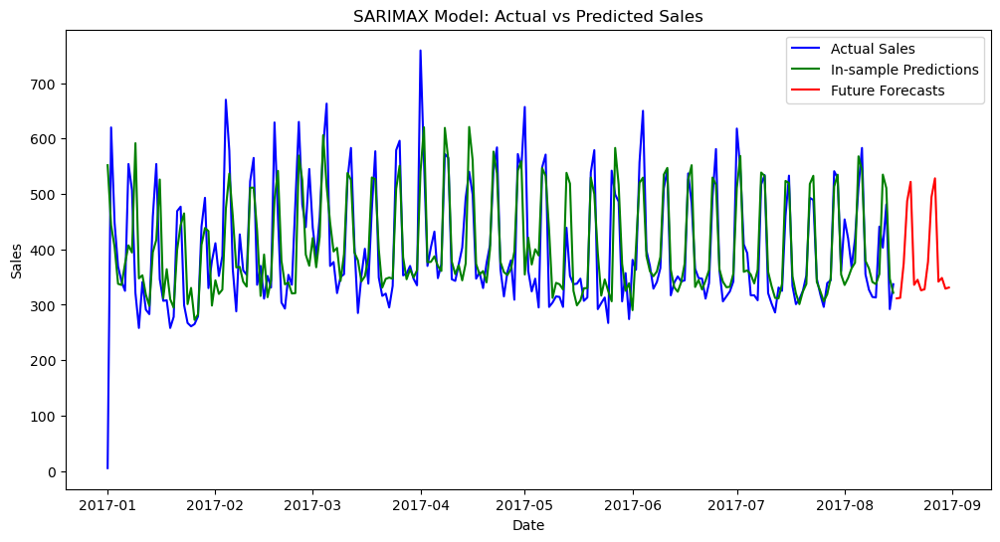

In [2857]:
# Generate in-sample predictions (fitted values) for the training period
in_sample_preds = arima_results.predict(start=sales_data.index[0], 
                                        end=sales_data.index[-1], 
                                        dynamic=False)  # Dynamic=False means one-step-ahead predictions

# Generate out-of-sample (future) predictions
# Specify the number of future steps to forecast
n_forecast_steps =  (pd.to_datetime('2017-08-31 12:30') - pd.to_datetime(max(sales_data.index).to_timestamp())).days

future_preds = arima_results.forecast(steps=n_forecast_steps)

# Plot predictions vs actuals
plt.figure(figsize=(12, 6))
convert_index_to_timestamp = lambda x: [pd.to_datetime(value.to_timestamp()) for value in x.index]
in_sample_preds.index = convert_index_to_timestamp(in_sample_preds)
sales_data.index = convert_index_to_timestamp(sales_data)
plt.plot(sales_data[sales.index.year == 2017], label='Actual Sales', color='blue')
plt.plot(in_sample_preds[in_sample_preds.index.year == 2017], label='In-sample Predictions', color='green')
plt.plot(pd.date_range(sales_data.index[-1], periods=n_forecast_steps+1, freq='D')[1:],
         future_preds, label='Future Forecasts', color='red')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('SARIMAX Model: Actual vs Predicted Sales')
plt.legend()
plt.show()

In [2862]:
[i.shape for i in [in_sample_preds, future_preds,sales_data ]]

[(1684,), (16,), (1684,)]

In [2868]:
future_preds.head()

2017-08-12    311.415591
2017-08-13    312.416759
2017-08-14    374.352250
2017-08-15    487.099393
2017-08-16    521.850698
Freq: D, Name: predicted_mean, dtype: float64

In [2874]:
pd.DataFrame(in_sample_preds)

,predicted_mean
2013-01-01,0.000000
2013-01-02,0.000000
2013-01-03,289.806182
2013-01-04,158.607951
2013-01-05,186.956055
...,...
2017-08-11,355.307629
2017-08-12,534.853357
2017-08-13,510.689080
2017-08-14,346.832589


In [2888]:
errors2 = defaultdict(list)
current_store_nbr = 0
for store_nbr, stores_sales in train.groupby('store_nbr'):
    for product_family, stores_sales_by_family in stores_sales.groupby(['family']):
        product_family = product_family[0]
        # if current_store_nbr != store_nbr:
        #     print(product_family, store_nbr)

        family_sales_data = train[(train.family==product_family) & (train.store_nbr == store_nbr)].groupby("date")["sales"].sum()
        family_sales_data.sort_index(inplace = True)
        family_sales_data.index =  pd.DatetimeIndex(family_sales_data.index).to_period('D')
        arima_model = SARIMAX(family_sales_data,
                              order=(7, 1, 1),
                              seasonal_order=(0, 1, 1, 7),
                              enforce_stationarity=False,
                              enforce_invertibility=False)
        
        arima_results = arima_model.fit(disp=False)
        in_sample_preds = arima_results.predict(start=family_sales_data.index[0], 
                                        end=family_sales_data.index[-1], 
                                        dynamic=False)
        
        n_forecast_steps =  (pd.to_datetime('2017-08-31 12:30') - pd.to_datetime(max(family_sales_data.index).to_timestamp())).days
        
        future_preds = arima_results.forecast(steps=n_forecast_steps)

        all_preds  = pd.DataFrame(pd.concat([in_sample_preds, future_preds], axis=0))
        all_preds.columns = ['predicted']
        

        new_nas = future_preds.copy()
        new_nas[:] = np.nan
        all_preds['actual'] = pd.concat([family_sales_data, new_nas], axis=0).values
        
        try:
            output_path1 = 'Data/StoreSalesTimeSeriesForecasting/Forecasts2/'
            output_file_path1 = f"{output_path1}{store_nbr}__{product_family.replace(' ', '__').replace(',', '_').replace('/', '-')}.csv"
            all_preds.to_csv(output_file_path1, index = True)
        except Exception as e:
            print(e)
            errors2[store_nbr].append({'family':product_family, 'error': str(e)})


C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\snde\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\snde\AppData\Local\anaconda3\Lib\site-p

In [2901]:
test.head()

,id,date,store_nbr,family,onpromotion,transactions,city,state,type,cluster,dcoilwtico,IsNationalHoliday,IsLocalHoliday,IsRegionalHoliday,day_of_week,month,year,is_weekend
0,3000888,2017-08-16,1,AUTOMOTIVE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
1,3000889,2017-08-16,1,BABY CARE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
2,3000890,2017-08-16,1,BEAUTY,2,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
3,3000891,2017-08-16,1,BEVERAGES,20,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
4,3000892,2017-08-16,1,BOOKS,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0


## Prepare Predictions for Submission
Now I load the predictions from the dataframe to submit for the competition.

In [2923]:
def load_predictions(predictions_file_path, tail_rows = 16):
    file_name = predictions_file_path.split('/')[-1].replace('.csv', '')
    store_nbr, name = file_name.split('__', maxsplit=1)
    store_nbr = int(store_nbr)
    family = name.replace('__', ' ').replace('_', ',').replace('-', '/')
    df = pd.read_csv(predictions_file_path)
    df = df.tail(tail_rows)
    df.columns = ['date'] + list(df.columns[1:])
    df['store_nbr'] = store_nbr
    df['family'] = family
    return df.tail(n)



output_path1 = 'Data/StoreSalesTimeSeriesForecasting/Forecasts2/'
arima_preds = None
additions = 0
for file_name in os.listdir(output_path1):
    output_file_path1 = f"{output_path1}{file_name}"
    predictions = load_predictions(output_file_path1)
    if arima_preds is None:
        arima_preds = predictions
    else:
        arima_preds = pd.concat([arima_preds, predictions], axis=0)
        additions += 1
    # if(additions >3):
    #     break
arima_preds.head()

,date,predicted,actual,store_nbr,family
1684,2017-08-12,1.421241,NaN,10,AUTOMOTIVE
1685,2017-08-13,1.130748,NaN,10,AUTOMOTIVE
1686,2017-08-14,1.223299,NaN,10,AUTOMOTIVE
1687,2017-08-15,2.384745,NaN,10,AUTOMOTIVE
1688,2017-08-16,2.085069,NaN,10,AUTOMOTIVE


In [2925]:
arima_preds.family.value_counts()

family
AUTOMOTIVE                    864
HOME APPLIANCES               864
SCHOOL AND OFFICE SUPPLIES    864
PRODUCE                       864
PREPARED FOODS                864
POULTRY                       864
PLAYERS AND ELECTRONICS       864
PET SUPPLIES                  864
PERSONAL CARE                 864
MEATS                         864
MAGAZINES                     864
LIQUOR,WINE,BEER              864
LINGERIE                      864
LAWN AND GARDEN               864
LADIESWEAR                    864
HOME CARE                     864
HOME AND KITCHEN II           864
BABY CARE                     864
HOME AND KITCHEN I            864
HARDWARE                      864
GROCERY II                    864
GROCERY I                     864
FROZEN FOODS                  864
EGGS                          864
DELI                          864
DAIRY                         864
CLEANING                      864
CELEBRATION                   864
BREAD/BAKERY                  864
BOOKS  

In [2974]:
output_path1 = 'Data/StoreSalesTimeSeriesForecasting/Forecasts/'
ets_preds = None
additions = 0
for file_name in os.listdir(output_path1):
    output_file_path1 = f"{output_path1}{file_name}"
    predictions = load_predictions(output_file_path1)
    if ets_preds is None:
        ets_preds = predictions
    else:
        ets_preds = pd.concat([ets_preds, predictions], axis=0)
        additions += 1
    # if(additions >3):
    #     break
ets_preds.head()

,date,actual,predicted,store_nbr,family
1685,2017-08-16,NaN,1.247995,10,AUTOMOTIVE
1686,2017-08-17,NaN,1.239653,10,AUTOMOTIVE
1687,2017-08-18,NaN,2.231679,10,AUTOMOTIVE
1688,2017-08-19,NaN,2.169810,10,AUTOMOTIVE
1689,2017-08-20,NaN,1.785439,10,AUTOMOTIVE


In [2975]:
ets_preds.shape, test.shape

((28512, 5), (28512, 18))

In [2978]:
ets_preds.store_nbr.value_counts()

store_nbr
10    528
47    528
37    528
38    528
39    528
3     528
40    528
41    528
42    528
43    528
44    528
45    528
46    528
48    528
11    528
49    528
4     528
50    528
51    528
52    528
53    528
54    528
5     528
6     528
7     528
8     528
36    528
35    528
34    528
33    528
12    528
13    528
14    528
15    528
16    528
17    528
18    528
19    528
1     528
20    528
21    528
22    528
23    528
24    528
25    528
26    528
27    528
28    528
29    528
2     528
30    528
31    528
32    528
9     528
Name: count, dtype: int64

In [2931]:
test.head()

,id,date,store_nbr,family,onpromotion,transactions,city,state,type,cluster,dcoilwtico,IsNationalHoliday,IsLocalHoliday,IsRegionalHoliday,day_of_week,month,year,is_weekend
0,3000888,2017-08-16,1,AUTOMOTIVE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
1,3000889,2017-08-16,1,BABY CARE,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
2,3000890,2017-08-16,1,BEAUTY,2,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
3,3000891,2017-08-16,1,BEVERAGES,20,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0
4,3000892,2017-08-16,1,BOOKS,0,NaN,Quito,Pichincha,D,13,46.8,0,0,0,2,8,2017,0


In [2936]:
test_arima = test['id	date	store_nbr	family'.split()]
test_arima.head()

,id,date,store_nbr,family
0,3000888,2017-08-16,1,AUTOMOTIVE
1,3000889,2017-08-16,1,BABY CARE
2,3000890,2017-08-16,1,BEAUTY
3,3000891,2017-08-16,1,BEVERAGES
4,3000892,2017-08-16,1,BOOKS


In [2938]:
test_arima.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         28512 non-null  int64         
 1   date       28512 non-null  datetime64[ns]
 2   store_nbr  28512 non-null  int64         
 3   family     28512 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 891.1+ KB


In [2940]:
tes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   id                 28512 non-null  int64         
 1   date               28512 non-null  datetime64[ns]
 2   store_nbr          28512 non-null  int64         
 3   family             28512 non-null  object        
 4   onpromotion        28512 non-null  int64         
 5   transactions       0 non-null      float64       
 6   city               28512 non-null  object        
 7   state              28512 non-null  object        
 8   type               28512 non-null  object        
 9   cluster            28512 non-null  int64         
 10  dcoilwtico         21384 non-null  float64       
 11  IsNationalHoliday  28512 non-null  int64         
 12  IsLocalHoliday     28512 non-null  int64         
 13  IsRegionalHoliday  28512 non-null  int64         
 14  day_of

In [3012]:
def left_join_arima_preds(test_arima, arima_preds, output_distination_file_path, max_train):
    """
    Performs a left join of test_arima with arima_preds on 'store_nbr', 'date', and 'family'.

    Args:
        test_arima (pd.DataFrame): DataFrame containing columns 'id', 'date', 'store_nbr', 'family'.
        arima_preds (pd.DataFrame): DataFrame containing columns 'date', 'actual', 'predicted', 'store_nbr', 'family'.

    Returns:
        pd.DataFrame: The resulting DataFrame after the left join.
    """

    # Ensure date columns are in datetime format
    test_arima['date'] = pd.to_datetime(test_arima['date'])
    arima_preds['date'] = pd.to_datetime(arima_preds['date'])

    # Perform the left join
    merged_df = pd.merge(test_arima, arima_preds, on=['store_nbr', 'date', 'family'], how='left')
    merged_df = merged_df[['id', 'predicted']]
    merged_df.columns = ['id', 'sales']
    merged_df['sales'] = merged_df.sales.apply(lambda x:  round(max(x,0), 4))
    merged_df.fillna(0, inplace = True)
    merged_df.to_csv(output_distination_file_path, index = False)

    return merged_df

# Perform the left join
arima_submission = left_join_arima_preds(test_arima, arima_preds, f"{data_path}ARIMAPredictions.csv", max(train.sales))
arima_submission.head()

C:\Users\snde\AppData\Local\Temp\ipykernel_8704\3237926810.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_arima['date'] = pd.to_datetime(test_arima['date'])


,id,sales
0,3000888,2.9099
1,3000889,0.0000
2,3000890,2.3448
3,3000891,833.0703
4,3000892,0.0048


In [3014]:
ets_submission = left_join_arima_preds(test_arima, ets_preds, f"{data_path}ETSPredictions.csv", max(train.sales))
ets_submission.head()

C:\Users\snde\AppData\Local\Temp\ipykernel_8704\3237926810.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_arima['date'] = pd.to_datetime(test_arima['date'])


,id,sales
0,3000888,4.6649
1,3000889,0.0000
2,3000890,3.8652
3,3000891,1748.2264
4,3000892,0.0613


## Proof Of Participation in store sales competition
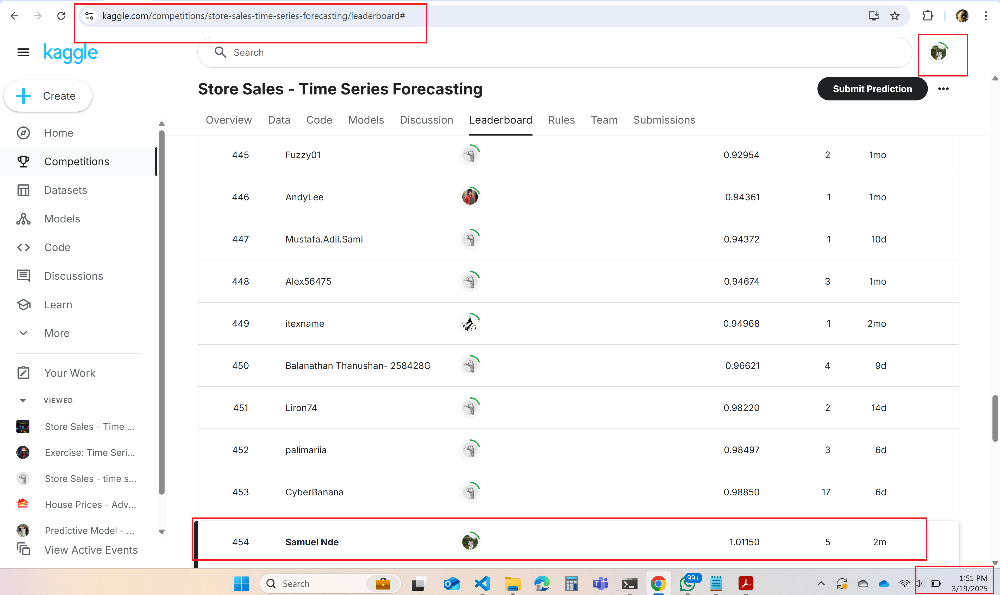